## Preamble

In [29]:
# installing modules

import sys
!{sys.executable} -m pip install sympy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 58.8 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 536.2/536.2 kB 72.2 MB/s eta 0:00:00


In [1]:
#python3.8.1 kernel (/usr/local/bin/python3.8)
import sys
import math
import os
import random
import numpy as np
import pandas as pd
from scipy.integrate import odeint, solve_ivp
from scipy.optimize import curve_fit
from scipy.linalg import eig
from scipy.optimize import minimize
from SALib.sample import sobol

import decimal
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib as mpl
from ipywidgets import interact, widgets, FloatSlider 
from ipywidgets import Tab, VBox, HBox
import seaborn as sns
from numba import njit
#from diffeqpy import de

%matplotlib widget
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
from matplotlib.animation import FuncAnimation
import matplotlib.gridspec as gridspec

class CustomFormatter(ticker.FormatStrFormatter):
    def __call__(self, x, pos=None):
        if x == 0:
            return '0'
        else:
            return ticker.FormatStrFormatter.__call__(self, x, pos)


### Set global plotting parameters

In [25]:
mpl.rcParams['axes.formatter.useoffset'] = False  # Disable offset for all axes
mpl.rcParams['axes.formatter.limits'] = (-5, 6)  # Use scientific notation if log10 of the axis range is outside the range -5 to 6
mpl.rcParams['figure.figsize'] = (8,8)
#mpl.rcParams['figure.dpi'] = 100
mpl.rcParams.update({'font.size': 18})
plt.rcParams["figure.autolayout"] = True


#### Latex style
- In terminal:
    - sudo apt-get install cm-super
    - sudo apt-get install dvipng

In [27]:
mpl.rc('font', **{'family': 'serif', 'serif': ['Computer Modern']})
mpl.rc('text', usetex=True)
mpl.rc('text.latex', preamble=r"""
\usepackage{amsmath}
\usepackage{graphicx}
\newcommand{\mydash}{\raisebox{0.1em}{\scalebox{1}[1.2]{-}}}
\newcommand{\mydot}{\raisebox{0.2em}{\scalebox{0.5}{$\bullet$}}}
""")

### Dir setup

In [40]:
os.getcwd()


'/home/kyle/projects/kinetics/examples'

In [3]:
os.mkdir('kineticModel')

In [4]:
os.chdir('kineticModel')

FileNotFoundError: [Errno 2] No such file or directory: 'kineticModel'

## Garbage Can

In [251]:
import psutil

# Display process memory usage using psutil
process = psutil.Process()
print(f"Memory Usage: {process.memory_info().rss / 1024 ** 2} MB")

Memory Usage: 2669.328125 MB


In [249]:
from sys import getsizeof
from collections.abc import Mapping, Container

def deep_getsizeof(o, ids):
    """Find the memory footprint of a Python object
This is a recursive function that drills down a Python object graph
like a dictionary holding nested dictionaries with lists of lists
and tuples and sets.
:param o: the object
:param ids:
:return:
"""
    d = deep_getsizeof
    if id(o) in ids:
        return 0
    r = getsizeof(o)
    ids.add(id(o))

    if isinstance(o, str):
        return r
    if isinstance(o, Mapping):
        return r + sum(d(k, ids) + d(v, ids) for k, v in o.items())
    if isinstance(o, Container):
        return r + sum(d(x, ids) for x in o)
    return r

# Function to find the size of a variable in MB
def sizeof_fmt(num, suffix='B'):
    for unit in ['', 'Ki', 'Mi', 'Gi', 'Ti', 'Pi', 'Ei', 'Zi']:
        if abs(num) < 1024.0:
            return f"{num:.1f} {unit}{suffix}"
        num /= 1024.0
    return f"{num:.1f} Yi{suffix}"

# Get the largest variables
largest_variables = {}
largest_variables = {name: deep_getsizeof(obj, set()) for name, obj in globals().items()}

# Sum of all variable sizes
total_size = sum(largest_variables.values())
print(f"Total size: {sizeof_fmt(total_size)}")

# Display the sorted largest variables
for name, size in sorted(largest_variables.items(), key=lambda x: x[1], reverse=True):
    print(f"{name}: {sizeof_fmt(size)}")

Total size: 5.0 MiB
t: 2.3 MiB
_ih: 896.7 KiB
In: 896.7 KiB
schemes: 12.8 KiB
scheme: 12.5 KiB
_i156: 11.9 KiB
_i159: 11.9 KiB
_i165: 11.9 KiB
_i158: 11.9 KiB
_i209: 11.9 KiB
_i210: 11.9 KiB
_i167: 11.9 KiB
_i208: 11.9 KiB
_i204: 11.9 KiB
_i187: 11.9 KiB
_i171: 11.9 KiB
_i181: 11.9 KiB
_i183: 11.9 KiB
_i185: 11.9 KiB
_i169: 11.9 KiB
_i173: 11.9 KiB
_i175: 11.9 KiB
_i177: 11.9 KiB
_i179: 11.9 KiB
_i28: 9.9 KiB
_i85: 9.9 KiB
_i97: 9.9 KiB
_i119: 9.9 KiB
_i36: 9.9 KiB
_i45: 9.9 KiB
_i46: 9.9 KiB
_i47: 9.9 KiB
_i48: 9.9 KiB
_i49: 9.9 KiB
_i50: 9.9 KiB
_i51: 9.9 KiB
_i55: 9.9 KiB
_i56: 9.9 KiB
_i57: 9.9 KiB
_i58: 9.9 KiB
_i59: 9.9 KiB
_i60: 9.9 KiB
_i83: 9.9 KiB
_i121: 9.9 KiB
_i89: 9.9 KiB
_i99: 9.9 KiB
_i112: 9.9 KiB
_i114: 9.9 KiB
_i116: 9.9 KiB
_i118: 9.9 KiB
_i123: 9.9 KiB
_i124: 9.9 KiB
_i134: 9.9 KiB
_i135: 9.9 KiB
_i147: 9.9 KiB
_i151: 9.9 KiB
_i155: 9.9 KiB
_i153: 9.9 KiB
_i149: 9.9 KiB
_i15: 9.8 KiB
_i17: 9.8 KiB
_i19: 9.8 KiB
_i22: 9.8 KiB
_i31: 9.8 KiB
_i34: 9.8 KiB
_i109: 8.9 K

In [250]:
import gc
gc.collect()

597

## Generic

In [20]:
class kinData: #deprecated 
    def __init__(self):
        self.ratioDict = {}
        self.concArr0=[]
        self.sol=None

class Constants:
    def __init__(self):
        self.q=1.0*1.60218e-19 # unit charge q
        self.kb=1.38064853e-23 # Boltzmann coefficient kb
        self.kcal2j = 4184.0 # conversion factor from kcal to j 
        self.Navg   = 6.02e23 # Avogadro number mol**-1

## Two state
-    L+P <-> L*P


In [7]:
class TwoState():
    """
    L + P  <--kon/koff-->  L_P 
    """
    def __init__(self,Ki,koff,conc0Arr):
        self.Ki = Ki
        self.koff = koff
        self.kon = self.koff / Ki
        self.conc0Arr = conc0Arr
        self.sol=None

 
    def dcdt(self,concArr, t,kon,koff):
        """
        Define the function that describes the rate of change of the concentrations
        """
        L, P, L_P  = concArr
        dLdt = koff*L_P - kon*L*P
        dPdt = koff*L_P - kon*L*P 
        dL_Pdt = kon*L*P - koff*L_P
        return [dLdt, dPdt, dL_Pdt]

    def solve(self,t):
        def dcdt_wrapper(concArr, t):
            return self.dcdt(concArr, t, self.kon, self.koff)
        return odeint(dcdt_wrapper, self.conc0Arr, t)

    def survivalTime(t,sol,initialConc):
        """
        Calc survival time of last state when kon = 0 and initial conc of last state = 1
        """
        # Find the index of the time at which LP reaches 0.5
        L_P = sol[:, 2]
        time_index = np.where(L_P <= (initialConc/2))[0][0]

        # The time at which LP reaches 0.5 is at the corresponding index in the time array
        time_to_reach_half = t[time_index]
        return time_to_reach_half
    
    def resTime(t,sol,initialConc):
        """
        Calc residence time of bound states when kon = 0 
        """
        # Find the index of the time at which LP reaches 0.5
        boundL = sol[:, 2]
        try:
            time_index = np.where(boundL <= (initialConc/2))[0][0]
        except:
            time_index=-1
        # The time at which LP reaches 0.5 is at the corresponding index in the time array
        time_to_reach_half = t[time_index]
        return time_to_reach_half



## Three state
-    L+P <-> L*P <-> LP
     - https://journals.sagepub.com/doi/pdf/10.1177/1087057116671509

In [8]:
# Refactor the dcdt method into a standalone function to be compiled into machine code
@njit    
def dcdt_three(t,concArr, params):
    """
    Define the function that describes the rate of change of the concentrations
    """
    kon,koff,kinactf,kinactb=params
    L, P, L_P, LP  = concArr
    dLdt = koff*L_P - kon*L*P
    dPdt = koff*L_P - kon*L*P 
    dL_Pdt = kon*L*P - koff*L_P - kinactf*L_P + kinactb*LP
    dLPdt = kinactf*L_P - kinactb*LP
    return [dLdt, dPdt, dL_Pdt, dLPdt]


class ThreeState():
    """
    L + P  <--kon/koff-->  L_P  <--kqmf/kqmb-->  LP
    """
    def __init__(self,Ki,koff,kinactf,kinactb,conc0Arr):
        self.Ki = Ki
        self.koff = koff
        self.kon = self.koff / Ki
        self.kinactf=kinactf
        self.kinactb=kinactb
        self.conc0Arr = conc0Arr
        self.sol=None
        
    #solve_ivp version
    def solve(self, t):
        t_span = (t[0], t[-1])
        params = (self.kon, self.koff, self.kinactf, self.kinactb)
        solution = solve_ivp(dcdt_three, t_span, self.conc0Arr, t_eval=t, args=(params,), method='BDF', rtol=1e-6, atol=1e-8)
        return solution.y.T

    def survivalTime(t,sol,initialConc):
        """
        Calc survival time of last state when kon = 0 and initial conc of last state = 1
        """
        # Find the index of the time at which LP reaches 0.5
        LP = sol[:, 3]
        time_index = np.where(LP <= (initialConc/2))[0][0]

        # The time at which LP reaches 0.5 is at the corresponding index in the time array
        time_to_reach_half = t[time_index]
        return time_to_reach_half
    
    def resTime(t,sol,initialConc):
        """
        Calc residence time of bound states when kon = 0 
        """
        # Find the index of the time at which LP reaches 0.5
        boundL = sol[:, 2]+sol[:, 3]
        try:
            time_index = np.where(boundL <= (initialConc/2))[0][0]
        except:
            time_index=-1
        # The time at which LP reaches 0.5 is at the corresponding index in the time array
        time_to_reach_half = t[time_index]
        return time_to_reach_half
    




## Four state
- L + P <--kon/koff--> L__P <--k1f/k1b--> L_P <--kqmf/kqmb--> LP


In [9]:
# Refactor the dcdt method into a standalone function to be compiled into machine code
@njit
def dcdt_four(t, concArr, params):
    """
    Define the function that describes the rate of change of the concentrations
    """
    kon, koff, k1f, k1b, kqmf, kqmb = params
    L, P, L__P, L_P, LP  = concArr
    #Kd=(L*P)/(L__P+L_P+LP)
    dLdt = koff*L__P - kon*L*P
    dPdt = koff*L__P - kon*L*P #+ kqmf*L_P #last term is for testing substrate model where P becomes free after catalysis. This term prevents P from limiting LP production!!
    dL__Pdt = kon*L*P - koff*L__P - k1f*L__P + k1b*L_P 
    dL_Pdt = k1f*L__P - k1b*L_P - kqmf*L_P + kqmb*LP
    dLPdt = kqmf*L_P - kqmb*LP
    return [dLdt, dPdt, dL__Pdt, dL_Pdt, dLPdt]

class FourState():
    """
    L + P  <--kon/koff-->  L__P  <--k1f/k1b-->  L_P  <--kqmf/kqmb-->  LP
    """
    def __init__(self,Ki,koff,intOOM,Pf,kqmf,kqmb,conc0Arr):
        self.Ki = Ki
        self.koff = koff
        self.kon = self.koff / Ki
        self.intOOM=intOOM
        self.Pf=Pf
        self.k1f, self.k1b = self.getIntRates(self.intOOM, self.Pf)
        self.kqmf=kqmf
        self.kqmb=kqmb
        self.conc0Arr=conc0Arr
        self.ratioDict = {}
        
    def getIntRates(self,intOOM,Pf):
        k1f=Pf*10**(float(intOOM)+1)
        k1b=10**(float(intOOM)+1)-k1f
        return k1f,k1b

    #odeint version
    #
    #def dcdt(self,concArr, t):
    #    """
    #    Define the function that describes the rate of change of the concentrations
    #    """
    #    return dcdt_func(concArr, t, self.kon, self.koff, self.k1f, self.k1b, self.kqmf, self.kqmb)
    
    #def solve(self, t):
    #    return odeint(self.dcdt, self.conc0Arr, t)

    #solve_ivp version
    def solve(self, t):
        t_span = (t[0], t[-1])
        params = (self.kon, self.koff, self.k1f, self.k1b, self.kqmf, self.kqmb)
        solution = solve_ivp(dcdt_four, t_span, self.conc0Arr, t_eval=t, args=(params,), method='BDF', rtol=1e-6, atol=1e-8)
        return solution.y.T

    
    #julia version
    #def solve(self, t):
    #    t_span = (t[0], t[-1])
    #    params = (self.kon, self.koff, self.k1f, self.k1b, self.kqmf, self.kqmb)
    #    prob = de.ODEProblem(dcdt_func, self.conc0Arr, t_span, params)
    #    sol = de.solve(prob,saveat=t)
    #    return np.array(sol.u).T


    def survivalTime(t,sol):
        """
        Calc survival time of last state when kon = 0 
        """
        # Find the index of the time at which LP reaches 0.5
        LP = sol[:, 4]
        time_index = np.where(LP <= 0.5)[0][0]

        # The time at which LP reaches 0.5 is at the corresponding index in the time array
        time_to_reach_half = t[time_index]
        return time_to_reach_half
    
    def resTime(t,sol,LP0):
        """
        Calc survival time of bound state when kon = 0 
        """
        # Find the index of the time at which LP reaches 0.5
        boundL = sol[:, 2]+sol[:, 3]+sol[:, 4]
        try:
            time_index = np.where(boundL <= (LP0/2))[0][0]
        except:
            time_index=-1
        # The time at which LP reaches 0.5 is at the corresponding index in the time array
        time_to_reach_half = t[time_index]
        return time_to_reach_half

    @classmethod
    def koff_eff(cls, koff, Pf):
        """
        koff_eff (eff. off-rate constant) calculation.
        
        Args:
            koff: off-rate constant (s^-1)
            Pf: fraction of forward intermediate 
        """
        return koff * (1-Pf)

    #@classmethod
    #def Ki(cls, kon, koff):
    #    """
    #    Ki (eq. inhib. dissociation constant) calculation
    #    
    #    Args:
    #        kon: on-rate constant (nM^-1*s^-1)
    #        koff: off-rate constant (s^-1)
    #    """
    #    return koff / kon
    
    @classmethod
    def Ki_eff(cls, kon, koff, Pf):
        """
        Ki_eff (effective eq. inhib. dissociation constant) calculation
        
        Args:
            kon: on-rate constant (nM^-1*s^-1)
            koff: off-rate constant (s^-1)
            Pf: fraction of forward intermediate 
        """
        return (koff * (1-Pf)) / kon
    
    @classmethod
    def KI(cls, kon, koff, kinact):
        """
        KI (inhibition constant) calculation
        
        Args:
            kon: on-rate constant (nM^-1*s^-1)
            koff: off-rate constant (s^-1) 
            kinact: inactivation (last irrev step) rate 
        """
        return (koff + kinact) / kon
    
    @classmethod
    def KI_eff(cls, kon, koff, Pf, kinact):
        """
        KI (eff. inhibition constant) calculation
        
        Args:
            kon: on-rate constant (nM^-1*s^-1)
            koff: off-rate constant (s^-1)
            Pf: fraction of forward intermediate 
            kinact: inactivation (last irrev step) rate 
        """
        return (koff * (1-Pf) + kinact * Pf) / kon

    @classmethod
    def kinact_eff(cls, Pf, kinact):
        """
        kinact_eff (eff. inactivation rate constant) calculation.
        
        Args:
            Pf: fraction of forward intermediate 
            kinact: inactivation (last irrev step) rate 
        """
        return kinact*Pf
    
    @classmethod
    def specificity(cls, kon, koff, kinact):
        """
        specificity (specificity constant) calculation (kinact/KI)
        """
        return kinact/cls.KI(kon, koff, kinact)
    
    @classmethod
    def specificity_eff(cls, kon, koff, Pf, kinact):
        """
        specificity_eff (eff. specificity constant) calculation (kinact_eff/KI_eff)
        """
        return cls.kinact_eff(Pf, kinact)/cls.KI_eff(kon, koff, Pf, kinact)
    

    


## Four state - Reduced
- A + A' <--> B <--> C <--> D
- A + A' <----> X <----> D

In [10]:
# Refactor the dcdt method into a standalone function to be compiled into machine code
@njit
def dcdt_fourR(t, concArr, params):
    """
    Define the function that describes the rate of change of the concentrations
    """
    kon, koff, k1f, k1b, kqmf, kqmb = params
    L, P, L_P, LP  = concArr
    #Kd=(L*P)/(L__P+L_P+LP)
    dLdt = ((koff*k1b)/(k1f+k1b))*L_P - kon*L*P
    dPdt = ((koff*k1b)/(k1f+k1b))*L_P - kon*L*P #+ kqmf*L_P #last term is for testing substrate model where P becomes free after catalysis. This term prevents P from limiting LP production!!
    dL_Pdt = kon*L*P + kqmb*LP - (((koff*k1b)+(kqmf*k1f))/(k1f+k1b))*L_P
    dLPdt = ((kqmf*k1f)/(k1f+k1b))*L_P - kqmb*LP
    return [dLdt, dPdt, dL_Pdt, dLPdt]

class FourStateR():
    """
    L + P  <--kon/koff-->  L__P  <--k1f/k1b-->  L_P  <--kqmf/kqmb-->  LP

    L__P and L_P are grouped into one intermediate state. 
    """
    def __init__(self,Ki,koff,intOOM,Pf,kqmf,kqmb,conc0Arr):
        self.Ki = Ki
        self.koff = koff
        self.kon = self.koff / Ki
        self.intOOM = intOOM
        self.Pf = Pf
        self.Pb = 1-self.Pf
        self.k1f, self.k1b = self.getIntRates(self.intOOM, self.Pf)
        self.kqmf=kqmf
        self.kqmb=kqmb
        self.conc0Arr=conc0Arr #L,P,X,LP
        self.koff_eff = self.Pb * self.koff
        self.kqmf_eff = self.Pf * self.kqmf 
        self.ratioDict = {}

        # Eigenvalue analysis
        self.J = self.jacobian(self.conc0Arr)
        self.eigenvalues, self.eigenvectors = eig(self.J)
        #sort
        idx = self.eigenvalues.argsort()[::-1]   
        self.eigenvalues = self.eigenvalues[idx]
        self.eigenvectors = self.eigenvectors[:,idx]
        
        negative_eigenvalues = [val for val in np.real(self.eigenvalues) if val < -1e-9]
        self.slowest_eigenvalue = max(negative_eigenvalues) if negative_eigenvalues else None

        
    def getIntRates(self,intOOM,Pf):
        k1f=Pf*10**(float(intOOM)+1)
        k1b=10**(float(intOOM)+1)-k1f
        return k1f,k1b

    
    def solve(self, t):
        t_span = (t[0], t[-1])
        params = (self.kon, self.koff, self.k1f, self.k1b, self.kqmf, self.kqmb)
        solution = solve_ivp(dcdt_fourR, t_span, self.conc0Arr, t_eval=t, args=(params,), method='BDF', rtol=1e-6, atol=1e-8)
        return solution.y.T
    

    def jacobian(self,concArr):
        '''
        concArr[0] should be ligand and concArr[1] should be protein   
        '''
        # Initialize the 4x4 Jacobian
        J = np.zeros((4, 4))

        # Derivatives for dL/dt
        J[0, 0] = -self.kon * concArr[1]  # dL/dL
        J[0, 1] = -self.kon * concArr[0]  # dL/dP
        J[0, 2] = (self.koff * self.k1b) / (self.k1f + self.k1b)  # dL/dL_P
        # Derivatives for dP/dt
        J[1, 0] = -self.kon * concArr[1]  # dP/dL
        J[1, 1] = -self.kon * concArr[0]  # dP/dP
        J[1, 2] = (self.koff * self.k1b) / (self.k1f + self.k1b) + self.kqmf  # dP/dL_P
        # Derivatives for dL_P/dt
        J[2, 0] = self.kon * concArr[1]  # dL_P/dL
        J[2, 1] = self.kon * concArr[0]  # dL_P/dP
        J[2, 2] = -(self.koff * self.k1b + self.kqmf * self.k1f) / (self.k1f + self.k1b)  # dL_P/dL_P
        J[2, 3] = self.kqmb  # dL_P/dLP
        # Derivatives for dLP/dt
        J[3, 2] = (self.kqmf * self.k1f) / (self.k1f + self.k1b)  # dLP/dL_P
        J[3, 3] = -self.kqmb  # dLP/dLP

        return J



## A <--> X <--> D
- X=B+C from A <--> B <--> C <--> D


In [11]:
# Refactor the dcdt method into a standalone function to be compiled into machine code
@njit
def dcdt_AXD(t, concArr, params):
    """
    Define the function that describes the rate of change of the concentrations
    """
    kon, koff, k1f, k1b, kqmf, kqmb = params
    A,X,D  = concArr
    dAdt = ((koff*k1b)/(k1f+k1b))*X - kon*A
    dXdt = kon*A + kqmb*D - (((koff*k1b)+(kqmf*k1f))/(k1f+k1b))*X
    dDdt = ((kqmf*k1f)/(k1f+k1b))*X - kqmb*D
    return [dAdt, dXdt, dDdt]

class AXD():
    """
    A  <--kon/koff-->  B  <--k1f/k1b-->  C  <--kqmf/kqmb-->  D

    B and C are grouped into one intermediate state X
    """
    def __init__(self,Ki,koff,intOOM,Pf,kqmf,kqmb,conc0Arr):
        self.Ki = Ki
        self.koff = koff
        self.kon = self.koff / Ki
        self.intOOM = intOOM
        self.Pf = Pf
        self.Pb = 1-self.Pf
        self.k1f, self.k1b = self.getIntRates(self.intOOM, self.Pf)
        self.kqmf=kqmf
        self.kqmb=kqmb
        self.conc0Arr=conc0Arr #A,B,C,D
        self.koff_eff = self.Pb * self.koff
        self.kqmf_eff = self.Pf * self.kqmf 
        self.ratioDict = {}

        # Eigenvalue analysis
        self.J = self.jacobian()
        self.eigenvalues, self.eigenvectors = eig(self.J)
        #sort
        idx = self.eigenvalues.argsort()[::-1]   
        self.eigenvalues = self.eigenvalues[idx]
        self.eigenvectors = self.eigenvectors[:,idx]
        
        negative_eigenvalues = [val for val in np.real(self.eigenvalues) if val < -1e-9]
        self.slowest_eigenvalue = max(negative_eigenvalues) if negative_eigenvalues else None

        
    def getIntRates(self,intOOM,Pf):
        k1f=Pf*10**(float(intOOM)+1)
        k1b=10**(float(intOOM)+1)-k1f
        return k1f,k1b

    
    def solve(self, t):
        t_span = (t[0], t[-1])
        params = (self.kon, self.koff, self.k1f, self.k1b, self.kqmf, self.kqmb)
        solution = solve_ivp(dcdt_AXD, t_span, self.conc0Arr, t_eval=t, args=(params,), method='BDF', rtol=1e-6, atol=1e-8)
        return solution.y.T
    

    def jacobian(self):
        J = np.array([
            [-self.kon, self.koff_eff, 0],
            [self.kon, -(self.koff_eff + self.kqmf_eff), self.kqmb],
            [0, self.kqmf_eff, -self.kqmb]
        ])
        return J



## Fitting to IB data

### Sliders

In [94]:
#this code plots concentration over time

#from https://jpet.aspetjournals.org/content/372/3/331#sec-3 
Ki=0.95 #nM
kqmf=0.012 #s^-1, kinact (K2)
#kqmf=2.66e-2 #s^-1voice...mulholland 2021
kqmb=0 #(K-2)

#Ib-rev https://www.rcsb.org/structure/5P9I

koff = 1/(60*1) #s^1, estimate
kon=koff/Ki #Ki=koff/kon, units: nM^-1 s^-1

# Define the reaction rate constants

#k1f = 400000
#k1b = 600000
intOOM=5 #order of mag for rates. rates have units of s^1
Pf=0.5

k1f,k1b=FourState.getIntRates(intOOM,Pf)

t = np.linspace(0, 1000, 10000)
t_hr=t/3600

# Define the initial concentrations of the species (nM)
L0 = 1.615055829
P0 = 0.35
L__P0 = 0
L_P0 = 0
LP0 = 0

FourStateData=kinData()
FourStateData.concArr0=[L0, P0, L__P0, L_P0, LP0]

ThreeStateData=kinData()
ThreeStateData.concArr0=[L0, P0, L_P0, LP0]

TwoStateData=kinData()
TwoStateData.concArr0=[L0, P0, L_P0]


formatter='.2e'

# Create slider bars
kon_slider = FloatSlider(min=kon*0.1, max=kon*10, step=kon*0.1, value=kon,readout_format=formatter)
koff_slider = FloatSlider(min=koff*0.1, max=koff*10, step=koff*0.1, value=koff,readout_format=formatter)
Pf_slider = FloatSlider(min=0, max=1, step=0.1, value=Pf)
intOOM_slider = FloatSlider(min=-5, max=5, step=1, value=intOOM)
kqmf_slider = FloatSlider(min=kqmf*0.1, max= kqmf*10, step=kqmf*0.1,value=kqmf,readout_format=formatter)
kqmb_slider = FloatSlider(min=0, max=0.1, step=0.0001, value=kqmb,readout_format=formatter)


# Define the function that will be called when the slider value changes
def update_plot(kon=kon,koff=koff,Pf=Pf,intOOM=intOOM,kqmf=kqmf,kqmb=kqmb):
    k1f,k1b=FourState.getIntRates(intOOM,Pf)
    FourStateSol = odeint(FourState.dcdt, FourStateData.concArr0, t,args=(kon,koff,k1f,k1b,kqmf,kqmb))
    ThreeStateSol = odeint(ThreeState.dcdt, ThreeStateData.concArr0, t,args=(kon,koff,kqmf,kqmb))
    TwoStateSol = odeint(TwoState.dcdt, TwoStateData.concArr0, t,args=(kon,koff))
    #Plotting
    gs = gridspec.GridSpec(2, 1, height_ratios=[1, 1], hspace=0)
    ax1 = plt.subplot(gs[0])
    #ax1.plot(t, FourStateSol[:, 0], label='Unbound', color="orange")
    ax1.plot(t, TwoStateSol[:, 2], label="Bound (Two State)",color="red",linestyle='-.')
    ax1.plot(t, ThreeStateSol[:, 2]+ThreeStateSol[:, 3], label="Bound (Three State)",color="black",linestyle='--')
    ax1.plot(t, FourStateSol[:, 2]+FourStateSol[:, 3]+FourStateSol[:, 4], label='Bound (Four State)',color="slateblue")
    ax1.legend()
    ax1.set_ylabel('Concentration (nM)')
    
    ax2 = plt.subplot(gs[1], sharex=ax1)
    #a2.plot(t, FourStateSol[:, 0], label='L')
    #a2.plot(t, FourStateSol[:, 1], label='P')
    ax2.plot(t, FourStateSol[:, 2], label='L**P',color="green")
    ax2.plot(t, FourStateSol[:, 3], label='L*P',color="blue")
    ax2.plot(t, FourStateSol[:, 4], label='LP',color="purple")
    ax2.legend()
    ax2.set_ylabel('Concentration (nM)')
    ax2.set_xlabel('Time (s)')

    plt.show()

# Create the interactive plot
interact(update_plot, kon=kon_slider,koff=koff_slider,Pf=Pf_slider,intOOM=intOOM_slider,kqmf=kqmf_slider,kqmb=kqmb_slider)

TypeError: FourState.getIntRates() missing 1 required positional argument: 'Pf'

In [104]:
#this code finds restime

kon=0
kqmb_l = np.linspace(0.001, 0.1, 100)
# Define the initial concentrations of the species
L0 = 0
P0 = 0
L__P0 = 0
L_P0 = 0
LP0 = 1

FourStateData=kinData()
FourStateData.concArr0=[L0, P0, L__P0, L_P0, LP0]

ThreeStateData=kinData()
ThreeStateData.concArr0=[L0, P0, L_P0, LP0]

# Create slider bars
koff_slider = FloatSlider(min=koff*0.1, max=koff*10, step=koff*0.1, value=koff,readout_format=formatter)
Pf_slider = FloatSlider(min=0, max=1, step=0.1, value=Pf)
intOOM_slider = FloatSlider(min=-5, max=10, step=1, value=intOOM)
kqmf_slider = FloatSlider(min=kqmf*0.1, max=kqmf*10, step=kqmf*0.1, value=kqmf,readout_format=formatter)

# Define the function that will be called when the slider value changes
def update_plot(koff=koff,Pf=Pf,intOOM=intOOM,kqmf=kqmf):
    k1f,k1b=FourState.getIntRates(intOOM,Pf)
    FourStateRT=[]
    for kqmb in kqmb_l: 
        sol = odeint(FourState.dcdt, FourStateData.concArr0, t,args=(kon,koff,k1f,k1b,kqmf,kqmb))
        FourStateRT.append(FourState.resTime(t,sol,LP0))
        
    ThreeStateRT=[]
    for kqmb in kqmb_l: 
        sol = odeint(ThreeState.dcdt, ThreeStateData.concArr0, t,args=(kon,koff,kqmf,kqmb))
        ThreeStateRT.append(ThreeState.resTime(t,sol,LP0))
    
    # Plot the concentrations of the species over time
    plt.xlim([0, kqmb_l.max()])
    plt.ylim([0, t.max()+(t.max()*0.1)]) 
    plt.plot(kqmb_l, FourStateRT, label="Four State")
    plt.plot(kqmb_l, ThreeStateRT, label="Three State",color="black",linestyle='--')
    plt.xlabel('kQMb')
    plt.ylabel('Res time (s)') 
    plt.legend()
    plt.show()

# Create the interactive plot
interact(update_plot, koff=koff_slider,Pf=Pf_slider,intOOM=intOOM_slider,kqmf=kqmf_slider)

interactive(children=(FloatSlider(value=0.016666666666666666, description='koff', max=0.16666666666666666, min…

<function __main__.update_plot(koff=0.016666666666666666, kf2bRatio=0.5, intOOM=5, kqmf=0.012)>

### Nice Plots

In [144]:
#this code plots concentration over time

#from https://jpet.aspetjournals.org/content/372/3/331#sec-3 
Ki=0.95 #nM
kqmf=0.012 #s^-1, kinact (K2)
#kqmf=2.66e-2 #s^-1voice...mulholland 2021
kqmb=0 #(K-2)

#Ib-rev https://www.rcsb.org/structure/5P9I

koff = 1/(60*1) #s^1, estimate
kon=koff/Ki #Ki=koff/kon, units: nM^-1 s^-1

# Define the reaction rate constants

intOOM=5 #order of mag for rates. rates have units of s^1
Pf=np.arange(0, 1.1, 0.1)
Pf[0]=0.000001 #replace 0 with ~0
Pf[-1]=0.999999 #replace 1 with ~1



# Define the initial concentrations of the species (nM)
L0 = 1
P0 = 1
L__P0 = 0
L_P0 = 0
LP0 = 0

t = np.linspace(0, 1000, 10000)
t_hr=t/3600

FourStateData=kinData()
FourStateData.concArr0=[L0, P0, L__P0, L_P0, LP0]
for ratio in Pf: 
    k1f,k1b=FourState.getIntRates(intOOM,ratio)
    FourStateData.ratioDict[ratio]=odeint(FourState.dcdt, FourStateData.concArr0, t,args=(kon,koff,k1f,k1b,kqmf,kqmb))

ThreeStateData=kinData()
ThreeStateData.concArr0=[L0, P0, L_P0, LP0]
ThreeStateData.sol = odeint(ThreeState.dcdt, ThreeStateData.concArr0, t,args=(kon,koff,kqmf,kqmb))
    
#Plotting
colors = sns.color_palette("viridis", len(Pf))
plt.figure(dpi=800)
i=0
for ratio in FourStateData.ratioDict:
    sol=FourStateData.ratioDict[ratio]
    if np.round(ratio,1)==0:
        label="~0"
    elif np.round(ratio,1)==1:
        label="~1"
    else:
        label=np.round(ratio,1)
    plt.plot(t, sol[:, 2]+sol[:, 3]+sol[:, 4], label=label,color=colors[i])
    i+=1
    
plt.plot(t, ThreeStateData.sol[:, 2]+ThreeStateData.sol[:, 3], label="Three State",color="black",linestyle='--',lw=3)

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
plt.title('Bound Ligand Formation for Different $k^{int}_f:k^{int}_b$ ($k^{QM}_b$=0)')

plt.ylabel('Concentration (nM)')
plt.xlabel('Time (s)')
plt.savefig('bound_formation.png')
plt.show()


In [359]:
#this code plots concentration over time

#from https://jpet.aspetjournals.org/content/372/3/331#sec-3 
Ki=0.95 #nM
kqmf=0.012 #s^-1, kinact (K2)
#kqmf=2.66e-2 #s^-1voice...mulholland 2021
kqmb=0 #(K-2)

#Ib-rev https://www.rcsb.org/structure/5P9I

koff = 1/(60*1) #s^1, estimate
kon=koff/Ki #Ki=koff/kon, units: nM^-1 s^-1

# Define the reaction rate constants

intOOM=5 #order of mag for rates. rates have units of s^1
Pf=np.arange(0, 1.1, 0.1)
Pf[0]=0.000001 #replace 0 with ~0
Pf[-1]=0.999999 #replace 1 with ~1



# Define the initial concentrations of the species (nM)
L0 = 1
P0 = 1
L__P0 = 0
L_P0 = 0
LP0 = 0

t = np.linspace(0, 1000, 10000)
t_hr=t/3600

FourStateData=kinData()
FourStateData.concArr0=[L0, P0, L__P0, L_P0, LP0]
for ratio in Pf: 
    k1f,k1b=FourState.getIntRates(intOOM,ratio)
    FourStateData.ratioDict[ratio]=odeint(FourState.dcdt, FourStateData.concArr0, t,args=(kon,koff,k1f,k1b,kqmf,kqmb))

ThreeStateData=kinData()
ThreeStateData.concArr0=[L0, P0, L_P0, LP0]
ThreeStateData.sol = odeint(ThreeState.dcdt, ThreeStateData.concArr0, t,args=(kon,koff,kqmf,kqmb))
    
#Plotting
colors = sns.color_palette("viridis", len(Pf))
plt.figure(dpi=800)
i=0
for ratio in FourStateData.ratioDict:
    sol=FourStateData.ratioDict[ratio]
    if np.round(ratio,1)==0:
        label="~0"
    elif np.round(ratio,1)==1:
        label="~1"
    else:
        label=np.round(ratio,1)
    plt.plot(t, sol[:, 2]+sol[:, 3]+sol[:, 4], label=label,color=colors[i])
    i+=1
    
plt.plot(t, ThreeStateData.sol[:, 2]+ThreeStateData.sol[:, 3], label="Three State",color="black",linestyle='--',lw=3)

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
plt.title('Bound Ligand Formation for Different $k^{int}_f:k^{int}_b$ ($k^{QM}_b$=0)')

plt.ylabel('Concentration (nM)')
plt.xlabel('Time (s)')
plt.savefig('bound_formation.png')
plt.show()


TypeError: getIntRates() missing 1 required positional argument: 'Pf'

In [164]:
#this code plots concentration over time

#from https://jpet.aspetjournals.org/content/372/3/331#sec-3 
Ki=0.95 #nM
kqmf=0.012 #s^-1, kinact (K2)
#kqmf=2.66e-2 #s^-1voice...mulholland 2021
kqmb=0 #(K-2)

#Ib-rev https://www.rcsb.org/structure/5P9I

koff = 1/(60*1) #s^1, estimate
kon=koff/Ki #Ki=koff/kon, units: nM^-1 s^-1

# Define the reaction rate constants

intOOM=5 #order of mag for rates. rates have units of s^1
Pf=np.arange(0, 1.1, 0.1)
Pf[0]=0.000001 #replace 0 with ~0
Pf[-1]=0.999999 #replace 1 with ~1



# Define the initial concentrations of the species (nM)
L0 = 1
P0 = 1
L__P0 = 0
L_P0 = 0
LP0 = 0

t = np.linspace(0, 1000, 10000)
t_hr=t/3600

FourStateData=kinData()
FourStateData.concArr0=[L0, P0, L__P0, L_P0, LP0]
for ratio in Pf: 
    k1f,k1b=FourState.getIntRates(intOOM,ratio)
    FourStateData.ratioDict[ratio]=odeint(FourState.dcdt, FourStateData.concArr0, t,args=(kon,koff,k1f,k1b,kqmf,kqmb))

ThreeStateData=kinData()
ThreeStateData.concArr0=[L0, P0, L_P0, LP0]
ThreeStateData.sol = odeint(ThreeState.dcdt, ThreeStateData.concArr0, t,args=(kon,koff,kqmf,kqmb))
    
#Plotting
colors = sns.color_palette("viridis", len(Pf))
plt.figure(dpi=800)
i=0
for ratio in FourStateData.ratioDict:
    sol=FourStateData.ratioDict[ratio]
    if np.round(ratio,1)==0:
        label="~0"
    elif np.round(ratio,1)==1:
        label="~1"
    else:
        label=np.round(ratio,1)
    plt.plot(t, sol[:, 1], label=label,color=colors[i])
    i+=1
    
plt.plot(t, ThreeStateData.sol[:, 1], label="Three State",color="black",linestyle='--',lw=3)

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
plt.title('Protein Activity for Different $k^{int}_f:k^{int}_b$') #($k^{QM}_b$=0)')

plt.ylabel('Activity')
plt.xlabel('Time (s)')
plt.savefig('activity_decay.png')
plt.show()


In [143]:
#this code plots concentration over time

#from https://jpet.aspetjournals.org/content/372/3/331#sec-3 
Ki=0.95 #nM
kqmf=0.012 #s^-1, kinact (K2)
#kqmf=2.66e-2 #s^-1voice...mulholland 2021
kqmb=kqmf/10 #(K-2)

#Ib-rev https://www.rcsb.org/structure/5P9I

koff = 1/(60*1) #s^1, estimate
kon=koff/Ki #Ki=koff/kon, units: nM^-1 s^-1

# Define the reaction rate constants

intOOM=5 #order of mag for rates. rates have units of s^1
Pf=np.arange(0, 1.1, 0.1)
Pf[0]=0.000001 #replace 0 with ~0
Pf[-1]=0.999999 #replace 1 with ~1



# Define the initial concentrations of the species (nM)
L0 = 0
P0 = 0
L__P0 = 0
L_P0 = 0
LP0 = 1

t = np.linspace(0, 1000, 10000)
t_hr=t/3600


FourStateData=kinData()
FourStateData.concArr0=[L0, P0, L__P0, L_P0, LP0]
for ratio in Pf: 
    k1f,k1b=FourState.getIntRates(intOOM,ratio)
    FourStateData.ratioDict[ratio]=odeint(FourState.dcdt, FourStateData.concArr0, t,args=(kon,koff,k1f,k1b,kqmf,kqmb))

ThreeStateData=kinData()
ThreeStateData.concArr0=[L0, P0, L_P0, LP0]
ThreeStateData.sol = odeint(ThreeState.dcdt, ThreeStateData.concArr0, t,args=(kon,koff,kqmf,kqmb))

#Plotting
colors = sns.color_palette("viridis", len(Pf))
plt.figure(dpi=800)
i=0
for ratio in FourStateData.ratioDict:
    sol=FourStateData.ratioDict[ratio]
    if np.round(ratio,1)==0:
        label="~0"
    elif np.round(ratio,1)==1:
        label="~1"
    else:
        label=np.round(ratio,1)
    plt.plot(t, sol[:, 4], label=label,color=colors[i])
    i+=1
plt.plot(t, ThreeStateData.sol[:, 3], label="Three State",color="black",linestyle='--',lw=3)
#plt.plot(t, np.e**(-t/833), label="Decay",color="orange",linestyle='--',lw=3)


plt.title('Linked Ligand Decay for Different $k^{int}_f:k^{int}_b$ ($k^{QM}_b$=$k^{QM}_f*0.1$)')

plt.ylabel('Concentration (nM)')
plt.xlabel('Time (s)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
plt.savefig('linked_decay.png')
plt.show()


In [122]:
np.e

2.718281828459045

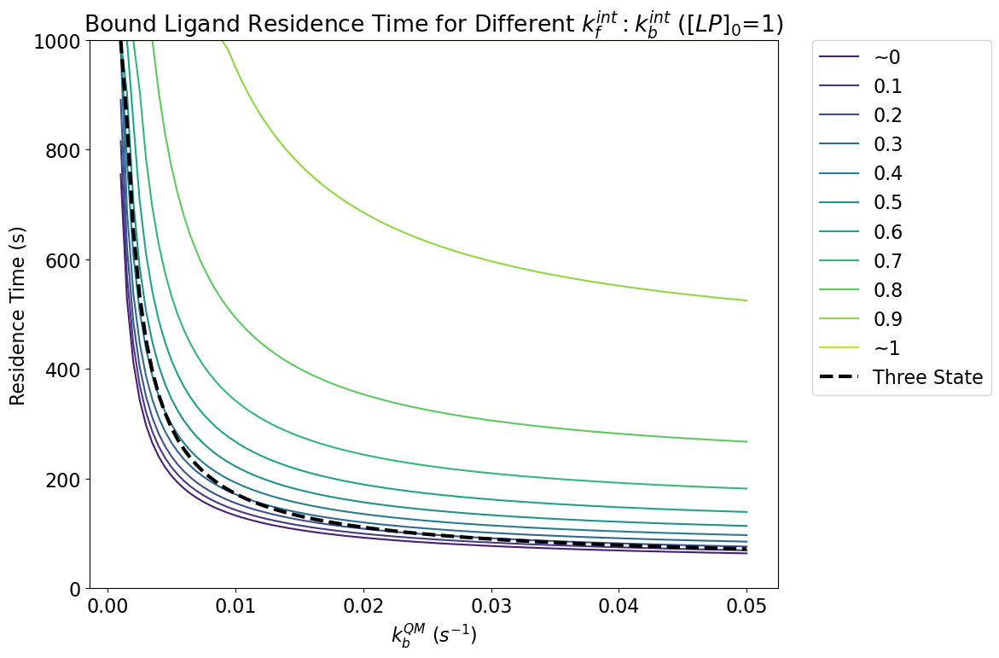

In [151]:
#RESTIME

kqmf=0.012 #s^-1, kinact (K2) ,  https://jpet.aspetjournals.org/content/372/3/331#sec-3 
#kqmf=2.66e-2 #s^-1 , voice...mulholland 2021
kqmb_l = np.linspace(0.001, 0.05, 100)

#Ib-rev https://www.rcsb.org/structure/5P9I

koff = 1/(60*1) #s^1, estimate
kon=0 #Ki=koff/kon, units: nM^-1 s^-1


intOOM=5 #order of mag for rates. rates have units of s^1
Pf=np.arange(0, 1.1, 0.1)
Pf[0]=0.00001 #replace 0 with ~0
Pf[-1]=0.99999 #replace 1 with ~1


# Define the initial concentrations of the species (nM)
L0 = 0
P0 = 0
L__P0 = 0
L_P0 = 0
LP0 = 1
concArr0 = [L0, P0, L__P0, L_P0, LP0]

t = np.linspace(0, 1000, 10000)
t_hr=t/3600


FourStateData=kinData()
FourStateData.concArr0=[L0, P0, L__P0, L_P0, LP0]
for ratio in Pf: 
    k1f,k1b=FourState.getIntRates(intOOM,ratio)
    resTime=[]
    for kqmb in kqmb_l: 
        sol = odeint(FourState.dcdt, FourStateData.concArr0, t,args=(kon,koff,k1f,k1b,kqmf,kqmb))
        resTime.append(FourState.resTime(t,sol,LP0))
    FourStateData.ratioDict[ratio]=resTime


ThreeStateData=kinData()
ThreeStateData.concArr0=[L0, P0, L_P0, LP0]
resTime=[]
for kqmb in kqmb_l: 
    sol = odeint(ThreeState.dcdt, ThreeStateData.concArr0, t,args=(kon,koff,kqmf,kqmb))  
    resTime.append(ThreeState.resTime(t,sol,LP0))
ThreeStateData.sol=resTime

#Plotting
colors = sns.color_palette("viridis", len(Pf))
plt.figure(dpi=100)
i=0
for ratio in FourStateData.ratioDict:
    if np.round(ratio,1)==0:
        label="~0"
    elif np.round(ratio,1)==1:
        label="~1"
    else:
        label=np.round(ratio,1)
    data=FourStateData.ratioDict[ratio]
    plt.plot(kqmb_l, data, label=label,color=colors[i])
    i+=1

plt.plot(kqmb_l, ThreeStateData.sol, label="Three State",color="black",linestyle='--',lw=3)


plt.title('Bound Ligand Residence Time for Different $k^{int}_f:k^{int}_b$ ($[LP]_0$=1)')
plt.ylim([0,1000])
plt.ylabel('Residence Time (s)')
plt.xlabel('$k^{QM}_b$ ($s^{-1}$)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
plt.savefig('restime.png')
plt.show()


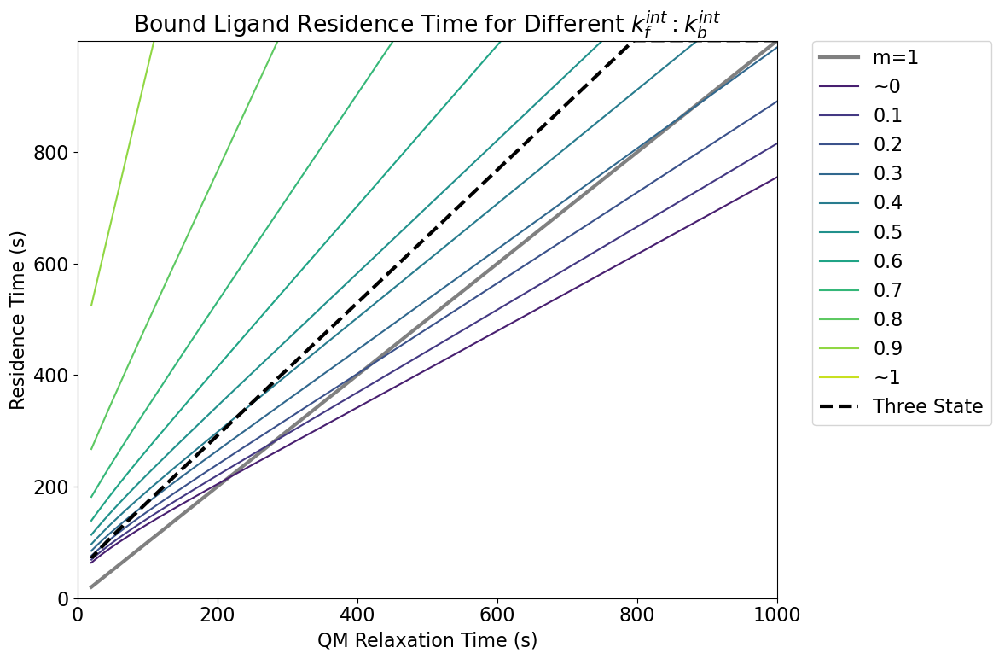

In [162]:
#RESTIME

kqmf=0.012 #s^-1, kinact (K2) ,  https://jpet.aspetjournals.org/content/372/3/331#sec-3 
#kqmf=2.66e-2 #s^-1 , voice...mulholland 2021
kqmb_l = np.linspace(0.001, 0.05, 10000)

#Ib-rev https://www.rcsb.org/structure/5P9I

koff = 1/(60*1) #s^1, estimate
kon=0 #Ki=koff/kon, units: nM^-1 s^-1


intOOM=5 #order of mag for rates. rates have units of s^1
Pf=np.arange(0, 1.1, 0.1)
Pf[0]=0.00001 #replace 0 with ~0
Pf[-1]=0.99999 #replace 1 with ~1


# Define the initial concentrations of the species (nM)
L0 = 0
P0 = 0
L__P0 = 0
L_P0 = 0
LP0 = 1
concArr0 = [L0, P0, L__P0, L_P0, LP0]

t = np.linspace(0, 1000, 10000)
t_hr=t/3600


FourStateData=kinData()
FourStateData.concArr0=[L0, P0, L__P0, L_P0, LP0]
for ratio in Pf: 
    k1f,k1b=FourState.getIntRates(intOOM,ratio)
    resTime=[]
    for kqmb in kqmb_l: 
        sol = odeint(FourState.dcdt, FourStateData.concArr0, t,args=(kon,koff,k1f,k1b,kqmf,kqmb))
        resTime.append(FourState.resTime(t,sol,LP0))
    FourStateData.ratioDict[ratio]=resTime


ThreeStateData=kinData()
ThreeStateData.concArr0=[L0, P0, L_P0, LP0]
resTime=[]
for kqmb in kqmb_l: 
    sol = odeint(ThreeState.dcdt, ThreeStateData.concArr0, t,args=(kon,koff,kqmf,kqmb))  
    resTime.append(ThreeState.resTime(t,sol,LP0))
ThreeStateData.sol=resTime

#Plotting
colors = sns.color_palette("viridis", len(Pf))
plt.figure(dpi=800)
plt.plot(1/kqmb_l,1/kqmb_l,label="m=1",color="grey",linestyle='-',lw=3)
i=0
for ratio in FourStateData.ratioDict:
    if np.round(ratio,1)==0:
        label="~0"
    elif np.round(ratio,1)==1:
        label="~1"
    else:
        label=np.round(ratio,1)
    data=FourStateData.ratioDict[ratio]
    plt.plot(1/kqmb_l, data, label=label,color=colors[i])
    i+=1

plt.plot(1/kqmb_l, ThreeStateData.sol, label="Three State",color="black",linestyle='--',lw=3)

plt.title('Bound Ligand Residence Time for Different $k^{int}_f:k^{int}_b$') #($[LP]_0$=1)')
plt.ylim([0,999])
plt.xlim([0,1000])
plt.ylabel('Residence Time (s)')
plt.xlabel('QM Relaxation Time (s)') #'1/$k^{QM}_b$ ($s$)'
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
plt.savefig('restime.png')
plt.show()


In [199]:
#this code plots concentration over time

#from https://jpet.aspetjournals.org/content/372/3/331#sec-3 
Ki=1 #nM
kqmf=0.012 #s^-1, kinact (K2)
#kqmf=2.66e-2 #s^-1voice...mulholland 2021
kqmb=0 #(K-2)

#Ib-rev https://www.rcsb.org/structure/5P9I

koff = 1/(60*1) #s^1, estimate
kon=koff/Ki #Ki=koff/kon, units: nM^-1 s^-1

# Define the reaction rate constants

intOOM=5 #order of mag for rates. rates have units of s^1
Pf=np.arange(0, 1.1, 0.1)
Pf[0]=0.000001 #replace 0 with ~0
Pf[-1]=0.999999 #replace 1 with ~1

# Define the initial concentrations of the species (nM)
L0 = 1
P0 = 1
L__P0 = 0
L_P0 = 0
LP0 = 0

t = np.linspace(0, 1000, 10000)
t_hr=t/3600

FourStateData=kinData()
FourStateData.concArr0=[L0, P0, L__P0, L_P0, LP0]
for ratio in Pf: 
    k1f,k1b=FourState.getIntRates(intOOM,ratio)
    FourStateData.ratioDict[ratio]=odeint(FourState.dcdt, FourStateData.concArr0, t,args=(kon,koff,k1f,k1b,kqmf,kqmb))

ThreeStateData=kinData()
ThreeStateData.concArr0=[L0, P0, L_P0, LP0]
ThreeStateData.sol = odeint(ThreeState.dcdt, ThreeStateData.concArr0, t,args=(kon,koff,kqmf,kqmb))
    
TwoStateData=kinData()
TwoStateData.concArr0=[L0, P0, L_P0]
TwoStateData.sol = odeint(TwoState.dcdt, TwoStateData.concArr0, t,args=(kon,koff))
    
#Plotting
colors = sns.color_palette("viridis", len(Pf))
plt.figure(dpi=800)
plt.ylim([0,1])
i=0
for ratio in FourStateData.ratioDict:
    sol=FourStateData.ratioDict[ratio]
    if np.round(ratio,1)==0:
        label="~0"
    elif np.round(ratio,1)==1:
        label="~1"
    else:
        label=np.round(ratio,1)
    plt.plot(t, sol[:, 1], label=label,color=colors[i])
    i+=1
    
plt.plot(t, ThreeStateData.sol[:, 1], label="Three State",color="black",linestyle='--',lw=3)
plt.plot(t, TwoStateData.sol[:, 1], label="Noncovalent",color="blue",linestyle='-.',lw=3)

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
plt.title('Protein Activity for Different $k^{int}_f:k^{int}_b$') #($k^{QM}_b$=0)')
#plt.title('Time-Dependent Protein Inhibition for Various Kinetic Models') #($k^{QM}_b$=0)')

plt.ylabel('Activity')
plt.xlabel('Time (s)')
plt.savefig('twoState.png')
plt.show()


In [197]:
plt.figure(dpi=800)
plt.ylim([0,1])
#plt.plot(t, ThreeStateData.sol[:, 1], label="Three State",color="black",linestyle='--',lw=3)
plt.plot(t, TwoStateData.sol[:, 1], label="Noncovalent",color="blue",linestyle='-.',lw=3)

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
plt.title('Time-Dependent Protein Inhibition for Various Kinetic Models') #($k^{QM}_b$=0)')

plt.ylabel('Activity')
plt.xlabel('Time (s)')
plt.savefig('twoState.png')
plt.show()

In [ ]:
import sys

# Function to find the size of a variable in MB
def sizeof_fmt(num, suffix='B'):
    for unit in ['', 'Ki', 'Mi', 'Gi', 'Ti', 'Pi', 'Ei', 'Zi']:
        if abs(num) < 1024.0:
            return f"{num:.1f} {unit}{suffix}"
        num /= 1024.0
    return f"{num:.1f} Yi{suffix}"

# Get the largest variables
largest_variables = {name: sys.getsizeof(obj) for name, obj in globals().items()}

# Display the sorted largest variables
for name, size in sorted(largest_variables.items(), key=lambda x: x[1], reverse=True):
    print(f"{name}: {sizeof_fmt(size)}")

sol: 390.8 KiB
resTime: 83.2 KiB
data: 83.2 KiB
t_hr: 78.2 KiB
largest_variables: 18.1 KiB
_oh: 4.6 KiB
Out: 4.6 KiB
_i177: 3.1 KiB
_i178: 3.1 KiB
_i176: 3.1 KiB
_i45: 2.9 KiB
_i95: 2.9 KiB
_i101: 2.9 KiB
_i103: 2.9 KiB
_i110: 2.9 KiB
_i127: 2.9 KiB
_i94: 2.5 KiB
_i82: 2.5 KiB
_i81: 2.5 KiB
_i77: 2.5 KiB
_i78: 2.5 KiB
_i79: 2.5 KiB
_i75: 2.5 KiB
_i76: 2.5 KiB
_i44: 2.5 KiB
_i38: 2.5 KiB
_i67: 2.5 KiB
_i55: 2.5 KiB
_i60: 2.5 KiB
_i65: 2.5 KiB
_i37: 2.5 KiB
_i39: 2.5 KiB
_i49: 2.5 KiB
_i4: 2.5 KiB
_i35: 2.4 KiB
_i36: 2.4 KiB
_i34: 2.4 KiB
_i32: 2.4 KiB
_i33: 2.4 KiB
_i87: 2.4 KiB
_i86: 2.4 KiB
_i88: 2.4 KiB
_i83: 2.4 KiB
_i84: 2.4 KiB
_i85: 2.4 KiB
_i71: 2.4 KiB
_i73: 2.4 KiB
_i72: 2.4 KiB
_i56: 2.3 KiB
_i46: 2.3 KiB
_i47: 2.3 KiB
_i93: 2.3 KiB
_i159: 2.2 KiB
_i158: 2.2 KiB
_i29: 2.2 KiB
_i30: 2.2 KiB
_i31: 2.2 KiB
_i28: 2.2 KiB
_i162: 2.2 KiB
_i161: 2.2 KiB
_i160: 2.2 KiB
_iii: 2.2 KiB
_i195: 2.2 KiB
_i198: 2.2 KiB
_i199: 2.2 KiB
_i157: 2.2 KiB
_i194: 2.1 KiB
_i27: 2.1 KiB
_i165: 2.1 Ki

In [203]:
import gc
gc.collect()

101201

## Interrogating literature 

### Toenjes-2023

In [ ]:
Ki=0.95 #nM
kqmf=0.012 #s^-1, kinact (K2)
#kqmf=2.66e-2 #s^-1voice...mulholland 2021
kqmb=0 #(K-2)

#Ib-rev https://www.rcsb.org/structure/5P9I

koff = 1/(60*1) #s^1, estimate
kon=koff/Ki #Ki=koff/kon, units: nM^-1 s^-1

# Define the reaction rate constants

#k1f = 400000
#k1b = 600000
intOOM=5 #order of mag for rates. rates have units of s^1
Pf=0.5

k1f,k1b=FourState.getIntRates(intOOM,Pf)

t = np.linspace(0, 1000, 10000)
t_hr=t/3600

# Define the initial concentrations of the species (nM)
L0 = 1.615055829
P0 = 0.35
L__P0 = 0
L_P0 = 0
LP0 = 0

FourStateData=kinData()
FourStateData.concArr0=[L0, P0, L__P0, L_P0, LP0]

ThreeStateData=kinData()
ThreeStateData.concArr0=[L0, P0, L_P0, LP0]

formatter='.2e'

# Create slider bars
kon_slider = FloatSlider(min=kon*0.1, max=kon*10, step=kon*0.1, value=kon,readout_format=formatter)
koff_slider = FloatSlider(min=koff*0.1, max=koff*10, step=koff*0.1, value=koff,readout_format=formatter)
Pf_slider = FloatSlider(min=0, max=1, step=0.1, value=Pf)
intOOM_slider = FloatSlider(min=-5, max=5, step=1, value=intOOM)
kqmf_slider = FloatSlider(min=kqmf*0.1, max= kqmf*10, step=kqmf*0.1,value=kqmf,readout_format=formatter)
kqmb_slider = FloatSlider(min=0, max=0.1, step=0.0001, value=kqmb,readout_format=formatter)


# Define the function that will be called when the slider value changes
def update_plot(kon=kon,koff=koff,Pf=Pf,intOOM=intOOM,kqmf=kqmf,kqmb=kqmb):
    k1f,k1b=FourState.getIntRates(intOOM,Pf)
    FourStateSol = odeint(FourState.dcdt, FourStateData.concArr0, t,args=(kon,koff,k1f,k1b,kqmf,kqmb))
    ThreeStateSol = odeint(ThreeState.dcdt, ThreeStateData.concArr0, t,args=(kon,koff,kqmf,kqmb))
    #Plotting
    gs = gridspec.GridSpec(1, 1, height_ratios=[1, 1], hspace=0)
    ax1 = plt.subplot(gs[0])
    ax1.plot(t, ThreeStateSol[:, 2]+ThreeStateSol[:, 3], label="Bound (Three State)",color="black",linestyle='--')
    ax1.plot(t, FourStateSol[:, 2]+FourStateSol[:, 3]+FourStateSol[:, 4], label='Bound (Four State)',color="slateblue")
    ax1.legend()
    ax1.set_ylabel('Concentration (nM)')
    
    plt.show()

# Create the interactive plot
interact(update_plot, kon=kon_slider,koff=koff_slider,Pf=Pf_slider,intOOM=intOOM_slider,kqmf=kqmf_slider,kqmb=kqmb_slider)

interactive(children=(FloatSlider(value=0.017543859649122806, description='kon', max=0.17543859649122806, min=…

<function __main__.update_plot(kon=0.017543859649122806, koff=0.016666666666666666, kf2bRatio=0.5, intOOM=5, kqmf=0.012, kqmb=0)>

_____kon (nM*s)^-1_____
Ib:0.002127659574468085
Ib_MonoMe:0.0009433962264150943
Ib_DiMe:0.00017152658662092626
test:0.00017152658662092626


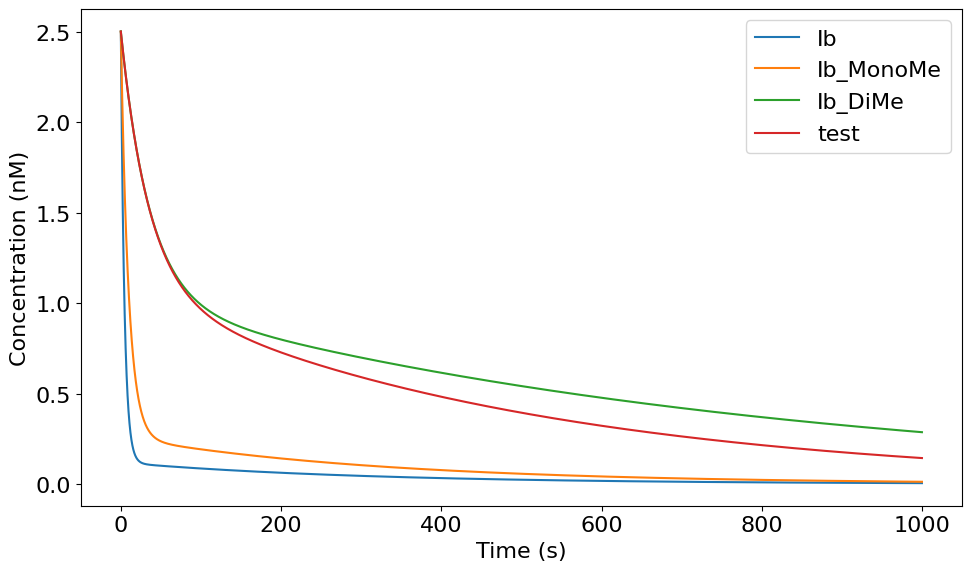

In [105]:
#https://typeset.io/library/kininhibs-2dcv03i3/toenjes-2023-si-pdf-3q8kjdjt 

t = np.linspace(0, 1000, 10000)

# Define the initial concentrations of the species (nM)
L0 = 100 #100
P0 = 2.5 #2.5
L__P0 = 0
L_P0 = 0
LP0 = 0

systems={
    "Ib":        ThreeState(4.7,1/100,0.0034,0,[L0, P0, L_P0, LP0]), 
    "Ib_MonoMe": ThreeState(10.6,1/100,0.0034,0,[L0, P0, L_P0, LP0]), 
    "Ib_DiMe":   ThreeState(58.3,1/100,0.0021,0,[L0, P0, L_P0, LP0]),
    "test":   ThreeState(58.3,1/100,0.0034,0,[L0, P0, L_P0, LP0])
}


gs = gridspec.GridSpec(1, 1)#, height_ratios=[1, 1], hspace=0)
ax1 = plt.subplot(gs[0])

print("_____kon (nM*s)^-1_____")
for k,v in systems.items():
    print(f'{k}:{v.kon}')
    ax1.plot(t, v.solve(t)[:, 1], label=k)

ax1.legend()
ax1.set_ylabel('Concentration (nM)')
ax1.set_xlabel('Time (s)')

plt.show()



- Need a way to model with just Ki bc koff is prob different for diff drugs 
    - koff affects early slope (koff ∝ -m) drastically
- What can we derive from IC50?

### Pettinger 2019

In [23]:
def CO(t,kobs):
    '''
    Occupancy of covalent portion
    '''
    return 100*(1-np.e**(-kobs*t))

def FO(concI,Ki):
    '''
    Occupancy of reversible portion
    '''
    return concI/(concI+Ki)

def TO(t,kobs,concI,Ki):
    '''
    Occupancy of total portion
    '''
    FO=concI/(concI+Ki)
    return 100*(1-(1-FO)*(np.e**(-kobs*t)))

def kobsFromConcI(KI,kinact,concI): #eq 2
    return (kinact*concI)/(KI+concI)

def occFromPop(sol):
    freeP = sol[:, 1]  # Free protein column
    bound_states = sol[:, 2:]  # Select all columns from index 2 onwards as bound state
    boundP = np.sum(bound_states, axis=1)  # Sum the bound states along the row axis
    occupancy = (boundP / (boundP + freeP))
    return occupancy

def finalStateOccFromPop(sol):
    freeP = sol[:, 1]  # Free protein column
    bound_states = sol[:, 2:]  # Select all columns from index 2 onwards as bound state
    boundP = np.sum(bound_states, axis=1)  # Sum the bound states along the row axis
    occupancy = (sol[:, -1] / (boundP + freeP))
    return occupancy

def kobsFromTO(t, occupancy, conc0E,conc0I): 
    # Create a lambda function to "fix" conc0E
    func = lambda t, kobs, Ki: TO(t, kobs,conc0I,Ki)
    popt, _ = curve_fit(func, t, occupancy, p0=[0.001,100], bounds=(0, np.inf)) # Non-negative bounds
    kobs = popt[0]
    Ki =  popt[1]
    return kobs,Ki

def kobsFromCO(t, occupancy, conc0E): 
    # Create a lambda function to "fix" conc0E
    func = lambda t, kobs: CO(t, kobs)
    popt, _ = curve_fit(func, t, occupancy, p0=[0.001], bounds=(0, np.inf)) # Non-negative bounds
    kobs = popt[0]
    return kobs


def kinactKIFromkobs(concI, kobs):
    def model_func(I, KI, kinact):
        return (kinact * I) / (KI + I)
    popt, _ = curve_fit(model_func, concI, kobs, p0=[1000, 0.001], bounds=(0, np.inf))
    KI_fit, kinact_fit = popt
    return KI_fit, kinact_fit

#### Occ vs time

##### 3 state final occupancy vs time 
- Notes
    

0.0008232252539043652


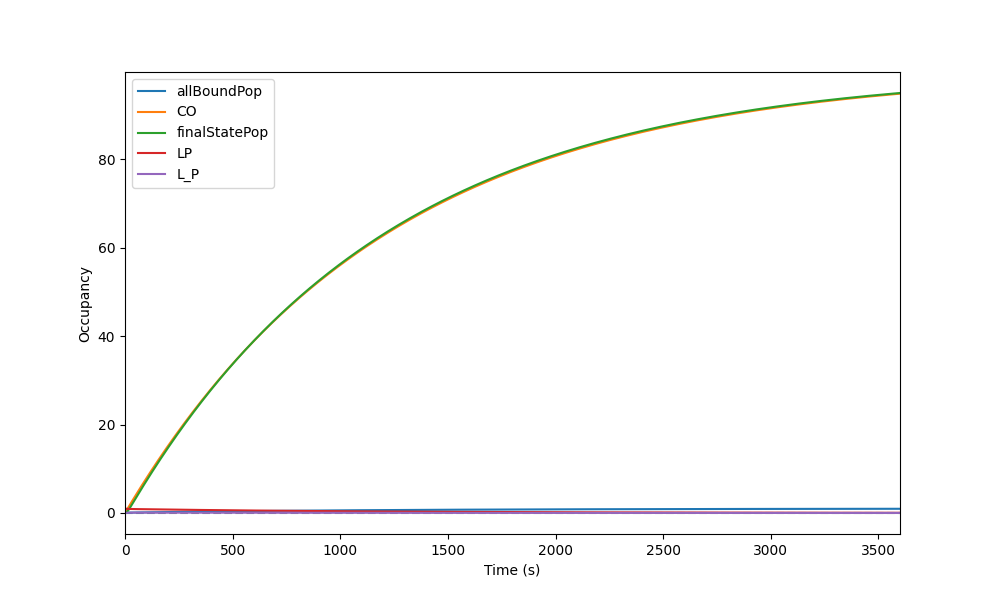

In [30]:

t = np.geomspace(1, 3600, 1000)
Ki, koff, kinactf, kinactb, conc0Arr = 1000, 0.1, 0.01, 0, [100,1,0,0]
model = ThreeState(Ki, koff, kinactf, kinactb, conc0Arr)
sol = model.solve(t)
occupancy = 100*finalStateOccFromPop(sol)
kobs = kobsFromCO(t,occupancy,conc0Arr[1])

print(kobs) 

plt.figure(figsize=(10, 6))

# Store the current x-axis limits
xlim = plt.xlim(0,t[-1])

plt.hlines(conc0Arr[1]/(1+(Ki/conc0Arr[0])), xlim[0], xlim[1], colors='grey', linestyles='--')

plt.plot(t, np.sum(sol[:, 2:], axis=1),label='allBoundPop')
plt.plot(t, CO(t,kobs),label='CO')
plt.plot(t, occupancy,label='finalStatePop')
plt.plot(t, sol[:, 1],label='LP')
plt.plot(t, sol[:, 2],label='L_P')

plt.xlabel('Time (s)')
plt.ylabel('Occupancy')
plt.legend()
plt.show()


##### 3 state total occupancy vs time 

kobs: 0.0008413166264810923
1000 12516.891196461424


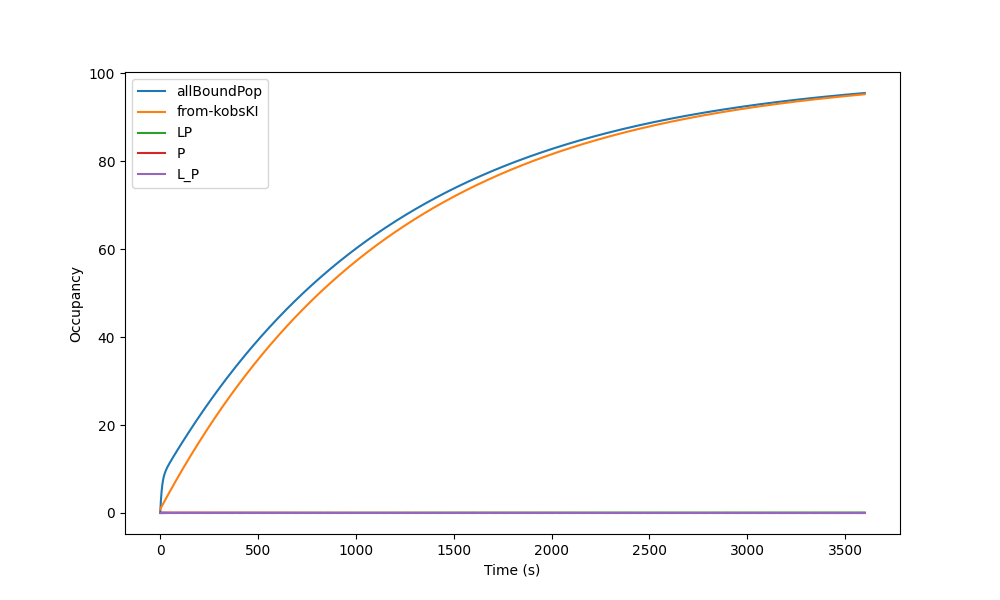

In [62]:

t = np.linspace(1, 3600, 1000)
Ki, koff, kinactf, kinactb, conc0Arr = 1000, 0.1, 0.01, 0, [100,0.1,0,0]
model = ThreeState(Ki, koff, kinactf, kinactb, conc0Arr)
sol = model.solve(t)
occupancy = 100*occFromPop(sol)
kobs,KiNum = kobsFromTO(t,occupancy,conc0Arr[0],Ki)

print("kobs:",kobs) 

plt.figure(figsize=(10, 6))
plt.hlines(conc0Arr[1]/(1+(Ki/conc0Arr[0])), t[0], t[-1], colors='grey', linestyles='--')
print(Ki,KiNum)
plt.plot(t, occupancy,label='allBoundPop')
plt.plot(t, TO(t,kobs,conc0Arr[0],KiNum),label='from-kobsKI')
plt.plot(t, sol[:,-1],label='LP')
plt.plot(t, sol[:, 1],label='P')
plt.plot(t, sol[:, 2],label='L_P')

plt.xlabel('Time (s)')
plt.ylabel('Occupancy')
plt.legend()
plt.show()


### Strelow

In [139]:

def totalOccFromKobsKI(t,kobs,conc0E,conc0I,KI): #eq 1
    Y0=conc0E/(1+(KI/conc0I))
    Ymax=conc0E-Y0
    return Ymax*(1-np.e**(-kobs*t))+Y0 #returned as a fraction

def occFromKobs(t,kobs,conc0E): #eq 1, scales from initial conc of enzyme
    return conc0E*(1-np.e**(-kobs*t)) #returned as a fraction

def kobsFromConcI(KI,kinact,concI): #eq 2
    return (kinact*concI)/(KI+concI)

def occFromPop(sol):
    freeP = sol[:, 1]  # Free protein column
    bound_states = sol[:, 2:]  # Select all columns from index 2 onwards as bound state
    boundP = np.sum(bound_states, axis=1)  # Sum the bound states along the row axis
    occupancy = (boundP / (boundP + freeP))
    return occupancy

def finalStateOccFromPop(sol):
    freeP = sol[:, 1]  # Free protein column
    bound_states = sol[:, 2:]  # Select all columns from index 2 onwards as bound state
    boundP = np.sum(bound_states, axis=1)  # Sum the bound states along the row axis
    occupancy = (sol[:, -1] / (boundP + freeP))
    return occupancy

def kobsKIFromTotalOcc(t, occupancy, conc0E,conc0I): 
    # Create a lambda function to "fix" conc0E
    func = lambda t, kobs, KI: totalOccFromKobsKI(t, kobs, conc0E,conc0I,KI)
    popt, _ = curve_fit(func, t, occupancy, p0=[0.001,1000], bounds=(0, np.inf)) # Non-negative bounds
    kobs = popt[0]
    KI =  popt[1]
    return kobs,KI


def kobsFromOcc(t, occupancy, conc0E): 
    # Create a lambda function to "fix" conc0E
    func = lambda t, kobs: occFromKobs(t, kobs, conc0E)
    popt, _ = curve_fit(func, t, occupancy, p0=[0.001], bounds=(0, np.inf)) # Non-negative bounds
    kobs = popt[0]
    return kobs


def kinactKIFromkobs(concI, kobs):
    def model_func(I, KI, kinact):
        return (kinact * I) / (KI + I)
    popt, _ = curve_fit(model_func, concI, kobs, p0=[1000, 0.001], bounds=(0, np.inf))
    KI_fit, kinact_fit = popt
    return KI_fit, kinact_fit


#### Playing with 3state analytical equations

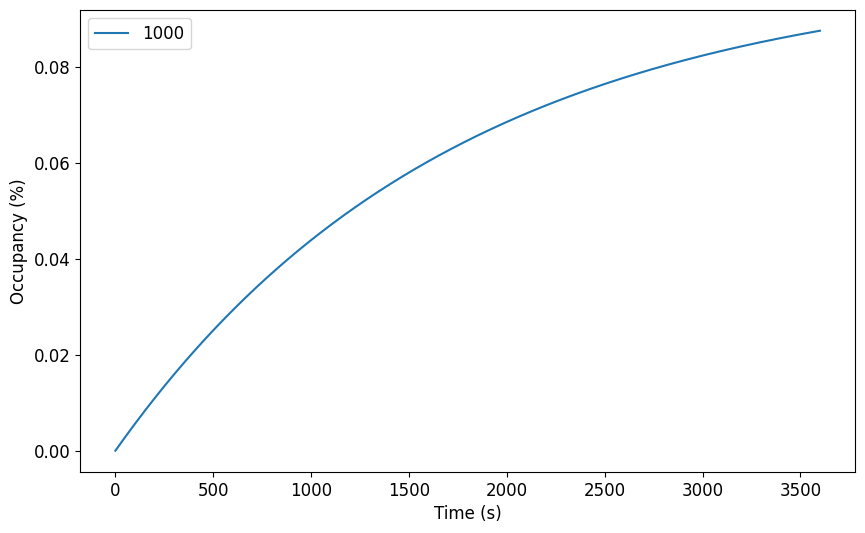

In [263]:
t = np.linspace(0, 3600, 1000) #s
concI = 1000 #np.linspace(0,5000,1000) #nM 
conc0E=0.1
kinact=0.0693/60 #s^1
KI=1000 #nM


# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(t, occFromKobs(t,kobsFromConcI(KI,kinact,concI),conc0E), label='1000')
#plt.ylim(0,100)
plt.xlabel('Time (s)')
plt.ylabel('Occupancy (%)')
plt.legend()
plt.show()


No handles with labels found to put in legend.


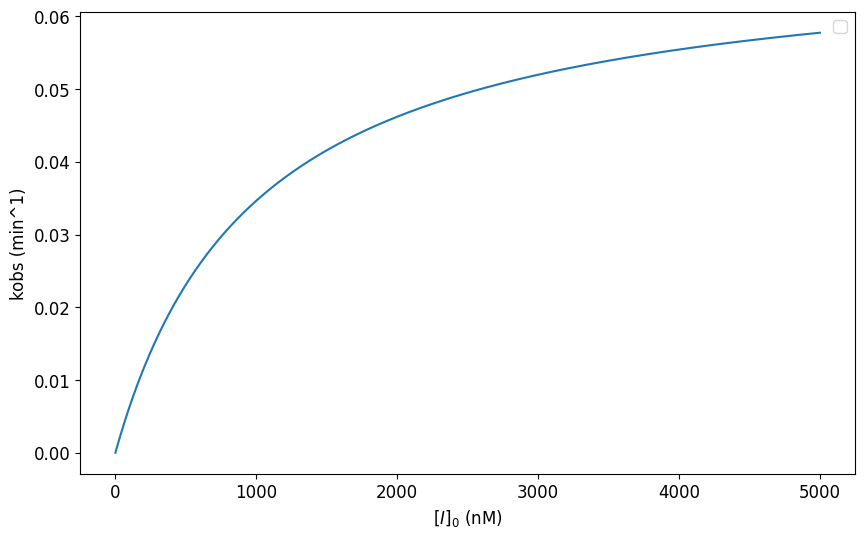

In [264]:
t = np.linspace(0, 3600, 1000) #s
concI = np.linspace(0,5000,1000) #nM 
kinact=0.0693 #min^1
KI=1000 #nM


# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(concI, kobsFromConcI(KI,kinact,concI), label='')
plt.xlabel("$[I]_0$ (nM)")
plt.ylabel('kobs (min^1)')
plt.legend()
plt.show()


kon: 0.001
kon: 0.1


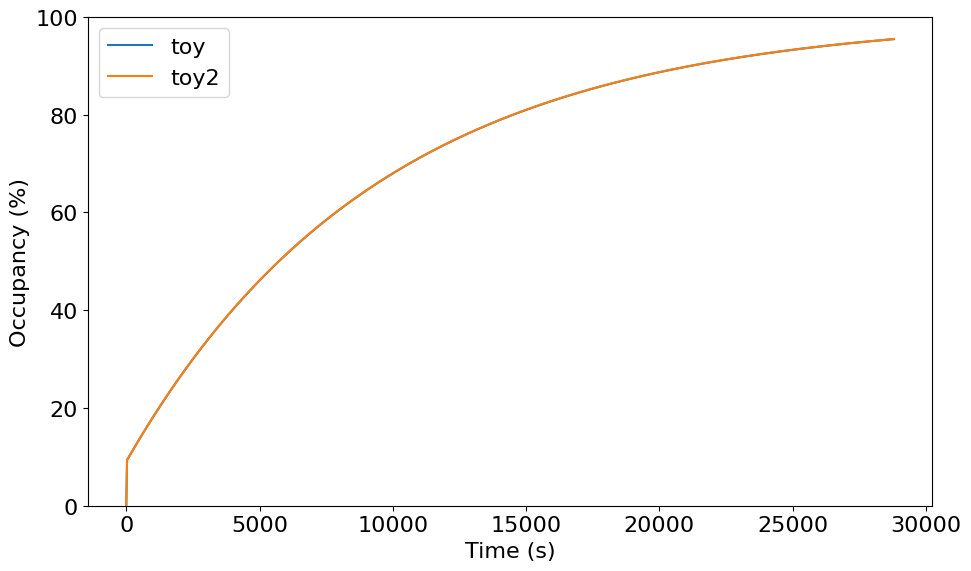

In [35]:
t = np.linspace(0, 8*3600, 1000)

kinact=0.0693/60 #s^1

# Define the initial concentrations of the species (nM)
L0 = 100 #100
P0 = 1 #2.5
L__P0 = 0
L_P0 = 0
LP0 = 0

systems={
    "toy":   ThreeState(1000,1,kinact,0,[L0, P0, L_P0, LP0])
    #"toy2":   ThreeState(1000,100,kinact,0,[L0, P0, L_P0, LP0] #larger koff doesnt affect curve
}

gs = gridspec.GridSpec(1, 1)#, height_ratios=[1, 1], hspace=0)
ax1 = plt.subplot(gs[0])

for k,v in systems.items():
    print('kon:',v.kon)
    ax1.plot(t, 100*(v.solve(t)[:, 2]+v.solve(t)[:, 3]), label=k)

ax1.legend()
ax1.set_ylim(0,100)
ax1.set_ylabel('Occupancy (%)')
ax1.set_xlabel('Time (s)')

plt.show()


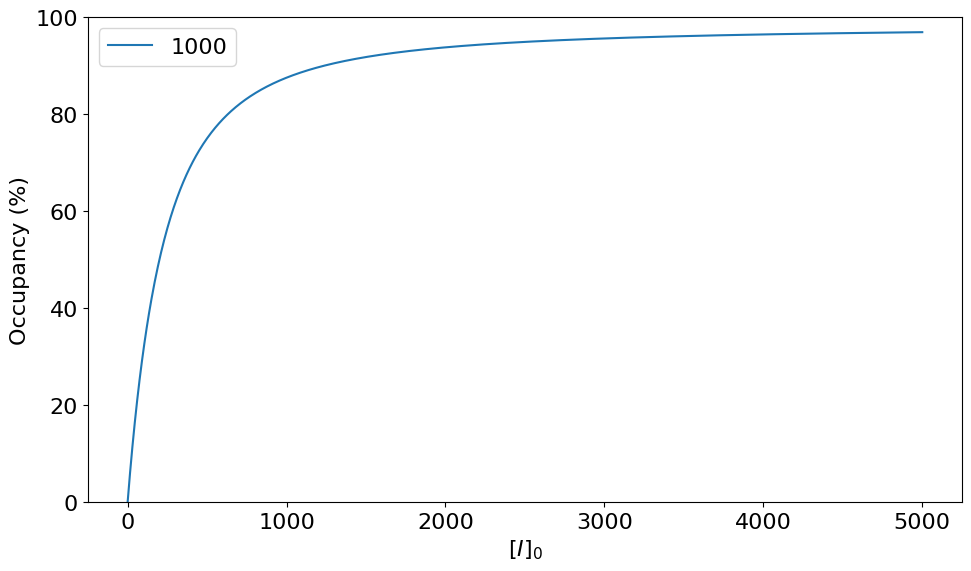

In [194]:
t = 3600 #s
concI = np.linspace(0,5000,1000) #nM
conc0E=1 
kinact=0.0693/60 #s^1
KI=1000 #nM


# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(concI, occFromKobs(t,kobsFromConcI(KI,kinact,concI),conc0E), label='1000')
plt.ylim(0,100)
plt.xlabel('$[I]_0$')
plt.ylabel('Occupancy (%)')
plt.legend()
plt.show()


#### KI and kinact heatmap

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/scipy/integrate/_ivp/common.py:336: RuntimeWarning: overflow encountered in multiply
  new_factor = NUM_JAC_FACTOR_INCREASE * factor[ind]
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/scipy/integrate/_ivp/common.py:358: RuntimeWarning: overflow encountered in multiply
  factor[max_diff < NUM_JAC_DIFF_SMALL * scale] *= NUM_JAC_FACTOR_INCREASE


An error occurred: array must not contain infs or NaNs
intratio: 0.1
OOM: 6
An error occurred: array must not contain infs or NaNs
intratio: 0.1
OOM: 7
An error occurred: array must not contain infs or NaNs
intratio: 0.2
OOM: 7
An error occurred: array must not contain infs or NaNs
intratio: 0.30000000000000004
OOM: 7
An error occurred: array must not contain infs or NaNs
intratio: 0.4
OOM: 7
An error occurred: array must not contain infs or NaNs
intratio: 0.5
OOM: 7


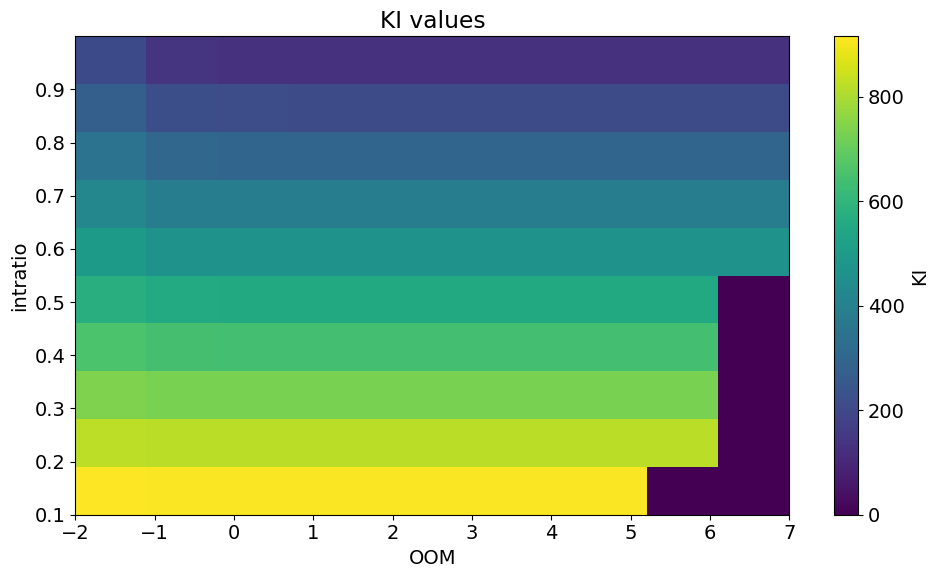

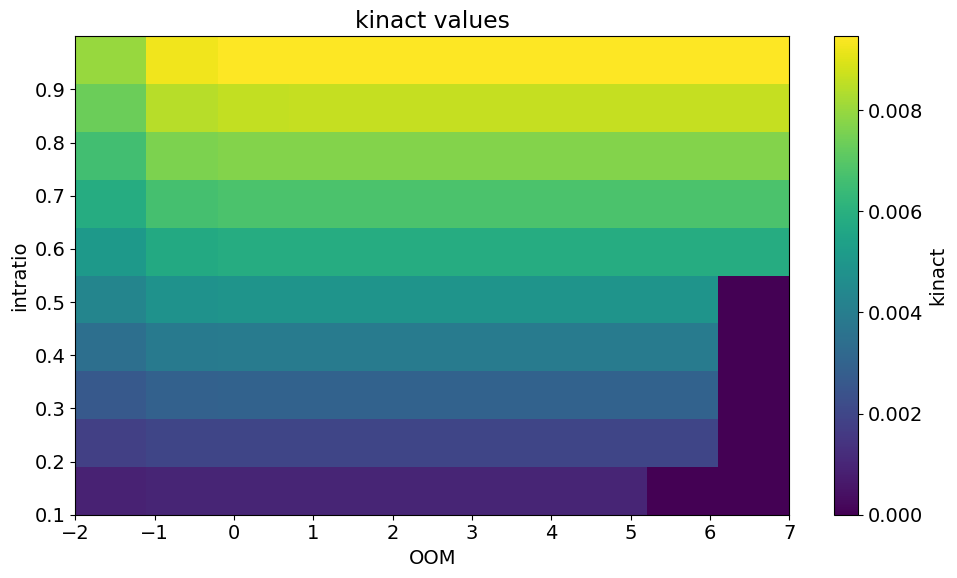

In [64]:
Pf_values=np.arange(0.1, 1.1, 0.1)
#Pf_values[0]=0.000001 #replace 0 with ~0
Pf_values[-1]=0.999999 #replace 1 with ~1
OOM_values = np.arange(-2, 8, 1)

KI_values = np.zeros((len(Pf_values), len(OOM_values)))
kinact_values = np.zeros((len(Pf_values), len(OOM_values)))

concI_values = np.geomspace(1, 5000, 200)
t = np.geomspace(1, 7200, 1000)

for i, Pf in enumerate(Pf_values):
    for j, OOM in enumerate(OOM_values):
        try:
            Ki, koff, intOOM, Pf, kqmf, kqmb, conc0Arr = 1000, 0.1, OOM, Pf, 0.01, 0, [100, 0.1, 0, 0, 0]
            model = FourState(Ki, koff, intOOM, Pf, kqmf, kqmb, conc0Arr)
            sol = model.solve(t)

            kobs_values = []

            for concI in concI_values:
                model.conc0Arr[0] = concI
                sol = model.solve(t)
                occupancy = sol[:,-1] #finalStateOccFromPop(sol) #occFromPop(sol)
                kobs = kobsFromOcc(t, occupancy,conc0Arr[1])
                kobs_values.append(kobs)

            KI_fit, kinact_fit = kinactKIFromkobs(concI_values, kobs_values)
            KI_values[i, j] = KI_fit
            kinact_values[i, j] = kinact_fit
        except RuntimeError as e:
            print(f"RuntimeError occurred: {e}")
            print("Pf:", Pf)
            print("OOM:", OOM)
        except Exception as e:
            print(f"An error occurred: {e}")
            print("Pf:", Pf)
            print("OOM:", OOM)


fig, ax = plt.subplots(figsize=(10,6))
cax = ax.imshow(KI_values, extent=[OOM_values.min(), OOM_values.max(), Pf_values.min(), Pf_values.max()], aspect='auto', origin='lower')
fig.colorbar(cax, label='KI')
plt.xlabel('OOM')
plt.ylabel('Pf')
plt.title('KI values')
plt.show()

fig, ax = plt.subplots(figsize=(10,6))
cax = ax.imshow(kinact_values, extent=[OOM_values.min(), OOM_values.max(), Pf_values.min(), Pf_values.max()], aspect='auto', origin='lower')
fig.colorbar(cax, label='kinact')
plt.xlabel('OOM')
plt.ylabel('Pf')
plt.title('kinact values')
plt.show()



##### Kobs over [I]

KI: 550.5392126496338, kinact: 0.0050001965291912535
KI_kobs: 0.002500119866484578


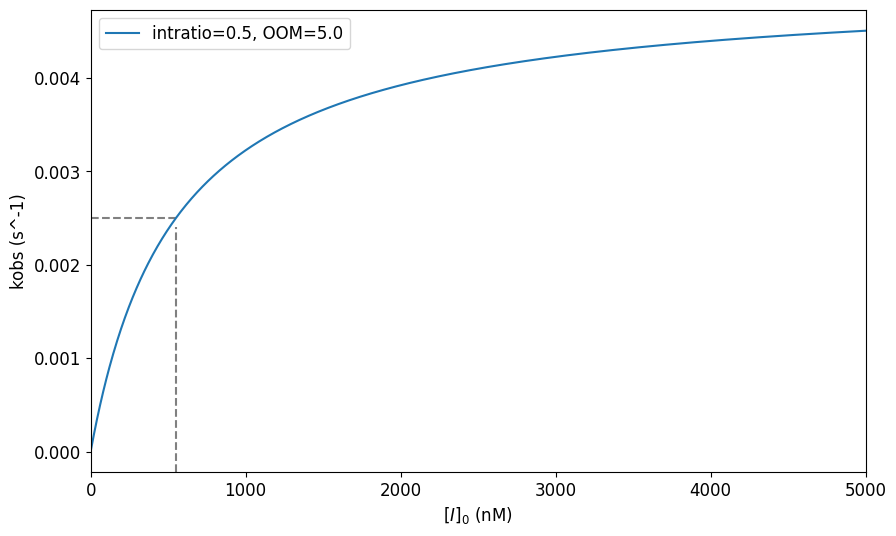

In [92]:
t = np.linspace(0, 7200, 1000)

concI_values = np.linspace(1,5000,1000) #initial values of [I]
kobs_values = []
rate_values = []
#Ki, koff, kinactf, kinactb, conc0Arr = 1000, 0.1, 0.01, 0, [concI,1,0,0]
#model = ThreeState(Ki, koff, kinactf, kinactb, conc0Arr)
Ki, koff, intOOM, Pf, kqmf, kqmb, conc0Arr = 1000.0, 0.1, 5.0, 0.5, 0.01, 0, [1000,0.1,0,0,0]
model = FourState(Ki, koff, intOOM, Pf, kqmf, kqmb, conc0Arr)
for concI in concI_values:
    model.conc0Arr=[concI,0.1,0,0,0]
    sol = model.solve(t)
    occupancy = sol[:,-1] #finalStateOccFromPop(sol) #occFromPop(sol)
    kobs = kobsFromOcc(t,occupancy,conc0Arr[1])
    kobs_values.append(kobs)


KI, kinact = kinactKIFromkobs(concI_values, kobs_values)
print(f"KI: {KI}, kinact: {kinact}")

# Find the kobs value corresponding to KI using interpolation
KI_kobs = np.interp(KI, concI_values, kobs_values)
print('KI_kobs:',KI_kobs)


plt.figure(figsize=(10, 6))
plt.plot(concI_values, kobs_values, label=f'Pf={Pf}, OOM={intOOM}')
plt.axvline(KI, linestyle='--', color='grey', ymax=KI_kobs/plt.ylim()[1])  # This line adds a vertical dotted line at x=KI

# Store the current x-axis limits
xlim = plt.xlim(0,concI_values[-1])

# Draw the horizontal line and then restore the original x-axis limits
plt.hlines(KI_kobs, KI, xlim[0], colors='grey', linestyles='--')  # This line adds a horizontal dotted line at y=KI_kobs
plt.xlim()

plt.xlabel('$[I]_0$ (nM)')
plt.ylabel('kobs (s^-1)')
plt.legend()
plt.show()



KI: 116.43314112009426, kinact: 0.00050111374323932
KI_kobs: 0.00025279197236385446


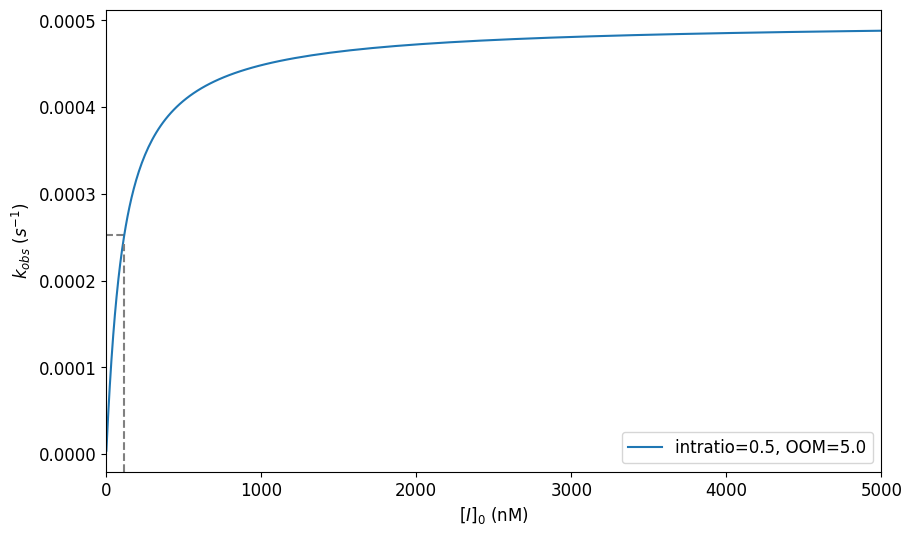

In [125]:
t = np.geomspace(1, 3600, 1000)

concI_values = np.geomspace(1,5000,200) #initial values of [I]
kobs_values = []
rate_values = []
#Ki, koff, kinactf, kinactb, conc0Arr = 1000, 0.1, 0.01, 0, [concI,1,0,0]
#model = ThreeState(Ki, koff, kinactf, kinactb, conc0Arr)
Ki, koff, intOOM, Pf, kqmf, kqmb, conc0Arr = 10.0, 0.0001, 5.0, 0.5, 0.001, 0, [100,0.1,0,0,0]
model = FourState(Ki, koff, intOOM, Pf, kqmf, kqmb, conc0Arr)
for concI in concI_values:
    model.conc0Arr=[concI,0.1,0,0,0]
    sol = model.solve(t)
    occupancy = sol[:,-1] #finalStateOccFromPop(sol) #occFromPop(sol)
    kobs = kobsFromOcc(t,occupancy,conc0Arr[1])
    kobs_values.append(kobs)

KI, kinact = kinactKIFromkobs(concI_values, kobs_values)
print(f"KI: {KI}, kinact: {kinact}")

# Find the kobs value corresponding to KI using interpolation
KI_kobs = np.interp(KI, concI_values, kobs_values)
print('KI_kobs:',KI_kobs)


plt.figure(figsize=(10, 6))
plt.plot(concI_values, kobs_values, label=f'Pf={Pf}, OOM={intOOM}')
plt.axvline(KI, linestyle='--', color='grey', ymax=KI_kobs/plt.ylim()[1])  # This line adds a vertical dotted line at x=KI

# Store the current x-axis limits
xlim = plt.xlim(0,concI_values[-1])

# Draw the horizontal line and then restore the original x-axis limits
plt.hlines(KI_kobs, KI, xlim[0], colors='grey', linestyles='--')  # This line adds a horizontal dotted line at y=KI_kobs
plt.xlim()

plt.xlabel('$[I]_{0}$ (nM)')
plt.ylabel('$k_{obs}$ ($s^{-1}$)')
plt.legend()
plt.show()



- In the above cell
    - kobs becomes linear as Pf->1, koff->0, KI->0. Other dramatic changes. Plot different systems when model and kobs is verified. 

#### How model params affect kinact and KI

##### 3state

In [52]:
#Plot KI and kinact for diff params of ThreeState
# Define parameter ranges
Ki_values = np.geomspace(1, 1000, 10)
koff_values = np.linspace(0.01, 0.2, 10)
kinactf_values = np.linspace(0.001, 0.1, 10)


params_dict = {
    "Ki": {"plot_label": "$K_i$", "values": Ki_values},
    "koff": {"plot_label": "$k_{off}$", "values": koff_values},
    "kinactf": {"plot_label": "$k_{inactf}$", "values": kinactf_values}
}

#establish time and concI values that progress exponentially
t = np.linspace(0.01, 7200, 1000)
concI_values = np.linspace(0.01, 2000, 500)



tabs = Tab()
tab_titles = []
tab_contents = []

for param, param_info in params_dict.items():
    values = param_info["values"]
    plot_label = param_info["plot_label"]
    KI_values = []
    kinact_values = []

    fig = plt.figure(figsize=(12,8)) 

    # Create a master GridSpec
    gs_master = gridspec.GridSpec(nrows=2, ncols=1, figure=fig, height_ratios=[1, 1], hspace=0.3)

    # Create a nested GridSpec for the bottom two plots
    gs_nested = gridspec.GridSpecFromSubplotSpec(nrows=2, ncols=1, subplot_spec=gs_master[1], hspace=0)

    ax1 = fig.add_subplot(gs_master[0, 0])  
    ax2 = fig.add_subplot(gs_nested[0, 0])  
    ax2.get_xaxis().set_visible(False)
    ax2b = ax2.twinx() 
    ax3 = fig.add_subplot(gs_nested[1, 0], sharex=ax2) 
    ax3.yaxis.set_major_formatter(CustomFormatter('%.2e'))





    
    for value in values:
        try:
            Ki, koff, kinactf, kinactb, conc0Arr= 100, 0.1, 0.01, 0, [100,1,0,0] # default values
            if param == "Ki":
                Ki = value
            elif param == "koff":
                koff = value
            elif param == "kinactf":
                kinactf = value

            kobs_values = []
            model = ThreeState(Ki, koff, kinactf, kinactb, conc0Arr)
            for concI in concI_values:
                model.conc0Arr=[concI,1,0,0]
                sol = model.solve(t)
                occupancy = sol[:,-1] #finalStateOccFromPop(sol) #occFromPop(sol)
                kobs = kobsFromOcc(t,occupancy,conc0Arr[1])
                kobs_values.append(kobs)

            KI, kinact = kinactKIFromkobs(concI_values, kobs_values)
            KI_values.append(KI)
            kinact_values.append(kinact)

            ax1.plot(concI_values, kobs_values, label='%.2g' % value)

        except RuntimeError as e:
            print(f"RuntimeError occurred: {e}")
            print(f"{param}  : {value}")


        except Exception as e:
            print(f"An error occurred: {e}")
            print(f"{param}  : {value}")


    ax1.set_xlabel('$[I]_{0}$ (nM)')
    ax1.set_ylabel('$k_{obs}$ ($s^{-1}$)')
    # Shrink current axis by 20%
    box = ax1.get_position()
    ax1.set_position([box.x0, box.y0, box.width * 1, box.height])
    # Put a legend to the right of the current axis
    ax1.legend(loc='center left', bbox_to_anchor=(1, 0.5),title=plot_label)
    
    ax2.plot(values, KI_values, label='$K_I$', color='tab:orange')
    ax2.set_xlabel(plot_label)
    ax2.set_ylabel('$K_I$')
    ax2b.plot(values, kinact_values, label='$k_{inact}$', color='tab:green')
    ax2b.set_ylabel('$k_{inact}$')
    # Get the lines and labels for all axes
    lines, labels = ax2.get_legend_handles_labels()
    lines2, labels2 = ax2b.get_legend_handles_labels()
    ax2.legend(lines + lines2, labels + labels2, loc="upper right")


    kinact_over_KI_values = np.array(kinact_values) / np.array(KI_values)
    # Replace infinities or NaNs resulting from division by zero with zero
    kinact_over_KI_values[np.isinf(kinact_over_KI_values) | np.isnan(kinact_over_KI_values)] = 0    
    ax3.plot(values, kinact_over_KI_values, color='tab:purple',label="Numerical")  

    #Plot analytical calc of specificity const
    Ki, koff, kinactf, kinactb, conc0Arr= 100, 0.1, 0.01, 0, [100,1,0,0] # default values
    if param == "Ki":
        ax3.plot(values, FourState.specificity(koff/values,koff,kinactf), color='tab:orange',linestyle="--",label="Analytical")
    elif param == "koff":
        ax3.plot(values, FourState.specificity(values/Ki,values,kinactf), color='tab:orange',linestyle="--",label="Analytical")
    elif param == "kinactf":
        ax3.plot(values, FourState.specificity(koff/Ki,koff,values), color='tab:orange',linestyle="--",label="Analytical")

    ax3.set_xlabel(plot_label)
    ax3.set_ylabel('$k_{inact}$/$K_I$')
    ax3.legend()
    
    tab_contents.append(widgets.Output())
    tab_titles.append(param)
    with tab_contents[-1]:
        display(fig)
    plt.close(fig)

tabs.children = tab_contents

for i in range(len(tab_titles)):
    tabs.set_title(i, tab_titles[i])

display(tabs)



/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/scipy/integrate/_ivp/bdf.py:403: RuntimeWarning: invalid value encountered in subtract
  D[order + 2] = d - D[order + 1]


##### 4state
- Notes
    - The curve of kinact/KI depends on koff and kinact (or kqmf, see below). Some balance between these two determines the sign of d^2(kinact/KI)/dPf^2. Can solve for this analytically
        - The sign of d^2(kinact/KI)/dPf^2 is never negative <0 if KI uses kcat, not kcat*Pf=kinact
            - Also, KI increases when koff<kqmf both analytcally (see desmos) and from numerical determination in the cell below
    - Pf trends are similar to kinact and kqmf in 3 state when kqmf>koff

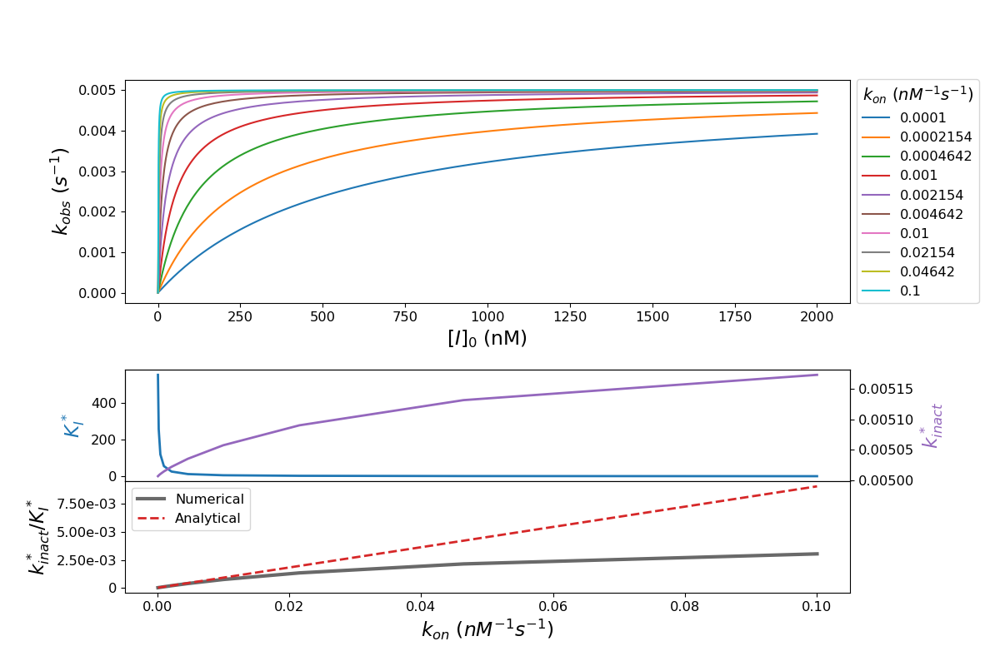

In [143]:
#Plot KI and kinact for diff params of FourState
# Define parameter ranges
kon_values = np.geomspace(0.1/1000, 0.1/1, 10) #nM
##koff_values = np.linspace(0.01, 0.2, 10)
#intOOM_values = np.arange(-2, 6, 1)
#Pf_values=np.arange(0.1, 1.1, 0.1) #solving cannot finish accurately for lower Pfs
#Pf_values[0]=0.001 #replace 0 with ~0
##Pf_values[-1]=0.999 #replace 1 with ~1
#kqmf_values = np.linspace(0.001, 0.1, 10)
#kqmb_values = np.linspace(0, 0.0001, 10)

params_dict = {
    "kon": {"plot_label": "$k_{on}$"+" $(nM^{-1}s^{-1})$", "values": kon_values},
    #"koff": {"plot_label": "$k_{off}$"+" $(s^{-1})$", "values": koff_values},
    #"intOOM": {"plot_label": "$intOOM$", "values": intOOM_values},
    #"Pf": {"plot_label": "$P_f$", "values": Pf_values},
    #"kqmf": {"plot_label": "$k^{inact}$"+" $(s^{-1})$", "values": kqmf_values}
    #"kqmb": {"plot_label": "$k^{qm}_b$"+" $(s^{-1})$", "values": kqmb_values}
}

#establish time and concI values
t = np.linspace(0.001, 7200, 1000)
concI_values = np.geomspace(0.01, 2000, 200)

tabs = Tab()
tab_titles = []
tab_contents = []

for param, param_info in params_dict.items():
    values = param_info["values"]
    plot_label = param_info["plot_label"]
    KI_values = []
    kinact_values = []

    fig = plt.figure(figsize=(12,8)) 

    # Create a master GridSpec
    gs_master = gridspec.GridSpec(nrows=2, ncols=1, figure=fig, height_ratios=[1, 1], hspace=0.3)

    # Create a nested GridSpec for the bottom two plots
    gs_nested = gridspec.GridSpecFromSubplotSpec(nrows=2, ncols=1, subplot_spec=gs_master[1], hspace=0)

    ax1 = fig.add_subplot(gs_master[0, 0])  
    ax2 = fig.add_subplot(gs_nested[0, 0])  
    ax2.get_xaxis().set_visible(False)
    ax2b = ax2.twinx() 
    ax3 = fig.add_subplot(gs_nested[1, 0], sharex=ax2) 
    ax3.yaxis.set_major_formatter(CustomFormatter('%.2e'))

    for value in values:
        try:
            kon, koff, intOOM, Pf, kqmf, kqmb, conc0Arr= 0.1/100, 0.1, 5, 0.5, 0.01, 0, [100,1,0,0,0] # default values
            if param == "kon":
                kon = value
            elif param == "koff":
                koff = value
            elif param == "intOOM":
                intOOM = value
            elif param == "Pf":
                Pf = value
            elif param == "kqmf":
                kqmf = value
            elif param == "kqmb":
                kqmb = value

            kobs_values = []
            Ki=koff/kon
            model = FourState(Ki, koff, intOOM, Pf, kqmf, kqmb, conc0Arr)
            for concI in concI_values:
                model.conc0Arr=[concI,1,0,0,0]
                sol = model.solve(t)
                occupancy = sol[:,-1] #finalStateOccFromPop(sol) #occFromPop(sol)
                kobs = kobsFromOcc(t,occupancy,conc0Arr[1])
                kobs_values.append(kobs)

            KI, kinact = kinactKIFromkobs(concI_values, kobs_values)
            KI_values.append(KI)
            kinact_values.append(kinact)

            ax1.plot(concI_values, kobs_values, label=f'{value:.4g}')

        except RuntimeError as e:
            print(f"RuntimeError occurred: {e}")
            print(f"{param}  : {value}")


        except Exception as e:
            print(f"An error occurred: {e}")
            print(f"{param}  : {value}")


    ax1.set_xlabel('$[I]_{0}$ (nM)', fontsize='large')
    ax1.set_ylabel('$k_{obs}$ ($s^{-1}$)', fontsize='large')
    # Shrink current axis by 0%
    box = ax1.get_position()
    ax1.set_position([box.x0, box.y0, box.width * 1, box.height])
    # Put a legend to the right of the current axis
    ax1.legend(loc='center left', bbox_to_anchor=(1, 0.5),title=plot_label,fontsize='small')
    
    ax2.plot(values, KI_values, color='tab:blue', lw=2)
    ax2.set_xlabel(plot_label, fontsize='large')
    ax2.set_ylabel('$K_I^*$', fontsize='large')
    ax2.yaxis.label.set_color('tab:blue')
    ax2b.plot(values, kinact_values, color='tab:purple', lw=2)
    ax2b.set_ylabel('$k_{inact}^*$', fontsize='large')
    ax2b.yaxis.label.set_color('tab:purple')
    # Get the lines and labels for all axes
    lines, labels = ax2.get_legend_handles_labels()
    lines2, labels2 = ax2b.get_legend_handles_labels()
    #ax2.legend(lines + lines2, labels + labels2)#, loc="upper right")


    kinact_over_KI_values = np.array(kinact_values) / np.array(KI_values)
    # Replace infinities or NaNs resulting from division by zero with zero
    kinact_over_KI_values[np.isinf(kinact_over_KI_values) | np.isnan(kinact_over_KI_values)] = 0    
    ax3.plot(values, kinact_over_KI_values, color='dimgrey', label="Numerical",lw=3)  

    #Plot analytical calc of specificity const
    kon, koff, intOOM, Pf, kqmf, kqmb, conc0Arr= 0.1/100, 0.1, 5, 0.5, 0.01, 0, [100,1,0,0,0] # default values
    if param == "kon":
        ax3.plot(values, FourState.specificity_eff(values,koff,Pf,kqmf), color='tab:red',linestyle="--",label="Analytical",lw=2)
    elif param == "koff":
        ax3.plot(values, FourState.specificity_eff(kon,values,Pf,kqmf), color='tab:red',linestyle="--",label="Analytical",lw=2)
    elif param == "Pf":
        ax3.plot(values, FourState.specificity_eff(kon,koff,values,kqmf), color='tab:red',linestyle="--",label="Analytical",lw=2)
    elif param == "kqmf":
        ax3.plot(values, FourState.specificity_eff(kon,koff,Pf,values), color='tab:red',linestyle="--",label="Analytical",lw=2)

    ax3.set_xlabel(plot_label, fontsize='large')
    ax3.set_ylabel('$k_{inact}^*$/$K_I^*$', fontsize='large')
    ax3.legend(fontsize='small')

    # Tick size for ax1, ax2, ax2b, and ax3
    ax1.tick_params(axis='both', labelsize='small')
    ax2.tick_params(axis='both', labelsize='small')
    ax2b.tick_params(axis='both', labelsize='small')
    ax3.tick_params(axis='both', labelsize='small')

#    tab_contents.append(widgets.Output())
#    tab_titles.append(param)
#    with tab_contents[-1]:
#        display(fig)
    fig.subplots_adjust(right=0.85)
    plt.savefig("specificity_over_params/"+param+'.png') 
    plt.show()
#    plt.close(fig)

#tabs.children = tab_contents
#for i in range(len(tab_titles)):
#    tabs.set_title(i, tab_titles[i])
#display(tabs)



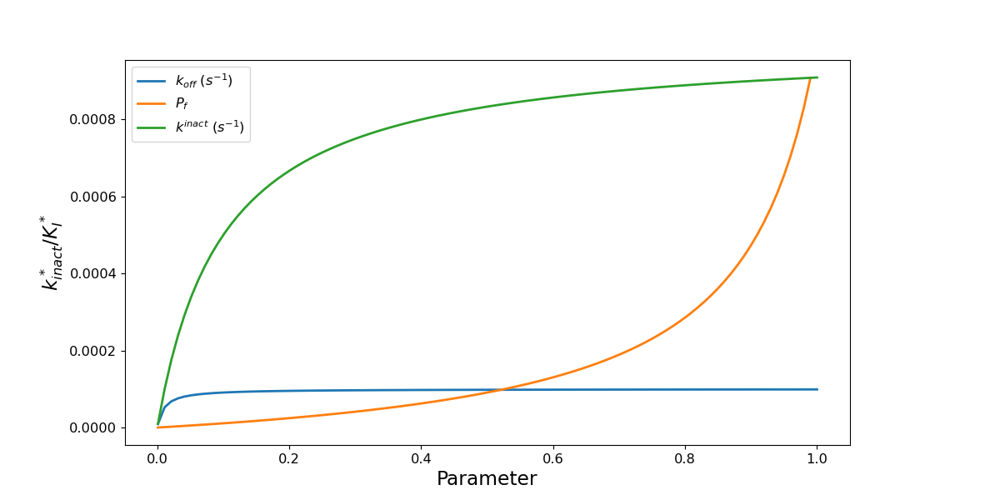

In [138]:
#Plot specificity over diff params
# Define parameter ranges
#kon_values = np.geomspace(0.1/100, 0.1/1, 100) #nM
koff_values = np.linspace(0.001, 1, 100)
Pf_values=np.arange(0.0, 1, 0.01) #solving cannot finish accurately for lower Pfs
Pf_values[0]=0.001 #replace 0 with ~0
#Pf_values[-1]=0.999 #replace 1 with ~1
kqmf_values = np.linspace(0.001, 1, 100)

params_dict = {
#    "kon": {"plot_label": "$k_{on}$"+" $(nM^{-1}s^{-1})$", "values": kon_values},
    "koff": {"plot_label": "$k_{off}$"+" $(s^{-1})$", "values": koff_values},
    "Pf": {"plot_label": "$P_f$", "values": Pf_values},
    "kqmf": {"plot_label": "$k^{inact}$"+" $(s^{-1})$", "values": kqmf_values}
}

fig = plt.figure(figsize=(12,6)) 
ax = fig.add_subplot()  

for param, param_info in params_dict.items():
    values = param_info["values"]
    plot_label = param_info["plot_label"]

  #Plot analytical calc of specificity const
    kon, koff, intOOM, Pf, kqmf, kqmb, conc0Arr= 0.1/100, 0.1, 5, 0.5, 0.01, 0, [100,1,0,0,0] # default values
    if param == "kon":
        ax.plot(values, FourState.specificity_eff(values,koff,Pf,kqmf),linestyle="-",label=plot_label,lw=2)
    elif param == "koff":
        ax.plot(values, FourState.specificity_eff(values/Ki,values,Pf,kqmf), linestyle="-",label=plot_label,lw=2)
    elif param == "Pf":
        ax.plot(values, FourState.specificity_eff(koff/Ki,koff,values,kqmf), linestyle="-",label=plot_label,lw=2)
    elif param == "kqmf":
        ax.plot(values, FourState.specificity_eff(koff/Ki,koff,Pf,values), linestyle="-",label=plot_label,lw=2)

ax.set_xlabel("Parameter", fontsize='large')
ax.set_ylabel('$k_{inact}^*$/$K_I^*$', fontsize='large')
ax.legend(fontsize='small')

# Tick size for ax1, ax2, ax2b, and ax3
ax.tick_params(axis='both', labelsize='small')

fig.subplots_adjust(right=0.85)
plt.savefig("specificity_over_params/"+'all'+'.png') 
plt.show()
    

#### Occ vs time

##### 3 state final occupancy vs time 
- Notes
    - L_P represents [ES] in michaelis-menten derivation. Steady state assumptions assumes d[ES]/dt=0.

0.0003843701848316877


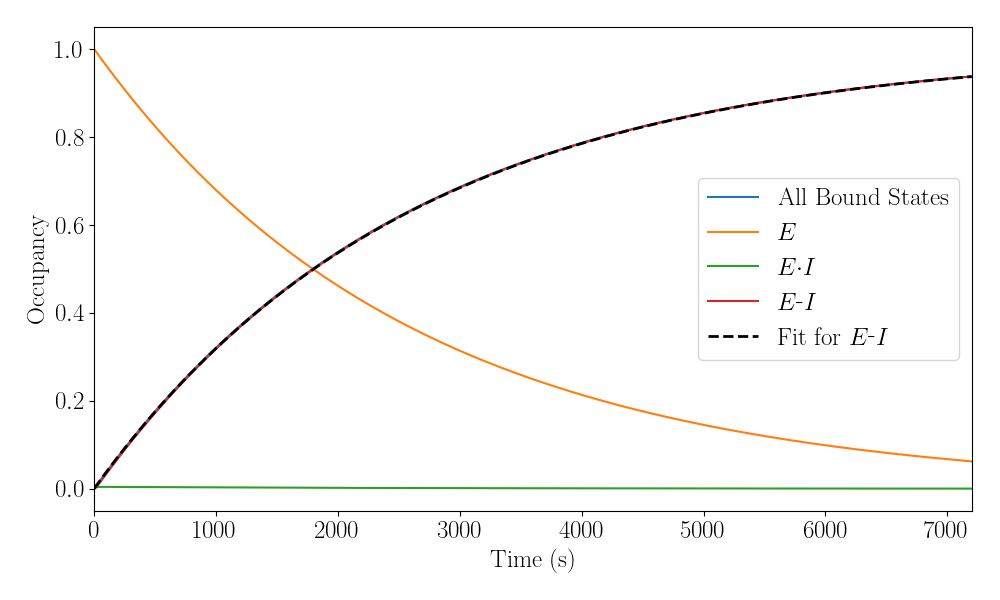

In [361]:

t = np.linspace(1, 7200, 1000)
Ki, koff, kinactf, kinactb, conc0Arr = 425, 1/(60*15), 0.09, 0, [150,1,0,0]
model = ThreeState(Ki, koff, kinactf, kinactb, conc0Arr)
sol = model.solve(t)
occupancy = sol[:,-1] #finalStateOccFromPop(sol) #occFromPop(sol)
kobs = kobsFromOcc(t,occupancy,conc0Arr[1])

print(kobs) #is there an eq to relate the parameters of four state to this that can match the kobs in eq 2?

plt.figure(figsize=(10, 6))
KI=(koff+kinactf)/model.kon

# Store the current x-axis limits
xlim = plt.xlim(0,t[-1])

#plt.hlines(conc0Arr[1]/(1+(KI/conc0Arr[0])), xlim[0], xlim[1], colors='grey', linestyles='--')

plt.plot(t, np.sum(sol[:, 2:], axis=1),label='All Bound States')
plt.plot(t, sol[:, 1],label='$E$')
plt.plot(t, sol[:, 2],label='$E{\cdot}I$')
plt.plot(t, sol[:,-1],label=r'$E{\mydash}I$')
plt.plot(t, occFromKobs(t,kobs,conc0Arr[1]),label=r'Fit for $E{\mydash}I$',color="black",ls='--',lw=2)


#plt.plot(t, sol[:, 2],label='E_I')

plt.xlabel('Time (s)')
plt.ylabel('Occupancy')
plt.legend()
plt.show()



##### 3 state total occupancy vs time
 - Notes:
     - KINum is inaccurate because the burst phase brings the fit lower at the start. Good results when discarding the beginning of the numerical occ data. np.geomspace makes the penalty worse since more points at the start

kobs: 0.021793285053780594
150.00000000000003 174.41837543707516


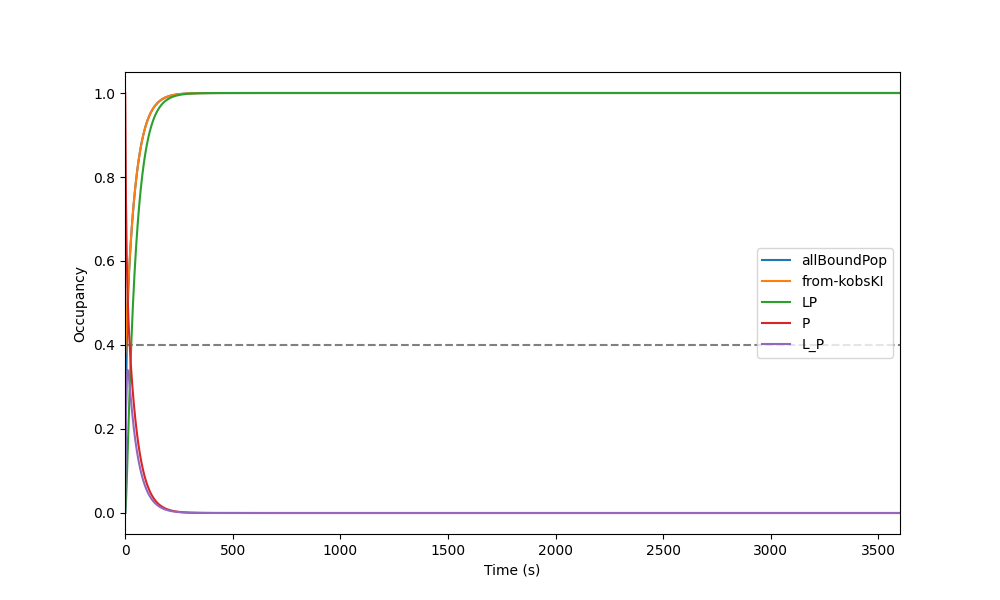

In [60]:

t = np.linspace(1, 3600, 1000)
Ki, koff, kinactf, kinactb, conc0Arr = 100, 0.1, 0.05, 0, [100,1,0,0]
model = ThreeState(Ki, koff, kinactf, kinactb, conc0Arr)
sol = model.solve(t)
occupancy = np.sum(sol[:, 2:], axis=1) #sol[:,-1] #finalStateOccFromPop(sol) #occFromPop(sol)
kobs,KINum = kobsKIFromTotalOcc(t[10:],occupancy[10:],conc0Arr[1],conc0Arr[0])

print("kobs:",kobs) #is there an eq to relate the parameters of four state to this that can match the kobs in eq 2?

plt.figure(figsize=(10, 6))
KI=(koff+kinactf)/model.kon
print(KI,KINum)

# Store the current x-axis limits
xlim = plt.xlim(0,t[-1])
plt.hlines(conc0Arr[1]/(1+(KI/conc0Arr[0])), t[0], t[-1], colors='grey', linestyles='--')

plt.plot(t, np.sum(sol[:, 2:], axis=1),label='allBoundPop')
plt.plot(t, totalOccFromKobsKI(t,kobs,conc0Arr[1],conc0Arr[0],KINum),label='from-kobsKI')
plt.plot(t, sol[:,-1],label='LP')
plt.plot(t, sol[:, 1],label='P')
plt.plot(t, sol[:, 2],label='L_P')

plt.xlabel('Time (s)')
plt.ylabel('Occupancy')
plt.legend()
plt.show()


##### 4 state final occupancy vs time 

kobs: 0.008917299207771283


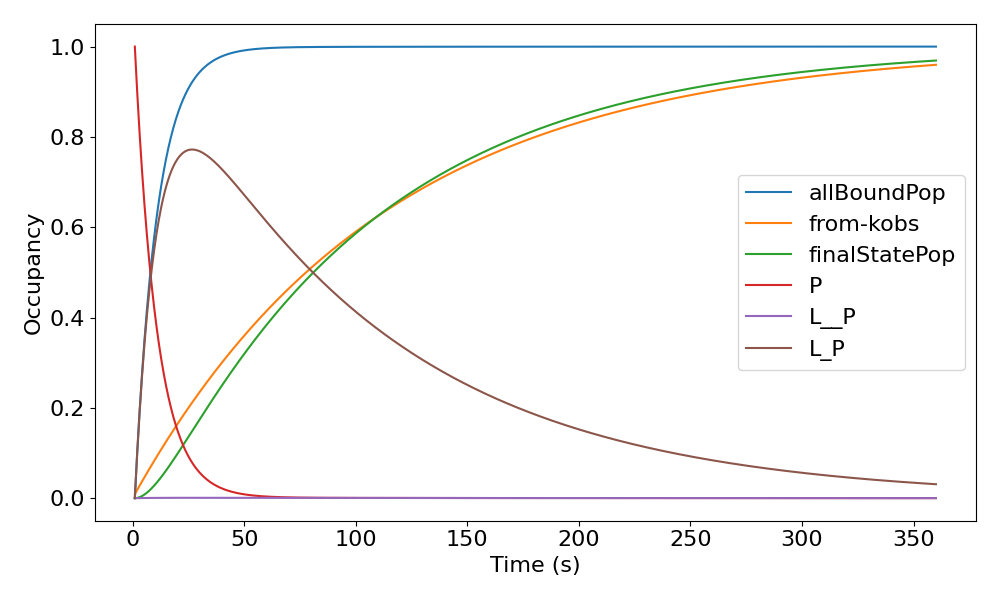

In [640]:

t = np.linspace(1, 360, 1000)
Ki, koff, intOOM, Pf, kqmf, kqmb, conc0Arr = 100, 0.1, 5, 0.999, 0.01, 0, [100,1,0,0,0]
model = FourState(Ki, koff, intOOM, Pf, kqmf, kqmb, conc0Arr)
sol = model.solve(t)
occupancy = sol[:,-1] #finalStateOccFromPop(sol) #occFromPop(sol)
kobs = kobsFromOcc(t,occupancy,conc0Arr[1])

L__P=sol[:, 2]# / (sol[:,1]+sol[:,2]+sol[:,3]+sol[:,4])
L_P=sol[:, 3]# / (sol[:,1]+sol[:,2]+sol[:,3]+sol[:,4])
#print(L__P[11]-L__P[10])
#print(L_P[11]-L_P[10])
print("kobs:",kobs) #is there an eq to relate the parameters of four state to this that can match the kobs in eq 2?
plt.figure(figsize=(10, 6))
plt.plot(t, np.sum(sol[:, 2:], axis=1),label='allBoundPop')
plt.plot(t, occFromKobs(t,kobs,conc0Arr[1]),label='from-kobs')
plt.plot(t, sol[:,-1],label='finalStatePop')
plt.plot(t, sol[:, 1],label='P')
plt.plot(t, L__P,label='L__P')
plt.plot(t, L_P,label='L_P')

plt.xlabel('Time (s)')
plt.ylabel('Occupancy')
plt.legend()
plt.show()


##### 4 state total occupancy vs time 
- Notes
    - For four state, KI needs Pf modification for the proper Y0 to be drawn with the deterministic soln (assuming rapid equil)
    - very inaccurate for high conc0I 
    - moderately inaccurate for high Pf

kobs: 0.0007810714771073789
550.0 625.905104755731


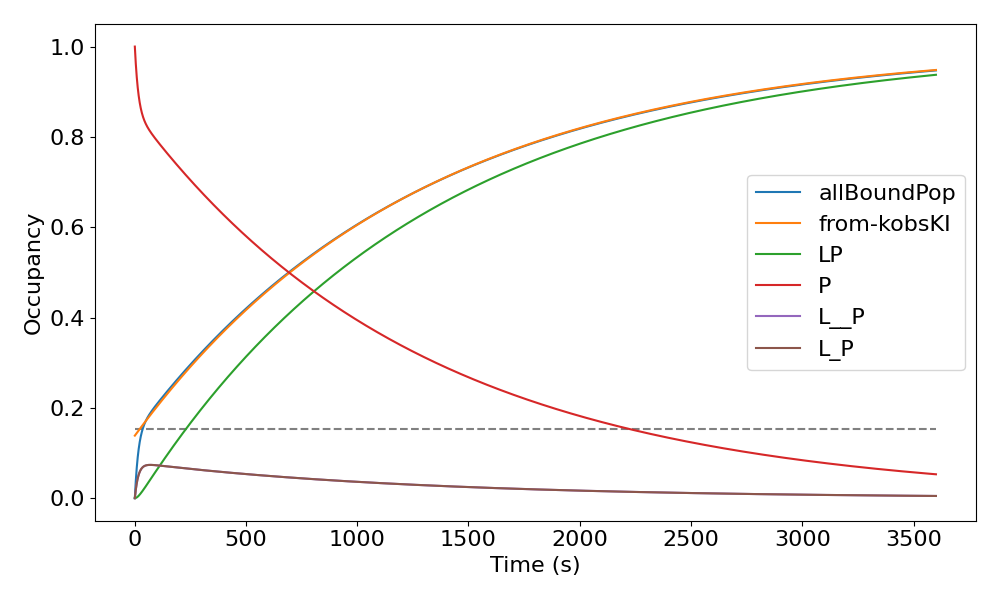

In [638]:

t = np.linspace(1, 3600, 10000)
Ki, koff, intOOM, Pf, kqmf, kqmb, conc0Arr = 1000, 0.1, 5, 0.5, 0.01, 0, [100,1,0,0,0]
model = FourState(Ki, koff, intOOM, Pf, kqmf, kqmb, conc0Arr)
sol = model.solve(t)
occupancy = np.sum(sol[:, 2:], axis=1) #sol[:,-1] #finalStateOccFromPop(sol) #occFromPop(sol)
kobs,KINum = kobsKIFromTotalOcc(t,occupancy,conc0Arr[1],conc0Arr[0])

print("kobs:",kobs) #is there an eq to relate the parameters of four state to this that can match the kobs in eq 2?

plt.figure(figsize=(10, 6))
KI=((1-Pf)*(koff)+(Pf*kqmf))/model.kon
plt.hlines(conc0Arr[1]/(1+(KI/conc0Arr[0])), t[0], t[-1], colors='grey', linestyles='--')
print(KI,KINum)
plt.plot(t, np.sum(sol[:, 2:], axis=1),label='allBoundPop')
plt.plot(t, totalOccFromKobsKI(t,kobs,conc0Arr[1],conc0Arr[0],KINum),label='from-kobsKI')
plt.plot(t, sol[:,-1],label='LP')
plt.plot(t, sol[:, 1],label='P')
plt.plot(t, sol[:, 2],label='L__P')
plt.plot(t, sol[:, 3],label='L_P')

plt.xlabel('Time (s)')
plt.ylabel('Occupancy')
plt.legend()
plt.show()


#### Misc

##### Checking proportionality for intermediate states

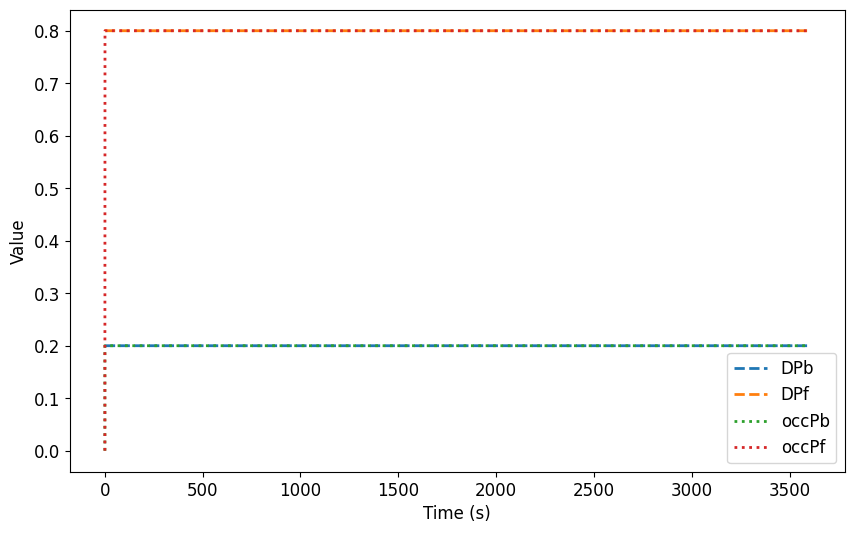

In [250]:
#proportion of slopes = proportion of rate constants = proportion of occupancy

# calculate the gradient/slope of L__P and L_P
DL__P = np.gradient(L__P, t)
DL_P = np.gradient(L_P, t)

# calculate the sum of slopes
sum_of_slopes = DL__P + DL_P

# calculate the DPf (proportion of the forward slope)
DPf = DL_P / sum_of_slopes
DPb = DL__P / sum_of_slopes

# add a small constant to the denominator to avoid division by zero
occPf = L_P / (L_P + L__P + 1e-9)
occPb = L__P / (L_P + L__P + 1e-9)

# plot the sum of slopes, DPf, and occPf
plt.figure(figsize=(10, 6))

# use linewidth and linestyle to make lines more distinguishable
plt.plot(t, DPb, label='DPb', linewidth=2, linestyle='--')
plt.plot(t, DPf, label='DPf', linewidth=2, linestyle='--')
plt.plot(t, occPb, label='occPb', linewidth=2, linestyle=':')
plt.plot(t, occPf, label='occPf', linewidth=2, linestyle=':')

plt.xlabel('Time (s)')
plt.ylabel('Value')
plt.legend()

plt.show()


##### Plotting rates of concentrations over time

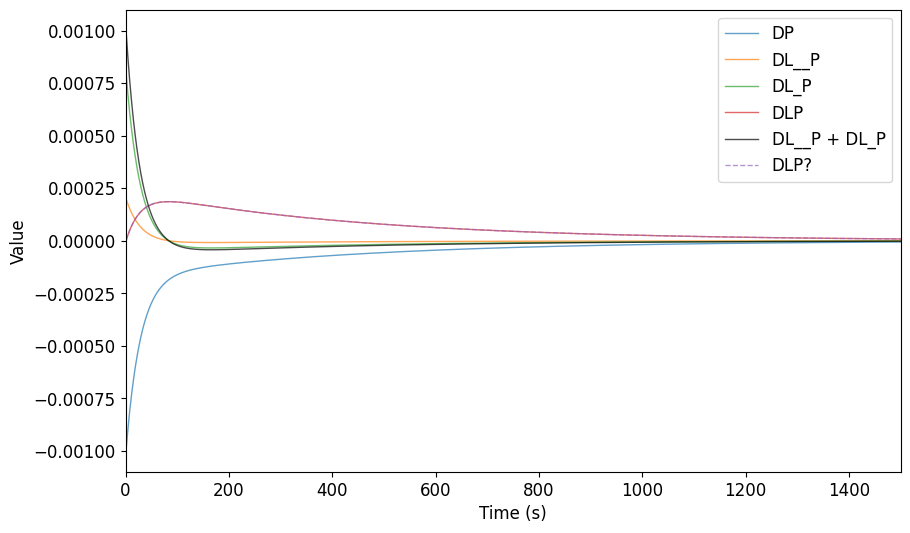

In [251]:
# calculate the gradient/slope of each state population over time
DP = np.gradient(sol[:, 1], t)
DL__P = np.gradient(sol[:, 2], t)
DL_P = np.gradient(sol[:, 3], t)
DLP = np.gradient(sol[:, 4], t)

# calculate the sum of slopes
DIntSum = DL__P + DL_P

# plot all the slopes and the sum of slopes
fig, ax = plt.subplots(figsize=(10, 6))

# use linewidth and linestyle to make lines more distinguishable
ax.plot(t, DP, label='DP', linewidth=1, linestyle='-',alpha=0.7)
ax.plot(t, DL__P, label='DL__P', linewidth=1, linestyle='-',alpha=0.7)
ax.plot(t, DL_P, label='DL_P', linewidth=1, linestyle='-',alpha=0.7)
ax.plot(t, DLP, label='DLP', linewidth=1, linestyle='-',alpha=0.7)
ax.plot(t, DIntSum, label='DL__P + DL_P', linewidth=1, linestyle='-', color='black',alpha=0.7)
ax.plot(t, 0 - DL__P - DL_P - DP, label='DLP?', linewidth=1, linestyle='--',alpha=0.7)

#ax.set_xscale('log')
ax.set_xlim(0,1500)
ax.set_xlabel('Time (s)')
ax.set_ylabel('Value')
ax.legend()

plt.show()


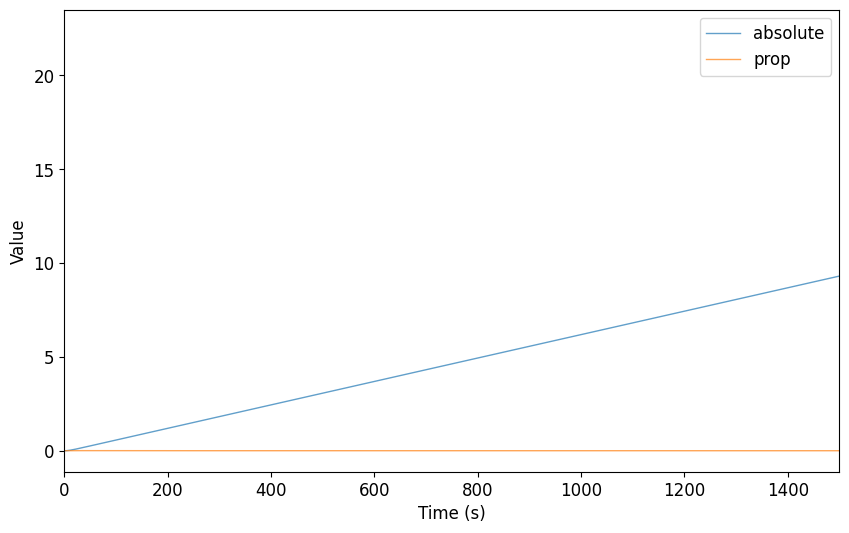

In [219]:
# calculate the gradient/slope of each state population over time
DP = np.gradient(sol[:, 1], t)
DL__P = np.gradient(sol[:, 2], t)
DL_P = np.gradient(sol[:, 3], t)
DLP = np.gradient(sol[:, 4], t)

# calculate the sum of slopes
DIntSum = DL__P + DL_P

# plot all the slopes and the sum of slopes
fig, ax = plt.subplots(figsize=(10, 6))

# use linewidth and linestyle to make lines more distinguishable
ax.plot(t, sol[:,4], label='absolute', linewidth=1, linestyle='-',alpha=0.7)
ax.plot(t, DLP, label='prop', linewidth=1, linestyle='-',alpha=0.7)


#ax.set_xscale('log')
ax.set_xlim(0,1500)
ax.set_xlabel('Time (s)')
ax.set_ylabel('Value')
ax.legend()

plt.show()


#### Nice Plots and Insightful Questions
- Used for lab pres Oct 2023

In [39]:
matplotlib.rcParams['figure.figsize'] = (8,8)
matplotlib.rcParams.update({'font.size': 16})
plt.rcParams["figure.autolayout"] = True

kobsA: 0.0046019507739392075


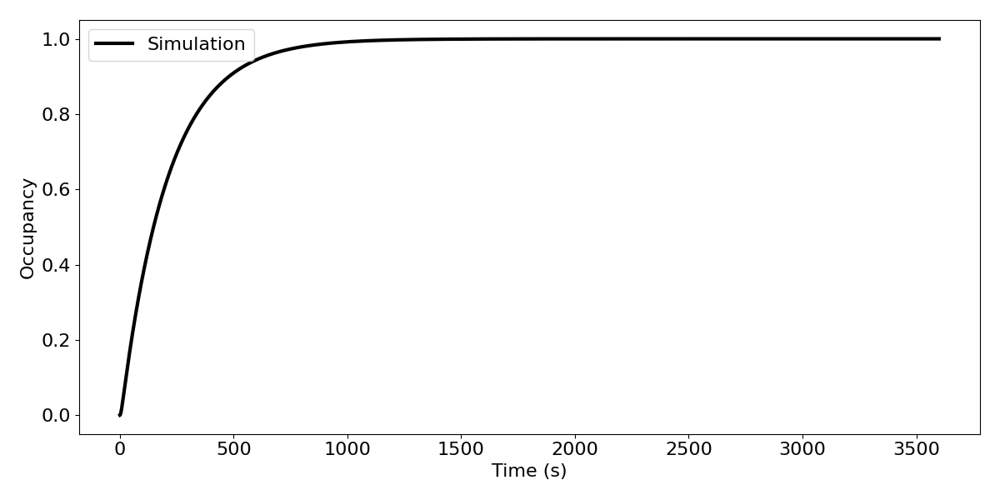

In [156]:
t = np.geomspace(1, 3600, 1000)
Ki, koff, intOOM, Pf, kqmf, kqmb, conc0ArrA = 100, 0.1, 5, 0.9, 0.01, 0, [100,1,0,0]
modelA = ThreeState(Ki, koff, kqmf, kqmb, conc0ArrA)
solA = modelA.solve(t)
occupancyA = solA[:,-1]
kobsA = kobsFromOcc(t,occupancyA,conc0ArrA[1])


print("kobsA:",kobsA)
plt.figure(figsize=(12, 6))

plt.plot(t, solA[:,-1],label='Simulation',color="black",lw=3)
#plt.plot(t, occFromKobs(t,kobsA,conc0ArrA[1]),label=r"Fit, $k_{obs} \approx$"+str(round(kobsA,4))+" $s^{-1}$",linestyle='--',alpha=0.9,color='red', lw=2)


plt.xlabel('Time (s)')
plt.ylabel('Occupancy')
plt.legend()
plt.show()

KI3: Num=110, Anal=110		      kinact3: Num=0.00991, Anal=0.01


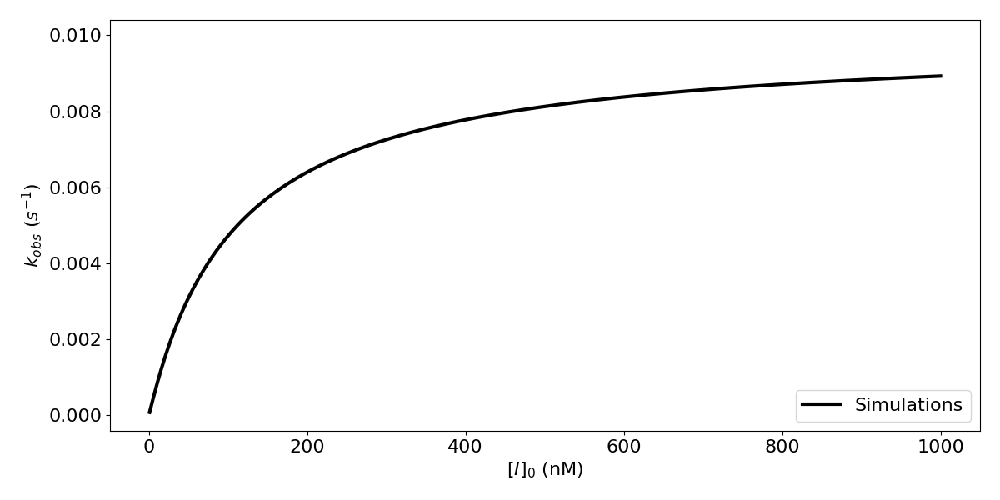

In [157]:
t = np.linspace(1, 3600, 1000)
concI_values = np.linspace(1,1000,200) #initial values of [I]
kobsNum3 = []
kobsNum4 = []

Ki, koff=100,0.1
kinactf, kinactb, conc0Arr3 = 0.01, 0, [100,1,0,0]
intOOM, Pf, kqmf, kqmb, conc0Arr4 = 5.0, 0.5, kinactf, kinactb, [conc0Arr3[0],conc0Arr3[1],conc0Arr3[2],conc0Arr3[3],0]
model3 = ThreeState(Ki, koff, kinactf, kinactb, conc0Arr3)
for concI in concI_values:
    model3.conc0Arr=[concI,conc0Arr3[1],conc0Arr3[2],conc0Arr3[3]]
    sol3 = model3.solve(t)
    occupancy3 = sol3[:,-1] #finalStateOccFromPop(sol3) 
    kobs3 = kobsFromOcc(t,occupancy3,conc0Arr3[1])
    kobsNum3.append(kobs3)


#note that analytical calc of kinact is kcat*[Etotal], but [Etotal] is normalized to 1!
KI3Num, kinact3Num = kinactKIFromkobs(concI_values, kobsNum3)
Ptotal3=(conc0Arr3[1]+conc0Arr3[2]+conc0Arr3[3])
kinact3Anal=kinactf #*Ptotal3 
KI3Anal=(model3.koff+kinact3Anal)/model3.kon
print(f"KI3: Num={round(KI3Num)}, Anal={round(KI3Anal)}\t\t\
      kinact3: Num={round(kinact3Num,5)}, Anal={round(kinact3Anal,5)}")
kobsAnal3=kobsFromConcI(KI3Anal,kinact3Anal,concI_values)


plt.figure(figsize=(12, 6))



plt.plot(concI_values, kobsNum3, label=f'Simulations',linestyle='-',alpha=1,color="black",lw=3)
#plt.plot(concI_values, kobsAnal3, label=f'Fit',linestyle='--',alpha=1,color="red", lw=2)

# Grey dashed line for kinact3Num
plt.axhline(y=kinact3Num, color='white', linestyle='--')
#plt.text(0, kinact3Num, '$k_{inact}$', verticalalignment='top', horizontalalignment='left', color='black', fontsize=20)

ax = plt.gca()
xmin=ax.get_xlim()[0]
ymin=ax.get_ylim()[0]
plt.xlim(ax.get_xlim()[0],ax.get_xlim()[1])
plt.ylim(ax.get_ylim()[0],ax.get_ylim()[1])

# Identify the concentration where kobs is closest to half_kinact3Num
half_kinact3Num = kinact3Num / 2
idx_half_kinact3 = np.abs(np.array(kobsNum3) - half_kinact3Num).argmin()
concI_half_kinact3 = concI_values[idx_half_kinact3]

# Grey dashed lines for KI3Num: horizontal and vertical
#plt.hlines(y=half_kinact3Num, xmin=xmin, xmax=concI_half_kinact3, color='grey', linestyle='--')
#plt.vlines(x=concI_half_kinact3, ymin=ymin, ymax=half_kinact3Num, color='grey', linestyle='--')
#plt.text(KI3Num, 0, ' $K_I$', verticalalignment='bottom', horizontalalignment='left', color='black', fontsize=20)
#plt.text(0, kinact3Num/2, r'$\frac{k_{inact}}{2}$', verticalalignment='bottom', horizontalalignment='right', color='black', fontsize=16)

plt.xlim(xmin)

plt.xlabel('$[I]_{0}$ (nM)')
plt.ylabel('$k_{obs}$ ($s^{-1}$)')
plt.legend()
plt.show()

##### What happens when you measure a 4 state system like 3 state?

kobsA: 0.0008034484639654724
kobsB: 0.0005196164073193652


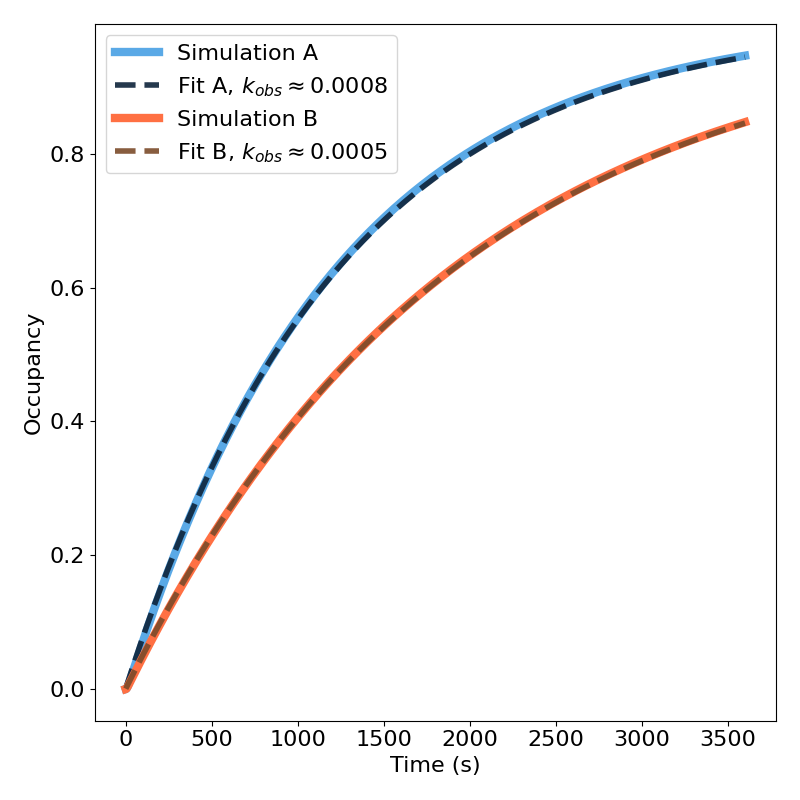

In [138]:
t = np.geomspace(1, 3600, 1000)
Ki, koff, intOOM, Pf, kqmf, kqmb, conc0ArrA = 100, 0.1, 5, 0.9, 0.001, 0, [100,1,0,0,0]
modelA = FourState(Ki, koff, intOOM, Pf, kqmf, kqmb, conc0ArrA)
solA = modelA.solve(t)
occupancyA = solA[:,-1]
kobsA = kobsFromOcc(t,occupancyA,conc0ArrA[1])


Ki, koff, intOOM, Pf, kqmf, kqmb, conc0ArrB = 100, 0.1, 5, 0.1, 0.01, 0, [100,1,0,0,0]
modelB = FourState(Ki, koff, intOOM, Pf, kqmf, kqmb, conc0ArrB)
solB = modelB.solve(t)
occupancyB = solB[:,-1]
kobsB = kobsFromOcc(t,occupancyB,conc0ArrB[1])

print("kobsA:",kobsA)
print("kobsB:",kobsB)
plt.figure(figsize=(8, 8))

plt.plot(t, solA[:,-1],label='Simulation A',color='#5AA9E6',lw=6)
plt.plot(t, occFromKobs(t,kobsA,conc0ArrA[1]),label=r"Fit A, $k_{obs} \approx$"+str(round(kobsA,4)),linestyle='--',alpha=0.9,color='#0D233A', lw=4)
plt.plot(t, solB[:,-1],label='Simulation B',color='#FF7043',lw=6)
plt.plot(t, occFromKobs(t,kobsB,conc0ArrB[1]),label=r"Fit B, $k_{obs} \approx$"+str(round(kobsB,4)),linestyle='--',alpha=0.9,color='#7B4B2A', lw=4)

plt.xlabel('Time (s)')
plt.ylabel('Occupancy')
plt.legend()
plt.show()


KIA: Num=12		4SAnal=11		3S Anal=101
    kinactA: Num=0.0009		4SAnal=0.0009		3S Anal=0.001

KIB: Num=92		4S Anal=91		3S Anal=110
    kinactB: Num=0.001		4S Anal=0.001		3S Anal=0.01



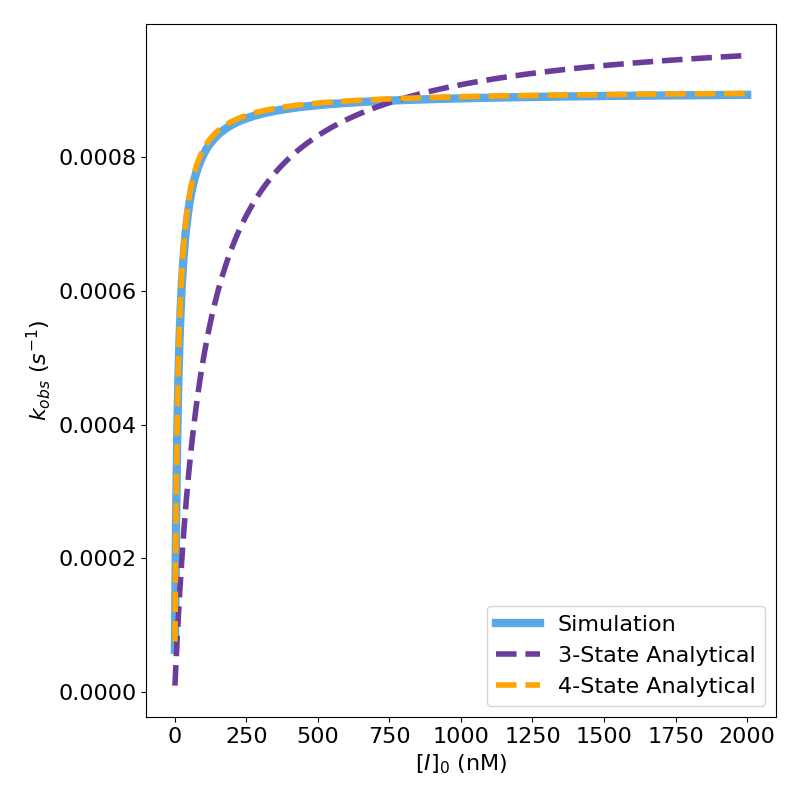

Unhandled message type set_device_pixel_ratio. {'device_pixel_ratio': 2, 'type': 'set_device_pixel_ratio'}


In [20]:
t = np.geomspace(1, 3600, 1000)
concI_values = np.linspace(1,2000,500) #initial values of [I]
kobsANum = []
kobsBNum = []

Ki, koff, intOOM, Pf, kqmf, kqmb, conc0ArrA = 100, 0.1, 5, 0.9, 0.001, 0, [100,1,0,0,0]
modelA = FourState(Ki, koff, intOOM, Pf, kqmf, kqmb, conc0ArrA)

Ki, koff, intOOM, Pf, kqmf, kqmb, conc0ArrB = 100, 0.1, 5, 0.1, 0.01, 0, [100,1,0,0,0]
modelB = FourState(Ki, koff, intOOM, Pf, kqmf, kqmb, conc0ArrB)


for concI in concI_values:
    modelA.conc0Arr=[concI,conc0ArrA[1],conc0ArrA[2],conc0ArrA[3],conc0ArrA[4]]
    solA = modelA.solve(t)
    occupancyA = solA[:,-1]
    kobsA = kobsFromOcc(t,occupancyA,conc0ArrA[1])
    kobsANum.append(kobsA)

    modelB.conc0Arr=[concI,conc0ArrB[1],conc0ArrB[2],conc0ArrB[3],conc0ArrB[4]]
    solB = modelB.solve(t)
    occupancyB = solB[:,-1]
    kobsB = kobsFromOcc(t,occupancyB,conc0ArrB[1])
    kobsBNum.append(kobsB)

KIANum, kinactANum = kinactKIFromkobs(concI_values, kobsANum)
PtotalA=(conc0ArrA[1],conc0ArrA[2],conc0ArrA[3],conc0ArrA[4])
kinactA3SAnal=modelA.kqmf #*Ptotal3 
KIA3SAnal=(modelA.koff+kinactA3SAnal)/modelA.kon
kinactA4SAnal=modelA.Pf*modelA.kqmf #*Ptotal4 #kinactEff
KIA4SAnal=((modelA.koff)*(1-modelA.Pf)+kinactA4SAnal)/modelA.kon #KIEff
print(f"KIA: Num={round(KIANum)}\t\t4SAnal={round(KIA4SAnal)}\t\t3S Anal={round(KIA3SAnal)}\n\
    kinactA: Num={round(kinactANum,5)}\t\t4SAnal={round(kinactA4SAnal,5)}\t\t3S Anal={round(kinactA3SAnal,5)}\n")
kobsA3SAnal=kobsFromConcI(KIA3SAnal,kinactA3SAnal,concI_values)
kobsA4SAnal=kobsFromConcI(KIA4SAnal,kinactA4SAnal,concI_values)

KIBNum, kinactBNum = kinactKIFromkobs(concI_values, kobsBNum)
PtotalB=(conc0ArrB[1],conc0ArrB[2],conc0ArrB[3],conc0ArrB[4])
kinactB3SAnal=modelB.kqmf #*Ptotal3 
KIB3SAnal=(modelB.koff+kinactB3SAnal)/modelB.kon
kinactB4SAnal=modelB.Pf*modelB.kqmf #*Ptotal4 #kinactEff
KIB4SAnal=((modelB.koff)*(1-modelB.Pf)+kinactB4SAnal)/modelB.kon #KIEff
print(f"KIB: Num={round(KIBNum)}\t\t4S Anal={round(KIB4SAnal)}\t\t3S Anal={round(KIB3SAnal)}\n\
    kinactB: Num={round(kinactBNum,5)}\t\t4S Anal={round(kinactB4SAnal,5)}\t\t3S Anal={round(kinactB3SAnal,5)}\n")
kobsB3SAnal=kobsFromConcI(KIB3SAnal,kinactB3SAnal,concI_values)
kobsB4SAnal=kobsFromConcI(KIB4SAnal,kinactB4SAnal,concI_values)

plt.figure(figsize=(8, 8))

plt.plot(concI_values, kobsANum, label=f'Simulation',linestyle='-',alpha=1,lw=6,color='#5AA9E6')
plt.plot(concI_values, kobsA3SAnal, label=f'3-State Analytical',linestyle='--',alpha=1,lw=4,color='#6A3D9A')
plt.plot(concI_values, kobsA4SAnal, label=f'4-State Analytical',linestyle='--',alpha=1,lw=4,color="orange")
#plt.plot(concI_values, kobsBNum, label=f'Sim B',linestyle='-',alpha=1,lw=2,color='#FF7043')
#plt.plot(concI_values, kobsB3SAnal, label=f'3S Fit B',linestyle='--',alpha=0.7,lw=2,color='#7B4B2A')
#plt.plot(concI_values, kobsB4SAnal, label=f'4S Fit B',linestyle='--',alpha=0.7,lw=2)


plt.xlabel('$[I]_{0}$ (nM)')
plt.ylabel('$k_{obs}$ ($s^{-1}$)')

plt.legend()
plt.show()


## Deconvoluting kinetic effects of Pf 

In [45]:
koff_values=np.arange(0.1,0.9,0.1)
output=FourState.specificity_eff(koff_values/10,koff_values,0.5,0.001)
print(koff_values)
print(output)

[0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8]
[9.90099010e-05 9.95024876e-05 9.96677741e-05 9.97506234e-05
 9.98003992e-05 9.98336106e-05 9.98573466e-05 9.98751561e-05]


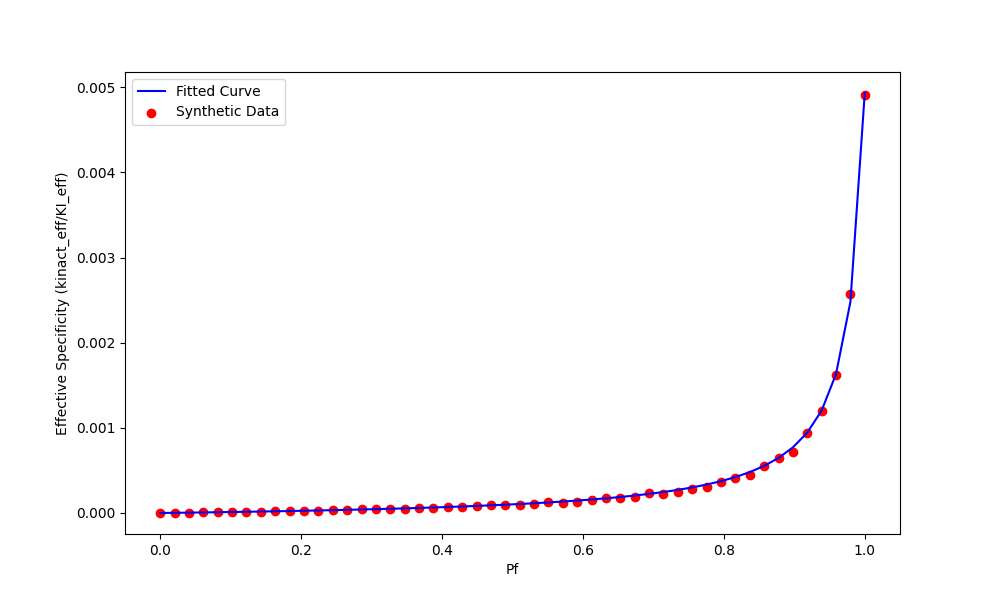

Fitted kon: 0.004932390172695949, Fitted koff: 0.04999290718246604, Fitted kinact: 0.001051632834316852


In [94]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Function to generate synthetic data for specificity_eff
def generate_synthetic_specificity_eff(kon, koff, kinact, Pf_values, kon_koff_percent_change=0.05):
    specificity_eff_values = []
    kon_changes = np.random.uniform(1 - kon_koff_percent_change, 1 + kon_koff_percent_change, len(Pf_values))
    koff_changes = np.random.uniform(1 - kon_koff_percent_change, 1 + kon_koff_percent_change, len(Pf_values))
    
    for i, Pf in enumerate(Pf_values):
        kon_new = kon * kon_changes[i]
        koff_new = koff * koff_changes[i]
        specificity_eff = FourState.specificity_eff(kon_new, koff_new, Pf, kinact)
        specificity_eff_values.append(specificity_eff)
        
    return Pf_values, np.array(specificity_eff_values)

# Function to fit to synthetic data and obtain estimated Pf values
def fit_to_synthetic_specificity_eff(Pf_values, specificity_eff_values, kon, koff, kinact):
    def model_func(Pf, kon_fit, koff_fit, kinact_fit):
        return FourState.specificity_eff(kon_fit, koff_fit, Pf, kinact_fit)

    popt, _ = curve_fit(model_func, Pf_values, specificity_eff_values, p0=[kon, koff, kinact], bounds=(0, np.inf))
    kon_fit, koff_fit, kinact_fit = popt
    return kon_fit, koff_fit, kinact_fit

# Configurable parameters
kon = 0.005
koff = 0.05
kinact = 0.001
Pf_values = np.linspace(0, 1, 50)

# Generate synthetic data
Pf_synthetic, specificity_eff_synthetic = generate_synthetic_specificity_eff(kon, koff, kinact, Pf_values)

# Fit synthetic data to model
kon_fit, koff_fit, kinact_fit = fit_to_synthetic_specificity_eff(Pf_synthetic, specificity_eff_synthetic, kon, koff, kinact)

# Generate fitted curve
specificity_eff_fitted = [FourState.specificity_eff(kon_fit, koff_fit, Pf, kinact_fit) for Pf in Pf_synthetic]

# Plotting
plt.figure(figsize=(10, 6))
plt.scatter(Pf_synthetic, specificity_eff_synthetic, label='Synthetic Data', color='red')
plt.plot(Pf_synthetic, specificity_eff_fitted, label='Fitted Curve', color='blue')
plt.xlabel('Pf')
plt.ylabel('Effective Specificity (kinact_eff/KI_eff)')
plt.legend()
plt.show()

# Output fitted parameters
print(f"Fitted kon: {kon_fit}, Fitted koff: {koff_fit}, Fitted kinact: {kinact_fit}")



## Sensitivity Analysis

High S1, High ST: Parameter is important individually and through interactions. Prioritize this in rational design and experiments.

Low S1, High ST: Parameter doesn't impact much alone but does through interactions. Complex tuning required.

High S1, Low ST: Rare. Indicates strong individual effect but weakens in interactions.

Low S1, Low ST: Least impactful. Lower priority for experimental tuning.

### Four State

In [10]:
from SALib.sample import saltelli
from SALib.analyze import sobol
import numpy as np

# Define the model input parameters
problem = {
    'num_vars': 4,
    'names': ['kon', 'koff', 'Pf', 'kinact'],
    'bounds': [[0.001, 0.1],  
               [0.01, 1.0],
               [0.001, 0.999],
               [0.001, 0.1]]
}

# Generate samples
param_values = saltelli.sample(problem, 1024)  # N = 1024

# Use analytical data
Y = np.zeros([param_values.shape[0]])

for i, X in enumerate(param_values):
    kon, koff, Pf, kinact = X
    Y[i] = FourState.specificity_eff(kon, koff, Pf, kinact)

# Perform sensitivity analysis
Si = sobol.analyze(problem, Y)

s1 = Si['S1']
st = Si['ST']

max_len = max(len(name) for name in problem['names'])
for i, name in enumerate(problem['names']):
    print(f"{name.ljust(max_len)} S1: {s1[i]:.6f} ST: {st[i]:.6f}")


kon    S1: 0.131477 ST: 0.343346
koff   S1: 0.129380 ST: 0.220444
Pf     S1: 0.405940 ST: 0.599755
kinact S1: 0.048672 ST: 0.141550


/tmp/ipykernel_1709890/3312829234.py:16: DeprecationWarning: `salib.sample.saltelli` will be removed in SALib 1.5. Please use `salib.sample.sobol`
  param_values = saltelli.sample(problem, 1024)  # N = 1024


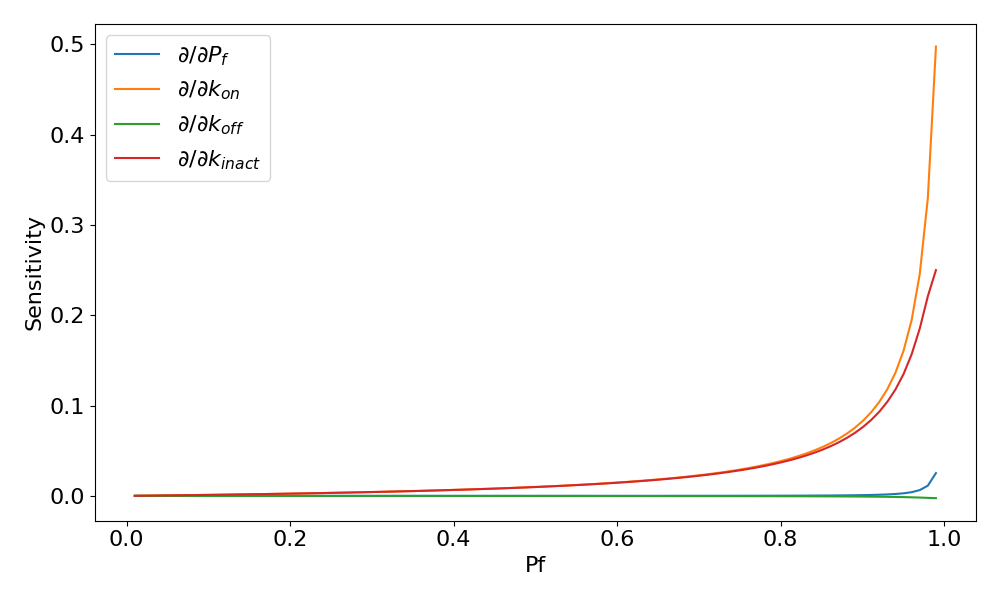

In [9]:
import matplotlib.pyplot as plt
import numpy as np

# Parameters
kon = .001
koff = .1
kinact = .001
Pf = np.linspace(0.01, 0.99, 100)

specifity = (kinact * Pf) / ((koff * (1-Pf) + (kinact * Pf)) / kon)

# Derivatives
d_dPf = (kinact * koff * kon) / ((koff - kinact) * Pf - koff)**2
d_dkon = (kinact * Pf) / (koff * (1-Pf) + (kinact * Pf))
d_dkoff = (kinact * Pf * kon * (Pf-1)) / (koff * (Pf-1) - kinact * Pf)**2
d_dkinact = -(koff * kon * (Pf - 1) * Pf) / ((kinact * Pf) + koff * (1 - Pf))**2

# Plot
plt.figure(figsize=(10, 6))
plt.plot(Pf, d_dPf, label='∂/∂$P_f$')
plt.plot(Pf, d_dkon, label='∂/∂$k_{on}$')
plt.plot(Pf, d_dkoff, label='∂/∂$k_{off}$')
plt.plot(Pf, d_dkinact, label='∂/∂$k_{inact}$')
plt.xlabel('Pf')
plt.ylabel('Sensitivity')
plt.legend()
plt.show()



## Analytical Four State

### trying to derive like MM

/var/folders/qn/_ycs9r7x5_s957ytrjv2bq3r0000gn/T/ipykernel_49975/2196268371.py:9: RuntimeWarning: divide by zero encountered in true_divide
  kanal= kqmf*(model.k1f*(PF)*(model.k1f+model.k1b))/(sol[:,2]*model.k1b*(1-PF))


600000.0 400000.0
0.6
0.0010489924056770361


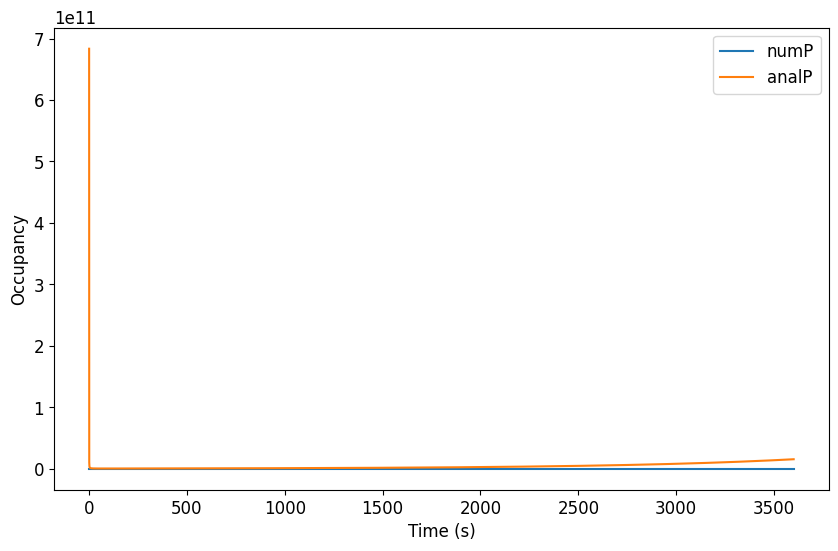

In [327]:
t = np.geomspace(1, 3600, 1000)
Ki, koff, intOOM, Pf, kqmf, kqmb, conc0Arr = 1000, 0.1, 5, 0.6, 0.01, 0, [100,0.1,0,0,0]
model = FourState(Ki, koff, intOOM, Pf, kqmf, kqmb, conc0Arr)
sol = model.solve(t)
occupancy = sol[:,-1] #finalStateOccFromPop(sol) #occFromPop(sol)
kobs = kobsFromOcc(t,occupancy,conc0Arr[1])
PF=model.k1f/(model.k1f+model.k1b)
PB=model.k1b/(model.k1f+model.k1b) #able to be constant bc of rapid equil. otherwise its sol[:,3]/(sol[:,2]+sol[:,3]) 
kanal= kqmf*(model.k1f*(PF)*(model.k1f+model.k1b))/(sol[:,2]*model.k1b*(1-PF))
print(model.k1f,model.k1b)
print(PF)
print(kobs)#,kanal)
plt.figure(figsize=(10, 6))
plt.plot(t, sol[:, 4],label='numP')
plt.plot(t, (kanal/kqmf),label='analP')

plt.xlabel('Time (s)')
plt.ylabel('Occupancy')
plt.legend()
plt.show()

### Testing
- Notes 
    - kinact!=kcat*totalE=vmax based on tests trying to limit kobs with initial E

KI3: Num=1314, Anal=1333		      kinact3: Num=0.00936, Anal=0.01
KI4: Num=685, Anal=667		      kinact4: Num=0.0048, Anal=0.005


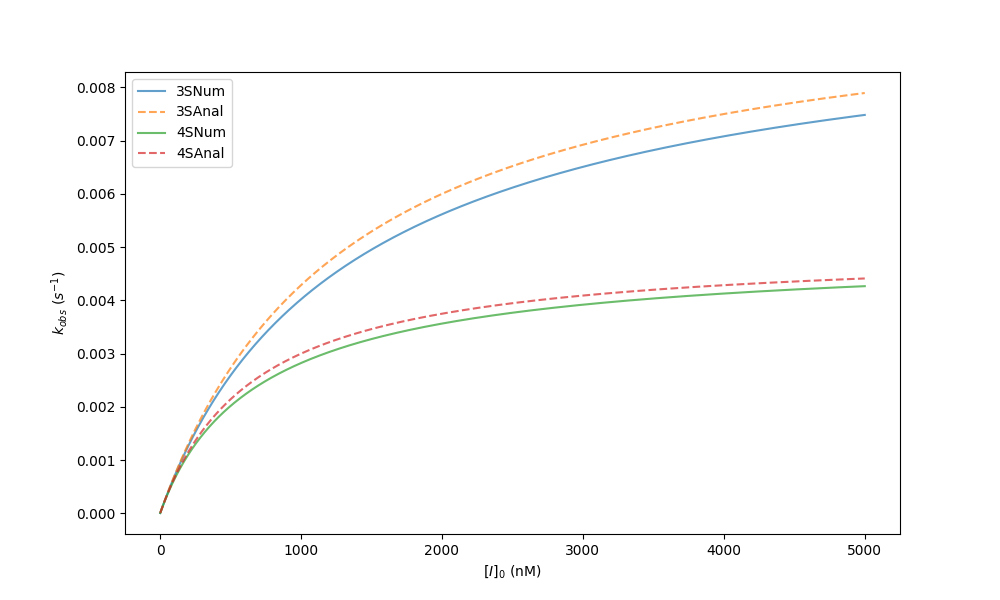

In [65]:
t = np.geomspace(1, 7200, 2000)
concI_values = np.geomspace(1,5000,5000) #initial values of [I]
kobsNum3 = []
kobsNum4 = []

Ki, koff=1000,0.03
kinactf, kinactb, conc0Arr3 = 0.01, 0, [100,0.1,0,0]
intOOM, Pf, kqmf, kqmb, conc0Arr4 = 5.0, 0.5, kinactf, kinactb, [conc0Arr3[0],conc0Arr3[1],conc0Arr3[2],conc0Arr3[3],0]
model3 = ThreeState(Ki, koff, kinactf, kinactb, conc0Arr3)
model4 = FourState(Ki, koff, intOOM, Pf, kqmf, kqmb, conc0Arr4)
for concI in concI_values:
    model3.conc0Arr=[concI,conc0Arr3[1],conc0Arr3[2],conc0Arr3[3]]
    sol3 = model3.solve(t)
    occupancy3 = sol3[:,-1] #finalStateOccFromPop(sol3) 
    kobs3 = kobsFromOcc(t,occupancy3,conc0Arr3[1])
    kobsNum3.append(kobs3)

    model4.conc0Arr=[concI,conc0Arr4[1],conc0Arr4[2],conc0Arr4[3],conc0Arr4[4]]
    sol4 = model4.solve(t)
    occupancy4 = sol4[:,-1] #finalStateOccFromPop(sol4) 
    kobs4 = kobsFromOcc(t,occupancy4,conc0Arr4[1])
    kobsNum4.append(kobs4)

#note that analytical calc of kinact is kcat*[Etotal], but [Etotal] is normalized to 1!
KI3Num, kinact3Num = kinactKIFromkobs(concI_values, kobsNum3)
Ptotal3=(conc0Arr3[1]+conc0Arr3[2]+conc0Arr3[3])
kinact3Anal=kinactf #*Ptotal3 
KI3Anal=(model3.koff+kinact3Anal)/model3.kon
print(f"KI3: Num={round(KI3Num)}, Anal={round(KI3Anal)}\t\t\
      kinact3: Num={round(kinact3Num,5)}, Anal={round(kinact3Anal,5)}")
kobsAnal3=kobsFromConcI(KI3Anal,kinact3Anal,concI_values)

KI4Num, kinact4Num = kinactKIFromkobs(concI_values, kobsNum4)
Ptotal4=(conc0Arr4[1]+conc0Arr4[2]+conc0Arr4[3]+conc0Arr4[4])
kinact4Anal=Pf*kqmf #*Ptotal4 #kinactEff
KI4Anal=((model4.koff)*(1-Pf)+kinact4Anal)/model4.kon #KIEff
print(f"KI4: Num={round(KI4Num)}, Anal={round(KI4Anal)}\t\t\
      kinact4: Num={round(kinact4Num,5)}, Anal={round(kinact4Anal,5)}")
kobsAnal4=kobsFromConcI(KI4Anal,kinact4Anal,concI_values)

plt.figure(figsize=(10, 6))
plt.plot(concI_values, kobsNum3, label=f'3SNum',linestyle='-',alpha=0.7)
plt.plot(concI_values, kobsAnal3, label=f'3SAnal',linestyle='--',alpha=0.7)
plt.plot(concI_values, kobsNum4, label=f'4SNum',linestyle='-',alpha=0.7)
plt.plot(concI_values, kobsAnal4, label=f'4SAnal',linestyle='--',alpha=0.7)


plt.xlabel('$[I]_{0}$ (nM)')
plt.ylabel('$k_{obs}$ ($s^{-1}$)')
plt.legend()
plt.show()



## Reduced Four State
-  Ref 
    - Benoit email 10jul23 (transcribed to notebook)
-  Notes
    - ()

##### Comparing 4S and 4SR

KI4R: Num=626, Anal=600		      kinact4R: Num=0.00572, Anal=0.006
KI4: Num=626, Anal=600		      kinact4: Num=0.00572, Anal=0.006


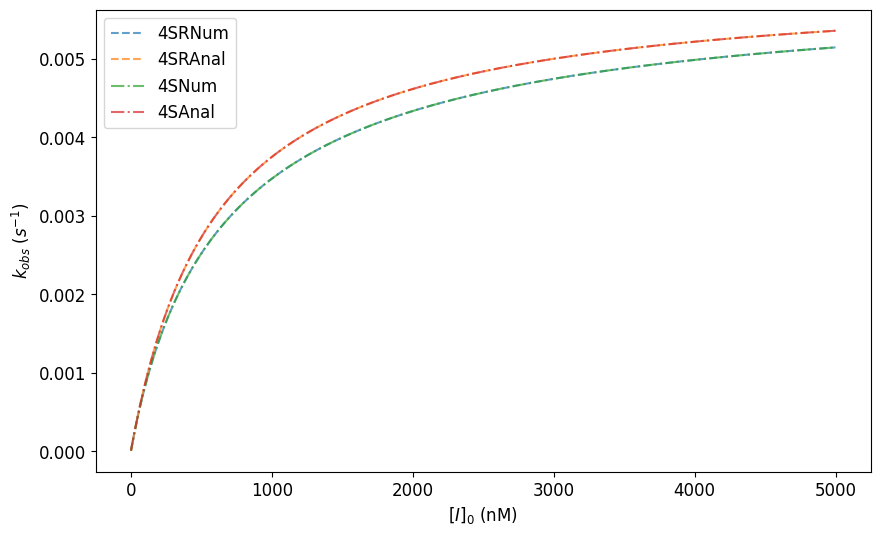

In [416]:
def kobsEffFromConcI(KIEff,kinactEff,concI,Pf): 
    return ((Pf*kinactEff) * concI) / (((1-Pf)*KIEff) + concI)

def kinactKIEffFromkobs(concI, kobs,Pf):
    func = lambda concI,KIEff,kinactEff: kobsEffFromConcI(KIEff,kinactEff,concI,Pf)
    popt, _ = curve_fit(func, concI, kobs, p0=[1000, 0.001], bounds=(0, np.inf))
    KIEff, kinactEff = popt
    return KIEff, kinactEff

t = np.geomspace(1, 7200, 200)

concI_values = np.geomspace(1,5000,200) #initial values of [I]
kobsNum4R = []
kobsNum4 = []

Ki, koff=1000,0.03
kinactf, kinactb, conc0Arr4R = 0.01, 0, [100,0.1,0,0]
intOOM, Pf, kqmf, kqmb, conc0Arr4 = 5.0, 0.6, kinactf, kinactb, [conc0Arr4R[0],conc0Arr4R[1],0,conc0Arr4R[2],conc0Arr4R[3]]
model4R = FourStateR(Ki, koff, intOOM, Pf, kqmf, kqmb, conc0Arr4R)
model4 = FourState(Ki, koff, intOOM, Pf, kqmf, kqmb, conc0Arr4)
for concI in concI_values:
    model4R.conc0Arr=[concI,conc0Arr4R[1],conc0Arr4R[2],conc0Arr4R[3]]
    sol4R = model4R.solve(t)
    occupancy4R = sol4R[:,-1] #finalStateOccFromPop(sol3) 
    kobs4R = kobsFromOcc(t,occupancy4R,conc0Arr4R[1])
    kobsNum4R.append(kobs4R)

    model4.conc0Arr=[concI,conc0Arr4[1],conc0Arr4[2],conc0Arr4[3],conc0Arr4[4]]
    sol4 = model4.solve(t)
    occupancy4 = sol4[:,-1] #finalStateOccFromPop(sol4) 
    kobs4 = kobsFromOcc(t,occupancy4,conc0Arr4[1])
    kobsNum4.append(kobs4)

#note that analytical calc of kinact is kcat*[Etotal], but [Etotal] is normalized to 1!
KI4RNum, kinact4RNum = kinactKIFromkobs(concI_values, kobsNum4R)
Ptotal4R=(conc0Arr4R[1]+conc0Arr4R[2]+conc0Arr4R[3])
kinact4RAnal=Pf*kqmf 
KI4RAnal=((model4R.koff*(1-Pf))+kinact4RAnal)/model4R.kon
print(f"KI4R: Num={round(KI4RNum)}, Anal={round(KI4RAnal)}\t\t\
      kinact4R: Num={round(kinact4RNum,5)}, Anal={round(kinact4RAnal,5)}")
kobsAnal4R=kobsFromConcI(KI4RAnal,kinact4RAnal,concI_values)

KI4Num, kinact4Num = kinactKIFromkobs(concI_values, kobsNum4)
Ptotal4=(conc0Arr4[1]+conc0Arr4[2]+conc0Arr4[3]+conc0Arr4[4])
kinact4Anal=Pf*kqmf #*Ptotal4 #kinactEff
KI4Anal=((model4.koff)*(1-Pf)+kinact4Anal)/model4.kon #KIEff
print(f"KI4: Num={round(KI4Num)}, Anal={round(KI4Anal)}\t\t\
      kinact4: Num={round(kinact4Num,5)}, Anal={round(kinact4Anal,5)}")
kobsAnal4=kobsFromConcI(KI4Anal,kinact4Anal,concI_values)

plt.figure(figsize=(10, 6))
plt.plot(concI_values, kobsNum4R, label=f'4SRNum',linestyle='--',alpha=0.7)
plt.plot(concI_values, kobsAnal4R, label=f'4SRAnal',linestyle='--',alpha=0.7)
plt.plot(concI_values, kobsNum4, label=f'4SNum',linestyle='-.',alpha=0.7)
plt.plot(concI_values, kobsAnal4, label=f'4SAnal',linestyle='-.',alpha=0.7)


plt.xlabel('$[I]_{0}$ (nM)')
plt.ylabel('$k_{obs}$ ($s^{-1}$)')
plt.legend()
plt.show()



##### Eig

In [22]:
Ki, koff=100,0.1
kinactf, kinactb, conc0Arr4R = 0.01, 0.0001, [100,1,0,0]
intOOM, Pf, kqmf, kqmb = 5.0, 0.5, kinactf, kinactb
model4R = FourStateR(Ki, koff, intOOM, Pf, kqmf, kqmb, conc0Arr4R)


t = np.linspace(0, 1000, 1000)

# ODE integration
sol = model4R.solve(t)

print(model4R.slowest_eigenvalue)


-0.05591938284210833


### Comparing 4SR and AXD

#### Deterministic sims

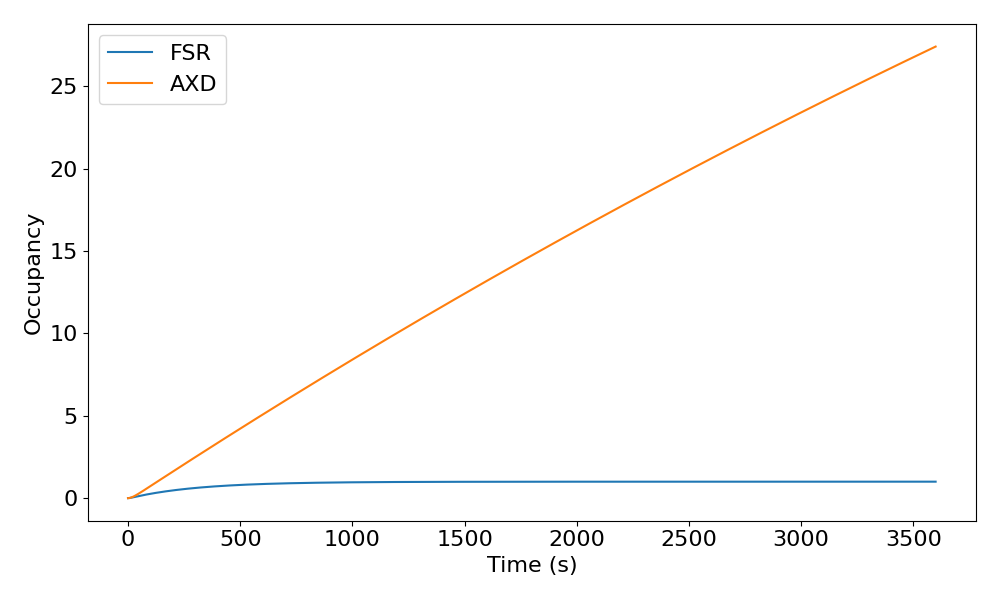

In [35]:

t = np.linspace(0.001, 3600, 10000)
Ki, koff, intOOM, Pf, kqmf, kqmb, conc0Arr = 100, 0.1, 5, 0.5, 0.01, 0, [100,1,0,0]
modelFSR = FourStateR(Ki, koff, intOOM, Pf, kqmf, kqmb, conc0Arr)
modelAXD = AXD(Ki, koff, intOOM, Pf, kqmf, kqmb, [conc0Arr[0],0,0])

solFSR = modelFSR.solve(t)
solAXD = modelAXD.solve(t)
occupancy = np.sum(sol[:, 2:], axis=1) #sol[:,-1] #finalStateOccFromPop(sol) #occFromPop(sol)


plt.figure(figsize=(10, 6))

plt.plot(t, solFSR[:,-1],label='FSR')
plt.plot(t, solAXD[:,-1],label='AXD')



plt.xlabel('Time (s)')
plt.ylabel('Occupancy')
plt.legend()
plt.show()


#### Eigenvalues changing for diff params
- Hard to compare. They are very different. The analytical form of the slowest decay and magnitude is different.

In [35]:
# Define parameter ranges
kon_values = np.linspace(0.0001, 10, 1000)
koff_values = np.linspace(0.0001, 10, 1000)
Pf_values=np.arange(0, 1.1, 0.1) #solving cannot finish accurately for lower Pfs
Pf_values[0]=0.001 #replace 0 with ~0
Pf_values[-1]=0.999 #replace 1 with ~1
kqmf_values = np.linspace(0.0001, 10, 1000)
kqmb_values = np.linspace(0.0001, 10, 1000)

params_dict = {
    "kon": {"plot_label": "$k_{on}$", "values": kon_values},
    "koff": {"plot_label": "$k_{off}$", "values": koff_values},
    "Pf": {"plot_label": "$P_f$", "values": Pf_values},
    "kqmf": {"plot_label": "$k^{qm}_f$", "values": kqmf_values},
    "kqmb": {"plot_label": "$k^{qm}_b$", "values": kqmb_values}
}

#establish time
t = np.linspace(1, 7200, 1000)

tabs = Tab()
tab_titles = []
tab_contents = []

for param, param_info in params_dict.items():
    values = param_info["values"]
    plot_label = param_info["plot_label"]
    eigslowFSR_values = []
    eigenvalueFSR_list = []
    eigslowAXD_values = []
    eigenvalueAXD_list = []

    fig = plt.figure(figsize=(10,6)) 
    ax1 = fig.add_subplot()  
    #ax1.set_yscale("symlog")
    ax1.yaxis.set_major_formatter(CustomFormatter('%.2e'))

    for value in values:
        try:
            kon, koff, intOOM, Pf, kqmf, kqmb = 0.1/100, 0.1, 5, 0.5, 0.01, 0 # default values
            conc0ArrFSR = [1,1,0,0]
            conc0ArrAXD = [1,0,0]
            if param == "kon":
                kon = value
                Ki=koff/kon
            elif param == "koff":
                koff = value
                Ki=koff/kon
            elif param == "Pf":
                Pf = value
            elif param == "kqmf":
                kqmf = value
            elif param == "kqmb":
                kqmb = value

            mFSR = FourStateR(Ki, koff, intOOM, Pf, kqmf, kqmb, conc0ArrFSR)
            eigenvalueFSR_list.append(mFSR.eigenvalues)
            eigslowFSR_values.append(mFSR.slowest_eigenvalue)

            mAXD = AXD(Ki, koff, intOOM, Pf, kqmf, kqmb, conc0ArrAXD)
            eigenvalueAXD_list.append(mAXD.eigenvalues)
            eigslowAXD_values.append(mAXD.slowest_eigenvalue)


        except RuntimeError as e:
            print(f"RuntimeError occurred: {e}")
            print(f"{param}  : {value}")

        except Exception as e:
            print(f"An error occurred: {e}")
            print(f"{param}  : {value}")

    # Plot all eigenvalues
    #eigenvalueFSR_matrix = np.array(eigenvalueFSR_list).T
    #eigenvalueAXD_matrix = np.array(eigenvalueAXD_list).T
    #for i in range(eigenvalueFSR_matrix.shape[0]):
    #    # Skip certain eigenvalues
    #    if i != 3:
    #        continue
    #    ax1.plot(values, np.real(eigenvalueFSR_matrix[i, :]), label=f'Eigenvalue {i+1}')

    # Plot slowest decay
    ax1.plot(values, eigslowFSR_values,label="FSR",linestyle='-',lw=1) 
    ax1.plot(values, eigslowAXD_values,label="AXD",linestyle='-',lw=1) 

    ax1.set_xlabel(plot_label)
    ax1.set_ylabel(r'${\lambda}_{slow}$')
    plt.legend()
    tab_contents.append(widgets.Output())
    tab_titles.append(param)
    with tab_contents[-1]:
        display(fig)
    plt.close(fig)

tabs.children = tab_contents

for i in range(len(tab_titles)):
    tabs.set_title(i, tab_titles[i])

display(tabs)



#### Populations changing for diff params

#### Old. Contains AXD eig calc

In [41]:
# Define parameter ranges
kon_values = np.linspace(0.0001, 10, 1000)
koff_values = np.linspace(0.0001, 10, 1000)
Pf_values=np.arange(0, 1.1, 0.1) #solving cannot finish accurately for lower Pfs
Pf_values[0]=0.001 #replace 0 with ~0
Pf_values[-1]=0.999 #replace 1 with ~1
kqmf_values = np.linspace(0.0001, 10, 1000)
kqmb_values = np.linspace(0.0001, 10, 1000)

params_dict = {
    "kon": {"plot_label": "$k_{on}$", "values": kon_values},
    "koff": {"plot_label": "$k_{off}$", "values": koff_values},
    "Pf": {"plot_label": "$P_f$", "values": Pf_values},
    "kqmf": {"plot_label": "$k^{qm}_f$", "values": kqmf_values},
    "kqmb": {"plot_label": "$k^{qm}_b$", "values": kqmb_values}
}

def calculate_eigenvalues(k1, k2, k5, k6):
    lambda1 = 0
    discriminant = (k1 + k2 + k5 + k6)**2 - 4 * (k1 * k5 + k1 * k6 + k2 * k6)
    sqrt_discriminant = np.sqrt(np.abs(discriminant))
    
    if discriminant >= 0:
        lambda2 = 0.5 * (-sqrt_discriminant - k1 - k2 - k5 - k6)
        lambda3 = 0.5 * (sqrt_discriminant - k1 - k2 - k5 - k6)
    else:
        real_part = -0.5 * (k1 + k2 + k5 + k6)
        imag_part = 0.5 * sqrt_discriminant
        lambda2 = complex(real_part, imag_part)
        lambda3 = complex(real_part, -imag_part)
        
    return lambda1, lambda2, lambda3



#establish time
t = np.linspace(1, 7200, 1000)

tabs = Tab()
tab_titles = []
tab_contents = []

for param, param_info in params_dict.items():
    values = param_info["values"]
    plot_label = param_info["plot_label"]
    eigslow_values = []
    lambda1_values=[]
    lambda2_values=[]
    lambda3_values=[]

    fig = plt.figure(figsize=(10,6)) 
    ax1 = fig.add_subplot()  
    ax1.yaxis.set_major_formatter(CustomFormatter('%.2e'))

    for value in values:
        try:
            kon, koff, intOOM, Pf, kqmf, kqmb, conc0Arr= 0.1/100, 0.1, 5, 0.5, 0.01, 0, [100,1,0,0] # default values
            if param == "kon":
                kon = value
                Ki=koff/kon
            elif param == "koff":
                koff = value
                Ki=koff/kon
            elif param == "Pf":
                Pf = value
            elif param == "kqmf":
                kqmf = value
            elif param == "kqmb":
                kqmb = value

            model = FourStateR(Ki, koff, intOOM, Pf, kqmf, kqmb, conc0Arr)
            eigslow_values.append(model.slowest_eigenvalue)
            lambda1, lambda2, lambda3 = calculate_eigenvalues(model.kon, model.koff_eff, model.kqmf_eff, model.kqmb)
            lambda1_values.append(lambda1)
            lambda2_values.append(lambda2)
            lambda3_values.append(lambda3)


        except RuntimeError as e:
            print(f"RuntimeError occurred: {e}")
            print(f"{param}  : {value}")


        except Exception as e:
            print(f"An error occurred: {e}")
            print(f"{param}  : {value}")

 
   
    ax1.plot(values, lambda1_values,label="L1") 
    #ax1.plot(values, lambda2_values,label="L2") 
    ax1.plot(values, lambda3_values,label="L3") 
    ax1.plot(values, eigslow_values, color='tab:purple',label="smallest",linestyle='--',lw=1) 

    ax1.set_xlabel(plot_label)
    ax1.set_ylabel(r'${\lambda}_{slow}$')
    plt.legend()
    tab_contents.append(widgets.Output())
    tab_titles.append(param)
    with tab_contents[-1]:
        display(fig)
    plt.close(fig)

tabs.children = tab_contents

for i in range(len(tab_titles)):
    tabs.set_title(i, tab_titles[i])

display(tabs)

### Phase Portraits
 - A <--> X <--> C

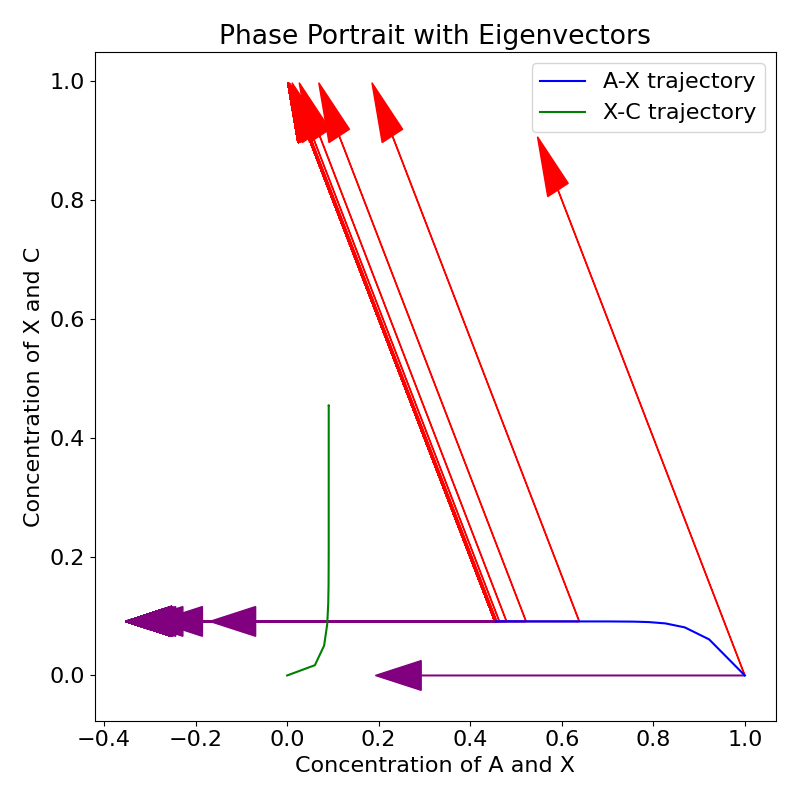

In [29]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint
from scipy.linalg import eig

# Kinetic rate constants
k1, k2, k3, k4, k5, k6 = 0.1, 1, 10, 10, 1, 0.1

# Effective rate constants for the reduced model
k1_eff = k1
k2_eff = k2 * k4 / (k3 + k4)
k5_eff = k5 * k3 / (k3 + k4)
k6_eff = k6

# ODE system (reduced model)
def ode_system(y, t):
    A, X, C = y
    dA_dt = k2_eff * X - k1_eff * A
    dX_dt = k1_eff * A - k2_eff * X + k6_eff * C - k5_eff * X
    dC_dt = k5_eff * X - k6_eff * C
    return [dA_dt, dX_dt, dC_dt]

# Jacobian of the system
def jacobian(y):
    A, X, C = y
    return np.array([[-k1_eff, k2_eff, 0],
                     [k1_eff, -(k2_eff + k5_eff), k6_eff],
                     [0, k5_eff, -k6_eff]])

# Initial conditions: [A, X, C]
initial_conditions = [1.0, 0.0, 0.0]

# Time grid for integration
t = np.linspace(0, 1000, 1000)

# Integrate the ODEs
trajectory = odeint(ode_system, initial_conditions, t)

# Calculate eigenvalues and eigenvectors at each point along the trajectory
eigenvalues = []
eigenvectors = []
for point in trajectory:
    J = jacobian(point)
    e_vals, e_vecs = eig(J)
    eigenvalues.append(e_vals)
    eigenvectors.append(e_vecs)

# Phase portrait
fig, ax = plt.subplots()

# Plot trajectory
ax.plot(trajectory[:, 0], trajectory[:, 1], label='A-X trajectory', color='blue')
ax.plot(trajectory[:, 1], trajectory[:, 2], label='X-C trajectory', color='green')

# Add eigenvectors as arrows
for i in range(0, len(trajectory), 10):
    point = trajectory[i]
    e_vecs = eigenvectors[i]
    ax.arrow(point[0], point[1], e_vecs[0, 0], e_vecs[1, 0], head_width=0.05, head_length=0.1, color='red')
    ax.arrow(point[0], point[1], e_vecs[0, 1], e_vecs[1, 1], head_width=0.05, head_length=0.1, color='purple')

# Labels and title
ax.set_xlabel('Concentration of A and X')
ax.set_ylabel('Concentration of X and C')
ax.legend()
plt.title('Phase Portrait with Eigenvectors')
plt.show()


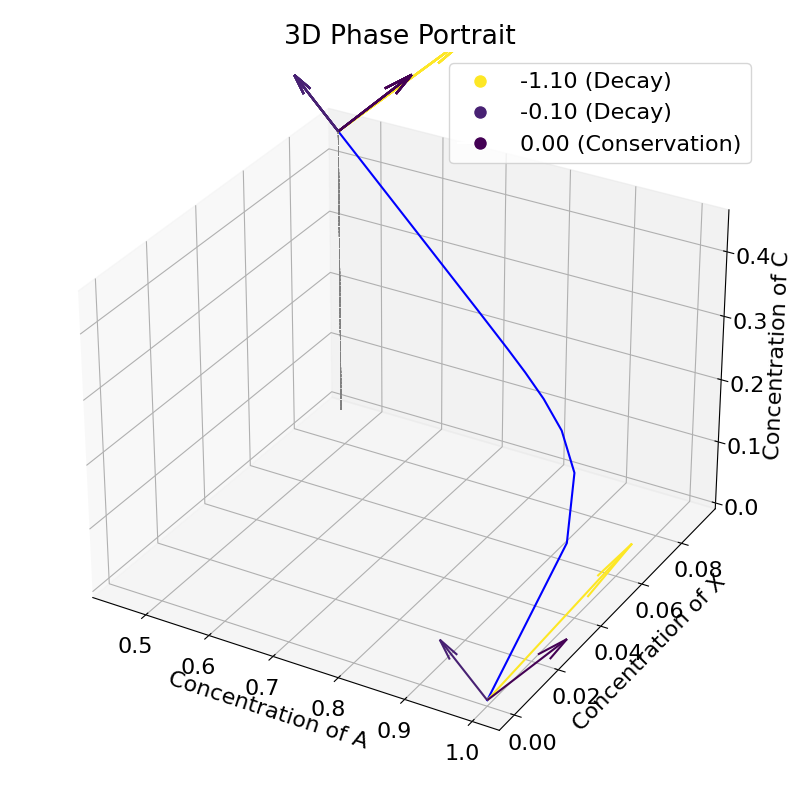

In [30]:
# Extract and print a subset of eigenvalues for analysis
subset_indices = list(range(0, len(eigenvalues), 100))  # Every 10th point along the trajectory
subset_eigenvalues = np.array(eigenvalues)[subset_indices]

# Color map for eigenvalues
color_map = plt.cm.get_cmap('viridis')

# Labels for eigenvalues
eigen_labels = {}

# Initialize 3D plot with colored eigenvectors, legends, and axis lines
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot 3D trajectory
ax.plot(trajectory[:, 0], trajectory[:, 1], trajectory[:, 2], label='Trajectory', color='blue')

# Add colored eigenvectors as arrows in 3D space with legends
for i, index in enumerate(subset_indices):
    point = trajectory[index]
    e_vals = eigenvalues[index]
    e_vecs = eigenvectors[index]
    
    for j in range(3):
        color = color_map(np.abs(e_vals[j].real) / np.max(np.abs(subset_eigenvalues.real)))
        label = f"{e_vals[j].real:.2f}"
        if np.isclose(e_vals[j].real, 0, atol=1e-6):
            label += " (Conservation)"
        elif e_vals[j].real < 0:
            label += " (Decay)"
        elif e_vals[j].real > 0:
            label += " (Growth)"
        
        eigen_labels[label] = color
        
        ax.quiver(point[0], point[1], point[2], 
                  e_vecs[0, j], e_vecs[1, j], e_vecs[2, j], 
                  length=0.1, color=color)

        # Draw lines to the bottom axes for better visualization
        ax.plot([point[0], point[0]], [point[1], point[1]], [point[2], 0], linestyle='--', linewidth=0.5, color='gray')

# Generate custom legend
legend_labels = [plt.Line2D([0], [0], marker='o', color='w', markersize=10, markerfacecolor=color, label=label) 
                 for label, color in eigen_labels.items()]

# Labels and title
ax.set_xlabel('Concentration of A')
ax.set_ylabel('Concentration of X')
ax.set_zlabel('Concentration of C')
plt.title('3D Phase Portrait')
ax.legend(handles=legend_labels)
plt.show()


##### How eigenvalues change

## Does the residence time of a pose matter? 

## Model Generator

In [13]:
import numpy as np
from scipy.integrate import solve_ivp
import re
import copy
#TODO: add error handling, documentation and logging info, and show the ODEs. Add stochastic method
class KineticModel:
    def __init__(self, config):
        """
        Species can contain name, conc, label. Conc will be the initial concentration.
        Transitions can contain name, from, to, value, label.
        """
        self.config=copy.deepcopy(config)
        self.species = self.config['species']
        self.species_order = {name: idx for idx, name in enumerate(self.config['species'])}
        self.transitions = self.config['transitions']
        # Preprocess the transitions with coefficients and names
        for name, tr in self.transitions.items():
            tr['from'] = [self.identify_coeff(s) for s in tr['from']]
            tr['to'] = [self.identify_coeff(s) for s in tr['to']]
        self.sol = None

    @staticmethod
    def identify_coeff(species_str):
        # Extract coefficient and species name from species string
        match = re.match(r"(\d*)(\D.*)", species_str)
        coeff = int(match.groups()[0]) if match and match.groups()[0] else 1
        name = match.groups()[1] if match else species_str
        return coeff, name  # Return a tuple of coefficient and species name

    def dcdt(self, t, concentrations):
        dcdt_arr = np.zeros(len(self.species))
        for name, tr in self.transitions.items():
            rate_constant = tr['value']

            rate = rate_constant * np.prod([concentrations[self.species_order[name]] ** coeff for coeff, name in tr['from']])
            for coeff, name in tr['from']:
                dcdt_arr[self.species_order[name]] -= coeff * rate

            for coeff, name in tr['to']:
                dcdt_arr[self.species_order[name]] += coeff * rate

        return dcdt_arr

    def solve_ode(self, t):
        conc0 = np.array([sp['conc'] for name, sp in self.species.items()])
        t_span = (t[0], t[-1])
        solution = solve_ivp(
            lambda t, conc: self.dcdt(t, conc),
            t_span, conc0, t_eval=t, method='BDF', rtol=1e-6, atol=1e-8
        )
        self.sol = solution.y.T

    def gillespie_sim(self):
        pass  # Gillespie algorithm to be implemented



In [332]:
def solveModel(t,model,occFitType=None):
    #TODO: change occfittype to be CO=None, TO=None by default. State is specified with species name. Check if fourstate gets same results with TO
    """
    occFitType must be CO or TO for covalent or total occupancy, respectively.
    """
    protein_conc=model.species["E"]["conc"]
    ligand_conc=model.species["I"]["conc"]
    model.solve_ode(t)
    if occFitType=="TO":
        occupancy=np.sum(model.sol[:, 2:], axis=1)
        kobs,KINum = kobsKIFromTotalOcc(t,occupancy,protein_conc,ligand_conc)
        return model,kobs,KINum
    elif occFitType=="CO":
        occupancy = model.sol[:,model.species_order["EI"]]
        kobs = kobsFromOcc(t,occupancy,protein_conc)
        return model,kobs
    elif occFitType is None:
        kobs = None
        return model,kobs
    else:
        raise ValueError("occFitType must be CO or TO for covalent or total occupancy, respectively.")

def makeIntRates(intOOM,Pf):
    """
    Provides rates between two states that are at rapid equilibrium and therefore approximated by the population distribution. 
    intOOM is the order of magnitude of the rates.
    Pf is the proportion of the forward state, ie kf/(kf+kb) or [B]/([A]+[B]) for A<-->B.
    """
    kf=Pf*10**(float(intOOM)+1)
    kb=10**(float(intOOM)+1)-kf
    return kf,kb

import math
def round_sig(num, sig_figs, autoformat=True):
    """
    Round up using significant figures.
    autoformat = True (default) formats into scientific notation if the order of magnitude more than +/- 3.
    """
    if num == 0:
        return 0.0

    order_of_magnitude = math.floor(math.log10(abs(num)))
    shift = sig_figs - 1 - order_of_magnitude

    # Scale the number, round it, and scale it back
    scaled_num = num * (10 ** shift)
    rounded_scaled_num = math.floor(scaled_num + 0.5)
    result = rounded_scaled_num / (10 ** shift)

    # Handling scientific notation conditionally
    if autoformat and (order_of_magnitude >= 4 or order_of_magnitude <= -4):
        return format(result, '.{0}e'.format(sig_figs - 1))
    else:
        return result

import numpy as np
import colorsys

def assign_colors_to_species(schemes, saturation_range=(0.5, 0.7), lightness_range=(0.3, 0.4), method=None, offset=0, overwrite_existing=False):
    """
    Assigns a distinct and aesthetically distributed color to each species in the provided dictionary of kinetic schemes. 
    Uses the golden ratio for even hue distribution.
    Method can be "GR" to use the golden ratio to generate the hues.
    Offset can be used to offset the hues.
    overwrite_existing: If True, overwrite existing colors; if False, assign colors only to species without colors.
    """

    unique_species = set()
    for scheme in schemes.values():
        unique_species.update(scheme["species"].keys())

    golden_ratio_conjugate = 0.618033988749895
    hue = 0

    n_colors = len(unique_species)
    color_mapping = {}
    hues = np.linspace(0, 1, n_colors, endpoint=False)

    for i, species in enumerate(unique_species):
        # Skip species with existing color unless overwriting
        if not overwrite_existing and "color" in scheme["species"][species]:
            continue

        if method == "GR":
            hue += golden_ratio_conjugate + offset
        else:
            hue = hues[i] + offset
        hue %= 1

        lightness = np.random.uniform(*lightness_range)
        saturation = np.random.uniform(*saturation_range)
        r, g, b = colorsys.hls_to_rgb(hue, lightness, saturation)
        hex_color = f'#{int(r * 255):02x}{int(g * 255):02x}{int(b * 255):02x}'
        color_mapping[species] = hex_color

    for scheme in schemes.values():
        for species in scheme["species"].keys():
            if overwrite_existing or "color" not in scheme["species"][species]:
                scheme["species"][species]["color"] = color_mapping.get(species, scheme["species"][species].get("color"))

    return schemes


### Use

In [346]:
Ki = 1 #nM, koff/kon
koff = 1/(15*60) #1/15 min converted to s 


conc0I,conc0E=3430,1

schemes = {}

#simple
schemes["S1"] = {
    "transitions": {
        "k1": {"value": koff/Ki, "from": ["E", "I"], "to": ["E___I"], "label": r"$k_{on}$"},
        "k2": {"value": koff, "from": ["E___I"], "to": ["E", "I"], "label": r"$k_{off}$"},
        "k3": {"value": 4.3e7, "from": ["E___I"], "to": ["E_I"]},
        "k4": {"value": 5.2e4, "from": ["E_I"], "to": ["E___I"]},
        "k5": {"value": 2.4e8, "from": ["E_I"], "to": ["E_I_"]}, #proton leaving
        "k6": {"value": 4.0e2, "from": ["E_I_"], "to": ["E_I"]}, #proton returning in pH 7.4
        "k7": {"value": 2.3e8, "from": ["E_I"], "to": ["EI"]}, #irrev step
        "k8": {"value": 0, "from": ["EI"], "to": ["E_I"]},
    },
    "species": {
        "I": {"conc": conc0I, "label": r"$I$"},
        "E": {"conc": conc0E, "label": r"$E$"},
        "E___I": {"conc": 0, "label": r"$E{\cdot}{\cdot}{\cdot}I$"},
        "E_I": {"conc": 0, "label": r"$E{\cdot}I$"},
        "E_I_": {"conc": 0, "label": r"$E{\cdot}I*$"},
        "EI": {"conc": 0, "label": r"$E\text{--}I$"},
    },
}

#main
kf,kb=makeIntRates(6,0.1) #microsecond intOOM = 6 
schemes["S2"] = {
    "transitions": {
        "k1": {"value": koff/Ki, "from": ["E", "I"], "to": ["E___I"], "label": r"$k_{on}$"},
        "k2": {"value": koff, "from": ["E___I"], "to": ["E", "I"], "label": r"$k_{off}$"},
        "k_ncf": {"value": kf, "from": ["E___I"], "to": ["noncovalent_good"]},
        "k_ncb": {"value": kb, "from": ["noncovalent_good"], "to": ["E___I"]},
        "k_nc-t": {"value": 1.8457E+04, "from": ["noncovalent_good"], "to": ["thiolate"]},
        "k_t-nc": {"value": 2.25220018E+11, "from": ["thiolate"], "to": ["noncovalent_good"]},
        "k3": {"value": 4.4152E+08, "from": ["thiolate"], "to": ["E_I"]},
        "k4": {"value": 7.28238E+05, "from": ["E_I"], "to": ["thiolate"]},
        "k5": {"value": 2.2E+09, "from": ["E_I"], "to": ["E_I_"]}, #proton leaving
        "k6": {"value": 4.0e2, "from": ["E_I_"], "to": ["E_I"]}, #proton returning in pH 7.4
        "k7": {"value": 1.028E+10, "from": ["E_I"], "to": ["EI"]}, #irrev step
        "k8": {"value": 2.501E-06, "from": ["EI"], "to": ["E_I"]},
    },
    "species": {
        "I": {"conc": conc0I, "label": r"$I$"},
        "E": {"conc": conc0E, "label": r"$E$"},
        "E___I": {"conc": 0, "label": r"$E{\mydot\mydot\mydot}I$"},
        "noncovalent_good": {"conc": 0, "label": r"$E{\mydot\mydot}I$"},
        "thiolate": {"conc": 0, "label": r"$E_{(thiolate)}^{-}{\mydot\mydot}I+H_{(site)}^{+}$"},
        "E_I": {"conc": 0, "label": r"$E{\mydash}I_{(enolate)}^{-}+H_{(site)}^{+}$"},
        "E_I_": {"conc": 0, "label": r"$E{\mydash}I_{(enolate)}^{-}+H_{(bulk)}^{+}$"},
        "EI": {"conc": 0, "label": r"$E{\mydash}I$"},
    },
}

#koff's 
schemes["S3"] = {
    "transitions": {
        "k1": {"value": koff/Ki, "from": ["E", "I"], "to": ["E___I"], "label": r"$k_{on}$"},
        "k2.1": {"value": koff, "from": ["E___I"], "to": ["E", "I"], "label": r"$k_{off}$"},
        "k2.2": {"value": koff, "from": ["noncovalent_good"], "to": ["E", "I"], "label": r"$k_{off}$"},
        "k2.3": {"value": koff, "from": ["thiolate"], "to": ["E", "I"], "label": r"$k_{off}$"},
        "k2.4": {"value": koff, "from": ["E_I"], "to": ["E", "I"], "label": r"$k_{off}$"},
        "k2.5": {"value": koff, "from": ["E_I_"], "to": ["E", "I"], "label": r"$k_{off}$"},
        "k_ncf": {"value": kf, "from": ["E___I"], "to": ["noncovalent_good"]},
        "k_ncb": {"value": kb, "from": ["noncovalent_good"], "to": ["E___I"]},
        "k_nc-t": {"value": 1.8457E+04, "from": ["noncovalent_good"], "to": ["thiolate"]},
        "k_t-nc": {"value": 2.25220018E+11, "from": ["thiolate"], "to": ["noncovalent_good"]},
        "k3": {"value": 4.4152E+08, "from": ["thiolate"], "to": ["E_I"]},
        "k4": {"value": 7.28238E+05, "from": ["E_I"], "to": ["thiolate"]},
        "k5": {"value": 2.2E+09, "from": ["E_I"], "to": ["E_I_"]}, #proton leaving
        "k6": {"value": 4.0e2, "from": ["E_I_"], "to": ["E_I"]}, #proton returning in pH 7.4
        "k7": {"value": 1.028E+10, "from": ["E_I"], "to": ["EI"]}, #irrev step
        "k8": {"value": 2.501E-06, "from": ["EI"], "to": ["E_I"]},
    },
    "species": {
        "I": {"conc": conc0I, "label": r"$I$"},
        "E": {"conc": conc0E, "label": r"$E$"},
        "E___I": {"conc": 0, "label": r"$E{\mydot\mydot\mydot}I$"},
        "noncovalent_good": {"conc": 0, "label": r"$E{\mydot\mydot}I$"},
        "thiolate": {"conc": 0, "label": r"$E_{(thiolate)}^{-}{\mydot\mydot}I+H_{(site)}^{+}$"},
        "E_I": {"conc": 0, "label": r"$E{\mydash}I_{(enolate)}^{-}+H_{(site)}^{+}$"},
        "E_I_": {"conc": 0, "label": r"$E{\mydash}I_{(enolate)}^{-}+H_{(bulk)}^{+}$"},
        "EI": {"conc": 0, "label": r"$E{\mydash}I$"},
    },
}

#99/1 bad/good instead of 90/10
kf,kb=makeIntRates(6,0.01) #microsecond intOOM = 6 
schemes["S4"] = {
    "transitions": {
        "k1": {"value": koff/Ki, "from": ["E", "I"], "to": ["E___I"], "label": r"$k_{on}$"},
        "k2": {"value": koff, "from": ["E___I"], "to": ["E", "I"], "label": r"$k_{off}$"},
        "k_ncf": {"value": kf, "from": ["E___I"], "to": ["noncovalent_good"]},
        "k_ncb": {"value": kb, "from": ["noncovalent_good"], "to": ["E___I"]},
        "k_nc-t": {"value": 1.8457E+04, "from": ["noncovalent_good"], "to": ["thiolate"]},
        "k_t-nc": {"value": 2.25220018E+11, "from": ["thiolate"], "to": ["noncovalent_good"]},
        "k3": {"value": 4.4152E+08, "from": ["thiolate"], "to": ["E_I"]},
        "k4": {"value": 7.28238E+05, "from": ["E_I"], "to": ["thiolate"]},
        "k5": {"value": 2.2E+09, "from": ["E_I"], "to": ["E_I_"]}, #proton leaving
        "k6": {"value": 4.0e2, "from": ["E_I_"], "to": ["E_I"]}, #proton returning in pH 7.4
        "k7": {"value": 1.028E+10, "from": ["E_I"], "to": ["EI"]}, #irrev step
        "k8": {"value": 2.501E-06, "from": ["EI"], "to": ["E_I"]},
    },
    "species": {
        "I": {"conc": conc0I, "label": r"$I$"},
        "E": {"conc": conc0E, "label": r"$E$"},
        "E___I": {"conc": 0, "label": r"$E{\mydot\mydot\mydot}I$"},
        "noncovalent_good": {"conc": 0, "label": r"$E{\mydot\mydot}I$"},
        "thiolate": {"conc": 0, "label": r"$E_{(thiolate)}^{-}{\mydot\mydot}I+H_{(site)}^{+}$"},
        "E_I": {"conc": 0, "label": r"$E{\mydash}I_{(enolate)}^{-}+H_{(site)}^{+}$"},
        "E_I_": {"conc": 0, "label": r"$E{\mydash}I_{(enolate)}^{-}+H_{(bulk)}^{+}$"},
        "EI": {"conc": 0, "label": r"$E{\mydash}I$"},
    },
}

#H+ cant leave
kf,kb=makeIntRates(6,0.1) #microsecond intOOM = 6 
schemes["H+ cannot leave"] = {
    "transitions": {
        "k1": {"value": koff/Ki, "from": ["E", "I"], "to": ["E___I"], "label": r"$k_{on}$"},
        "k2": {"value": koff, "from": ["E___I"], "to": ["E", "I"], "label": r"$k_{off}$"},
        "k_ncf": {"value": kf, "from": ["E___I"], "to": ["noncovalent_good"]},
        "k_ncb": {"value": kb, "from": ["noncovalent_good"], "to": ["E___I"]},
        "k_nc-t": {"value": 1.8457E+04, "from": ["noncovalent_good"], "to": ["thiolate"]},
        "k_t-nc": {"value": 2.25220018E+11, "from": ["thiolate"], "to": ["noncovalent_good"]},
        "k3": {"value": 4.4152E+08, "from": ["thiolate"], "to": ["E_I"]},
        "k4": {"value": 7.28238E+05, "from": ["E_I"], "to": ["thiolate"]},
        "k5": {"value": 0, "from": ["E_I"], "to": ["E_I_"]}, #proton leaving
        "k6": {"value": 4.0e2, "from": ["E_I_"], "to": ["E_I"]}, #proton returning in pH 7.4
        "k7": {"value": 1.028E+10, "from": ["E_I"], "to": ["EI"]}, #irrev step
        "k8": {"value": 2.501E-06, "from": ["EI"], "to": ["E_I"]},
    },
    "species": {
        "I": {"conc": conc0I, "label": r"$I$"},
        "E": {"conc": conc0E, "label": r"$E$"},
        "E___I": {"conc": 0, "label": r"$E{\mydot\mydot\mydot}I$"},
        "noncovalent_good": {"conc": 0, "label": r"$E{\mydot\mydot}I$"},
        "thiolate": {"conc": 0, "label": r"$E_{(thiolate)}^{-}{\mydot\mydot}I+H_{(site)}^{+}$"},
        "E_I": {"conc": 0, "label": r"$E{\mydash}I_{(enolate)}^{-}+H_{(site)}^{+}$"},
        "E_I_": {"conc": 0, "label": r"$E{\mydash}I_{(enolate)}^{-}+H_{(bulk)}^{+}$"},
        "EI": {"conc": 0, "label": r"$E{\mydash}I$"},
    },
}

#H+ cant return
kf,kb=makeIntRates(6,0.1) #microsecond intOOM = 6 
schemes["H+ cannot return"] = {
    "transitions": {
        "k1": {"value": koff/Ki, "from": ["E", "I"], "to": ["E___I"], "label": r"$k_{on}$"},
        "k2": {"value": koff, "from": ["E___I"], "to": ["E", "I"], "label": r"$k_{off}$"},
        "k_ncf": {"value": kf, "from": ["E___I"], "to": ["noncovalent_good"]},
        "k_ncb": {"value": kb, "from": ["noncovalent_good"], "to": ["E___I"]},
        "k_nc-t": {"value": 1.8457E+04, "from": ["noncovalent_good"], "to": ["thiolate"]},
        "k_t-nc": {"value": 2.25220018E+11, "from": ["thiolate"], "to": ["noncovalent_good"]},
        "k3": {"value": 4.4152E+08, "from": ["thiolate"], "to": ["E_I"]},
        "k4": {"value": 7.28238E+05, "from": ["E_I"], "to": ["thiolate"]},
        "k5": {"value": 2.2E+09, "from": ["E_I"], "to": ["E_I_"]}, #proton leaving
        "k6": {"value": 0, "from": ["E_I_"], "to": ["E_I"]}, #proton returning in pH 7.4
        "k7": {"value": 1.028E+10, "from": ["E_I"], "to": ["EI"]}, #irrev step
        "k8": {"value": 2.501E-06, "from": ["EI"], "to": ["E_I"]},
    },
    "species": {
        "I": {"conc": conc0I, "label": r"$I$"},
        "E": {"conc": conc0E, "label": r"$E$"},
        "E___I": {"conc": 0, "label": r"$E{\mydot\mydot\mydot}I$"},
        "noncovalent_good": {"conc": 0, "label": r"$E{\mydot\mydot}I$"},
        "thiolate": {"conc": 0, "label": r"$E_{(thiolate)}^{-}{\mydot\mydot}I+H_{(site)}^{+}$"},
        "E_I": {"conc": 0, "label": r"$E{\mydash}I_{(enolate)}^{-}+H_{(site)}^{+}$"},
        "E_I_": {"conc": 0, "label": r"$E{\mydash}I_{(enolate)}^{-}+H_{(bulk)}^{+}$"},
        "EI": {"conc": 0, "label": r"$E{\mydash}I$"},
    },
}

#H+ cant return
kf,kb=makeIntRates(6,0.1) #microsecond intOOM = 6 
schemes["Indirect and Direct"] = {
    "transitions": {
        "k1": {"value": koff/Ki, "from": ["E", "I"], "to": ["E___I"], "label": r"$k_{on}$"},
        "k2": {"value": koff, "from": ["E___I"], "to": ["E", "I"], "label": r"$k_{off}$"},
        "k_ncf": {"value": kf, "from": ["E___I"], "to": ["noncovalent_good"]},
        "k_ncb": {"value": kb, "from": ["noncovalent_good"], "to": ["E___I"]},
        "k_nc-t": {"value": 1.8457E+04, "from": ["noncovalent_good"], "to": ["thiolate"]},
        "k_t-nc": {"value": 2.25220018E+11, "from": ["thiolate"], "to": ["noncovalent_good"]},
        "k3": {"value": 4.4152E+08, "from": ["thiolate"], "to": ["E_I"]},
        "k4": {"value": 7.28238E+05, "from": ["E_I"], "to": ["thiolate"]},
        "k5": {"value": 2.2E+09, "from": ["E_I"], "to": ["E_I_"]}, #proton leaving
        "k6": {"value": 4.0e2, "from": ["E_I_"], "to": ["E_I_returned"]}, #proton returning in pH 7.4
        "k7": {"value": 1.028E+10, "from": ["E_I"], "to": ["EI"]}, #irrev step for direct
        "k8": {"value": 2.501E-06, "from": ["EI"], "to": ["E_I"]}, 
        "k7.2": {"value": 1.028E+10, "from": ["E_I_returned"], "to": ["EI_indirect"]}, #irrev step for indirect
        "k8.2": {"value": 2.501E-06, "from": ["EI_indirect"], "to": ["E_I_returned"]}, 
    },
    "species": {
        "I": {"conc": conc0I, "label": r"$I$"},
        "E": {"conc": conc0E, "label": r"$E$"},
        "E___I": {"conc": 0, "label": r"$E{\mydot\mydot\mydot}I$"},
        "noncovalent_good": {"conc": 0, "label": r"$E{\mydot\mydot}I$"},
        "thiolate": {"conc": 0, "label": r"$E_{(thiolate)}^{-}{\mydot\mydot}I+H_{(site)}^{+}$"},
        "E_I": {"conc": 0, "label": r"$E{\mydash}I_{(enolate)}^{-}+H_{(site)}^{+}$"},
        "E_I_": {"conc": 0, "label": r"$E{\mydash}I_{(enolate)}^{-}+H_{(bulk)}^{+}$"},
        "EI": {"conc": 0, "label": r"$E{\mydash}I_{direct}$"},
        "E_I_returned": {"conc": 0, "label": r"$E{\mydash}I_{(enolate)}^{-}+H_{(returned)}^{+}$"},
        "EI_indirect": {"conc": 0, "label": r"$E{\mydash}I_{indirect}$"},

    },
}


schemes=assign_colors_to_species(schemes,saturation_range=(0.5,0.8),lightness_range=(0.4,0.5),offset=0.0,method="GR",overwrite_existing=False)

In [338]:
tabs = Tab()
tab_titles = []
tab_contents = []

for name,scheme in schemes.items():
    t = np.linspace(0.000001, 6, 1000)
    model=KineticModel(scheme)
    model,kobs=solveModel(t,model,"CO")
    
    fig = plt.figure(figsize=(10, 6))
    plt.title("Scheme "+ name)
    plt.plot(t, np.sum(model.sol[:, 2:], axis=1),label='All Bound States',color="grey")
    for species, props in model.species.items():
        if species == "I":
            continue
        plt.plot(t, model.sol[:, model.species_order[species]], label=props['label'],color=scheme["species"][species]["color"])
    
    plt.plot(t, occFromKobs(t,kobs,scheme["species"]["E"]["conc"]),label=r"$k_{\text{obs}}$ = "+str(round_sig(kobs,3))+r" $\text{s}^{-1}$",ls='--', color="black")
    #plt.plot(t, totalOccFromKobsKI(t,kobs,conc0Arr[1],conc0Arr[0],KINum),label='TO Fit',ls='--')
    
    plt.xlabel('Time (s)')
    plt.ylabel('Concentration (nM)')
    plt.legend(frameon=False)
    tab_contents.append(widgets.Output())
    tab_titles.append("Scheme "+ name)
    with tab_contents[-1]:
        display(fig)
    plt.close(fig)

tabs.children = tab_contents
for i in range(len(tab_titles)):
    tabs.set_title(i, tab_titles[i])
display(tabs)

In [212]:
print(1.028E+10/(1.028E+10+2.2E+09))
print(model.sol[:, model.species_order["EI"]][-1]/(model.sol[:, model.species_order["EI"]][-1]+model.sol[:, model.species_order["EI_indirect"]][-1]))

0.8237179487179487
0.8237159664127015


In [108]:
tabs = Tab()
tab_titles = []
tab_contents = []

concI_values = np.linspace(1,20000,200) #initial values of [I]
t = np.linspace(0.0001, 100, 100000)
for name,scheme in schemes.items():
    if name not in ["S2","S4","H+ cannot leave","H+ cannot return"]:
        continue
    scheme["kobsNum"]=[]
    model=KineticModel(scheme)
    for concI in concI_values:
        model.species["I"]["conc"]=concI
        model,kobs=solveModel(t,model,"CO")
        scheme["kobsNum"].append(kobs)
    KINum, kinactNum = kinactKIFromkobs(concI_values, scheme["kobsNum"])
    print('___________'+name+'___________\nKI: ',KINum,'\nkinact:',kinactNum)

    fig=plt.figure(figsize=(10, 6))
    plt.title("Scheme "+ name + ", Covalent Efficiency = "+str(round_sig(kinactNum/KINum,3))+r' $\text{nM}^{-1}\text{s}^{-1}$')
    plt.plot(concI_values, scheme["kobsNum"], label=f'Simulations',linestyle='-',alpha=1,color="black",lw=3)
    plt.plot(concI_values, kobsFromConcI(KINum,kinactNum,concI_values), 
             label=r"$K_{\text{I}}$ = "+str(round_sig(KINum,3))+' nM,\n'+r'$k_{\text{inact}}$ = '+str(round_sig(kinactNum,3))+r" $\text{s}^{-1}$",
             linestyle='--',alpha=1,color="red", lw=2)
    plt.xlabel(r'$[I]_{0}$ $(\text{nM})$')
    plt.ylabel(r'$k_{\text{obs}}$ ($\text{s}^{-1}$)')
    plt.legend(frameon=False)
    
    tab_contents.append(widgets.Output())
    tab_titles.append("Scheme "+ name)
    with tab_contents[-1]:
        display(fig)
    plt.close(fig)

tabs.children = tab_contents
for i in range(len(tab_titles)):
    tabs.set_title(i, tab_titles[i])
display(tabs)


___________S2___________
KI:  3433.145920268779 
kinact: 3.5958658499057856


___________S4___________
KI:  349.82028114042214 
kinact: 0.3616106761752316


___________H+ cannot leave___________
KI:  3433.9178868299846 
kinact: 3.596653058516823


___________H+ cannot return___________
KI:  3392.658970789125 
kinact: 3.361158152574429


#### Scaling rates to match a target value

In [246]:

Ki = 1 #nM, koff/kon
koff = 1/(15*60) #1/15 min converted to s 

conc0I,conc0E=3430,1

schemes = {}

#scaled
# Goal is to bring kinact down from 3.6 to 2.66e-2
F = 0.00738888888 #scaling factor
kf,kb = makeIntRates(6,0.1*F) #microsecond intOOM = 6 
schemes["Scaled Rates"] = {
    "transitions": {
        "k1": {"value": koff/Ki, "from": ["E", "I"], "to": ["E___I"], "label": r"$k_{on}$"},
        "k2": {"value": koff, "from": ["E___I"], "to": ["E", "I"], "label": r"$k_{off}$"},
        "k_ncf": {"value": kf, "from": ["E___I"], "to": ["noncovalent_good"]},
        "k_ncb": {"value": kb, "from": ["noncovalent_good"], "to": ["E___I"]},
        "k_nc-t": {"value": 1.8457E+04, "from": ["noncovalent_good"], "to": ["thiolate"]},
        "k_t-nc": {"value": 2.25220018E+11, "from": ["thiolate"], "to": ["noncovalent_good"]},
        "k3": {"value": 4.4152E+08, "from": ["thiolate"], "to": ["E_I"]},
        "k4": {"value": 7.28238E+05, "from": ["E_I"], "to": ["thiolate"]},
        "k5": {"value": 2.2E+09, "from": ["E_I"], "to": ["E_I_"]}, #proton leaving
        "k6": {"value": 4.0e2, "from": ["E_I_"], "to": ["E_I"]}, #proton returning in pH 7.4
        "k7": {"value": 1.028E+10, "from": ["E_I"], "to": ["EI"]}, #irrev step
        "k8": {"value": 2.501E-06, "from": ["EI"], "to": ["E_I"]},
    },
    "species": {
        "I": {"conc": conc0I, "label": r"$I$"},
        "E": {"conc": conc0E, "label": r"$E$"},
        "E___I": {"conc": 0, "label": r"$E{\mydot\mydot\mydot}I$"},
        "noncovalent_good": {"conc": 0, "label": r"$E{\mydot\mydot}I$"},
        "thiolate": {"conc": 0, "label": r"$E_{(thiolate)}^{-}{\mydot\mydot}I+H_{(site)}^{+}$"},
        "E_I": {"conc": 0, "label": r"$E{\mydash}I_{(enolate)}^{-}+H_{(site)}^{+}$"},
        "E_I_": {"conc": 0, "label": r"$E{\mydash}I_{(enolate)}^{-}+H_{(bulk)}^{+}$"},
        "EI": {"conc": 0, "label": r"$E{\mydash}I$"},
    },
}



In [247]:
tabs = Tab()
tab_titles = []
tab_contents = []

concI_values = np.linspace(1,20000,100) #initial values of [I]
t = np.linspace(0.0001, 100, 100000)
for name,scheme in schemes.items():
    scheme["kobsNum"]=[]
    model=KineticModel(scheme)
    for concI in concI_values:
        model.species["I"]["conc"]=concI
        model,kobs=solveModel(t,model,"CO")
        scheme["kobsNum"].append(kobs)
    KINum, kinactNum = kinactKIFromkobs(concI_values, scheme["kobsNum"])
    print('___________'+name+'___________\nKI: ',KINum,'\nkinact:',kinactNum)

    fig=plt.figure(figsize=(10, 6))
    plt.title("Scheme "+ name + ", Covalent Efficiency = "+str(round_sig(kinactNum/KINum,3))+r' $\text{nM}^{-1}\text{s}^{-1}$')
    plt.plot(concI_values, scheme["kobsNum"], label=f'Simulations',linestyle='-',alpha=1,color="black",lw=3)
    plt.plot(concI_values, kobsFromConcI(KINum,kinactNum,concI_values), 
             label=r"$K_{\text{I}}$ = "+str(round_sig(KINum,3))+' nM,\n'+r'$k_{\text{inact}}$ = '+str(round_sig(kinactNum,3))+r" $\text{s}^{-1}$",
             linestyle='--',alpha=1,color="red", lw=2)
    plt.xlabel(r'$[I]_{0}$ $(\text{nM})$')
    plt.ylabel(r'$k_{\text{obs}}$ ($\text{s}^{-1}$)')
    plt.legend(frameon=False)
    
    tab_contents.append(widgets.Output())
    tab_titles.append("Scheme "+ name)
    with tab_contents[-1]:
        display(fig)
    plt.close(fig)

tabs.children = tab_contents
for i in range(len(tab_titles)):
    tabs.set_title(i, tab_titles[i])
display(tabs)

___________Scaled Rates___________
KI:  29.244816292645737 
kinact: 0.026691026778949203


### Nice Plots 
 - for QM paper

Scheme S2
kobs = 1.79


/tmp/ipykernel_3004217/2518398949.py:36: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.savefig('conc_vs_time.eps', format='eps')
/home/kyle/miniconda3/lib/python3.11/site-packages/ipympl/backend_nbagg.py:336: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  self.figure.savefig(buf, format='png', dpi='figure')


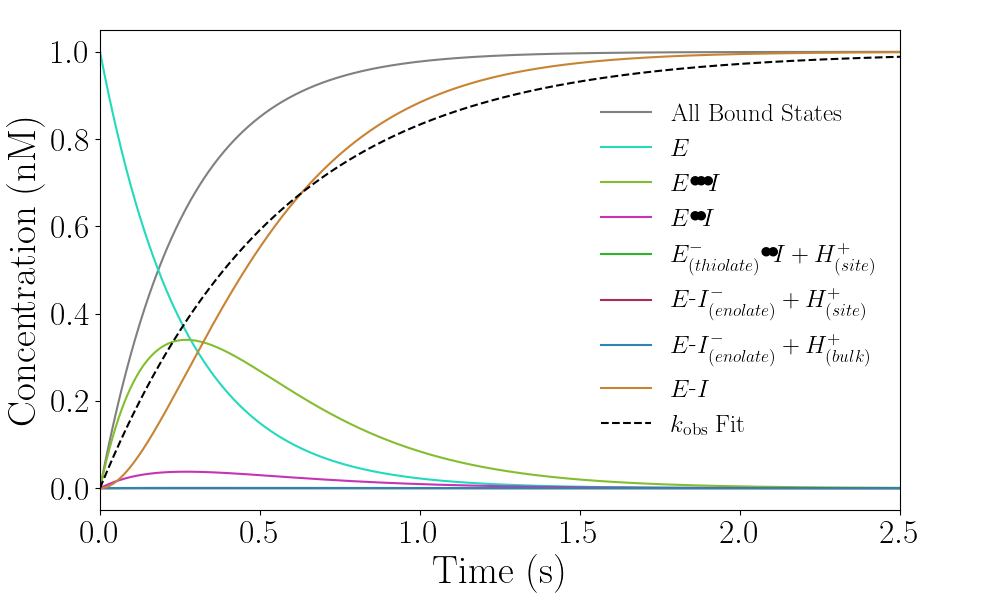

In [347]:
for name,scheme in schemes.items():
    if name != "S2":
        continue
    t = np.linspace(0.0001, 2.5, 10000)
    model=KineticModel(scheme)
    model,kobs=solveModel(t,model,"CO")
    
    # Create figure and add axes manually
    fig = plt.figure(figsize=(10, 6))
    ax = fig.add_axes([0.1, 0.15, 0.8, 0.8])  # [left, bottom, width, height]
    ax.tick_params(axis='both', which='major', labelsize=24) 

    #plt.title("Scheme "+ name)
    print("Scheme "+ name)

    ax.plot(t, np.sum(model.sol[:, 2:], axis=1),label='All Bound States',color="grey")
    for species, props in model.species.items():
        if species == "I":
            continue
        ax.plot(t, model.sol[:, model.species_order[species]], label=props['label'],color=scheme["species"][species]["color"])
    
    ax.plot(t, occFromKobs(t,kobs,scheme["species"]["E"]["conc"]),
            #label=r"$k_{\text{obs}}$ = "+str(round_sig(kobs,3))+r" $\text{s}^{-1}$" 
            label=r"$k_{\text{obs}}$ Fit",
            ls='--',color="black")
    print(f"kobs = {str(round_sig(kobs,3))}")
    #plt.plot(t, totalOccFromKobsKI(t,kobs,conc0Arr[1],conc0Arr[0],KINum),label='TO Fit',ls='--')

    ax.set_xlim(0, t.max())
    ax.set_xlabel('Time (s)',fontsize=28)
    ax.set_ylabel('Concentration (nM)',fontsize=28)
    ax.legend(frameon=False,fontsize=18)
    
    #fig.show()
    #fig.savefig('conc_vs_time.png', format='png',dpi=300)
    fig.savefig('conc_vs_time.eps', format='eps')



___________S2___________
KI:  232.60685494870438 
kinact: 3.606828634983429
Scheme S2, Covalent Efficiency = 0.0155 $\text{nM}^{-1}\text{s}^{-1}$


/tmp/ipykernel_3004217/718256309.py:35: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.savefig('kobs_vs_conc0I.eps', format='eps')
/home/kyle/miniconda3/lib/python3.11/site-packages/ipympl/backend_nbagg.py:336: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  self.figure.savefig(buf, format='png', dpi='figure')


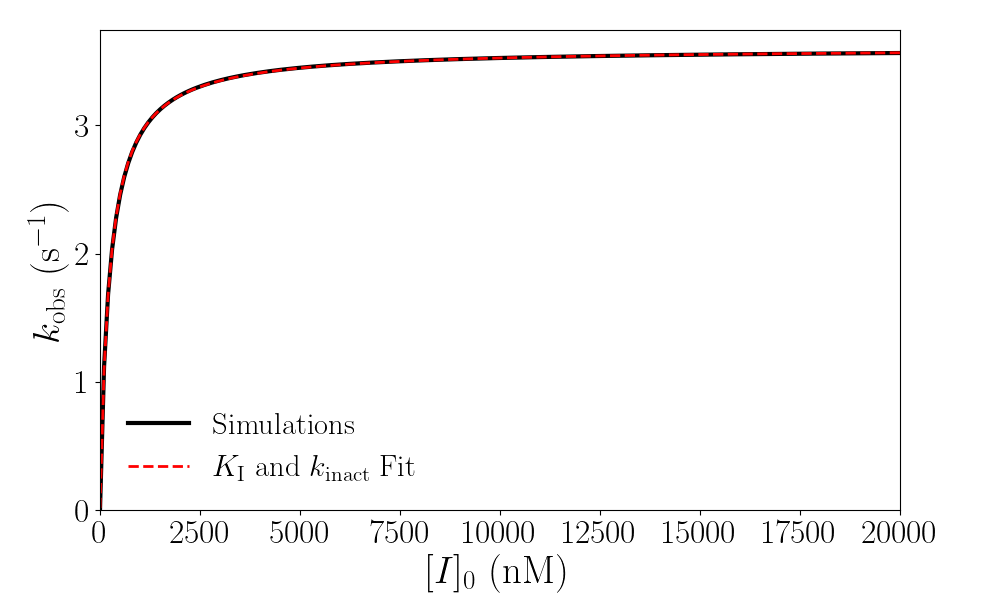

In [343]:


concI_values = np.linspace(1,20000,200) #initial values of [I]
t = np.linspace(0.0001, 100, 100000)
for name,scheme in schemes.items():
    if name != "S2":
        continue
    scheme["kobsNum"]=[]
    model=KineticModel(scheme)
    for concI in concI_values:
        model.species["I"]["conc"]=concI
        model,kobs=solveModel(t,model,"CO")
        scheme["kobsNum"].append(kobs)
    KINum, kinactNum = kinactKIFromkobs(concI_values, scheme["kobsNum"])
    print('___________'+name+'___________\nKI: ',KINum,'\nkinact:',kinactNum)

    # Create figure and add axes manually
    fig = plt.figure(figsize=(10, 6))
    ax = fig.add_axes([0.1, 0.15, 0.8, 0.8])  # [left, bottom, width, height]
    ax.tick_params(axis='both', which='major', labelsize=24) 
    
    #plt.title("Scheme "+ name + ", Covalent Efficiency = "+str(round_sig(kinactNum/KINum,3))+r' $\text{nM}^{-1}\text{s}^{-1}$')
    print("Scheme "+ name + ", Covalent Efficiency = "+str(round_sig(kinactNum/KINum,3))+r' $\text{nM}^{-1}\text{s}^{-1}$')

    ax.plot(concI_values, scheme["kobsNum"], label=f'Simulations',linestyle='-',alpha=1,color="black",lw=3)
    ax.plot(concI_values, kobsFromConcI(KINum,kinactNum,concI_values), 
             #label=r"$K_{\text{I}}$ = "+str(round_sig(KINum,3))+' nM,\n'+r'$k_{\text{inact}}$ = '+str(round_sig(kinactNum,3))+r" $\text{s}^{-1}$",
             label=r"$K_{\text{I}}$ and $k_{\text{inact}}$ Fit",
             ls='--',alpha=1,color="red", lw=2)
    
    ax.set_xlim(0, concI_values.max())
    ax.set_ylim(bottom=0)
    ax.set_xlabel(r'$[I]_{0}$ (nM)',fontsize=28)
    ax.set_ylabel(r'$k_{\text{obs}}$ ($\text{s}^{-1}$)',fontsize=28)
    ax.legend(frameon=False,fontsize=22)
    #fig.show()
    fig.savefig('kobs_vs_conc0I.eps', format='eps')



## Scheme 1


### Define

In [326]:
from scipy.integrate import solve_ivp
# Refactor the dcdt method into a standalone function to be compiled into machine code
@njit
def dcdt_S1(t, concArr, params):
    """
    Define the function that describes the rate of change of the concentrations
    """
    k1, k2, k3, k4, k5, k6, k7, k8 = params
    I, E, E___I, E_I, E_I_, EI  = concArr
    dIdt = k2*E___I - k1*E*I
    dEdt = k2*E___I - k1*E*I 
    dE___Idt = k1*E*I - k2*E___I - k3*E___I + k4*E_I 
    dE_Idt = k3*E___I - k4*E_I - k7*E_I + k8*EI - k5*E_I + k6*E_I_
    dE_I_dt = k5*E_I - k6*E_I_
    dEIdt = k7*E_I - k8*EI
    return [dIdt, dEdt, dE___Idt, dE_Idt, dE_I_dt, dEIdt]

class Scheme1():
    """
    Attributes:
        conc0Arr (List[float]): Initial concentrations array in the order: [I, E, E***I, E*I, E*I*, E-I]

    E + I <--k1/k2-->  E***I  <--k3/k4-->  E*I  <--k7/k8-->  E-I
                                            ^
                                          k6|k5
                                            v
                                            E*I*
    """
    def __init__(self, **kwargs):
        # Store all keyword arguments directly into the instance's __dict__
        self.__dict__.update(kwargs)
        
        # Set defaults or calculate other required attributes based on provided arguments
        if 'k2' in self.__dict__ and 'Ki' in self.__dict__:
            self.k1 = self.k2 / self.Ki
            print("k1:", self.k1)
            
        if 'intOOM' in self.__dict__ and 'Pf' in self.__dict__:
            self.k3, self.k4 = self.getIntRates(self.intOOM, self.Pf)


    def getIntRates(self,intOOM,Pf):
        kf=Pf*10**(float(intOOM)+1)
        kb=10**(float(intOOM)+1)-kf
        return kf,kb

    #solve_ivp version
    def solve(self, t):
        # Check for all required attributes before proceeding
        required_params = ['k1', 'k2', 'k3', 'k4', 'k5', 'k6', 'k7', 'k8', 'conc0Arr']
        missing_params = [param for param in required_params if not hasattr(self, param)]
        if missing_params:
            raise AttributeError(f"Missing required parameters: {', '.join(missing_params)}")
        
        t_span = (t[0], t[-1])
        params = (self.k1, self.k2, self.k3, self.k4, self.k5, self.k6, self.k7, self.k8)
        solution = solve_ivp(dcdt_S1, t_span, self.conc0Arr, t_eval=t, args=(params,), method='BDF', rtol=1e-6, atol=1e-8)
        return solution.y.T


In [374]:
1*10**-6.36*1e9

436.51583224016565

### Use

k1: 0.0011111111111111111
kobs: 10.974610932245378


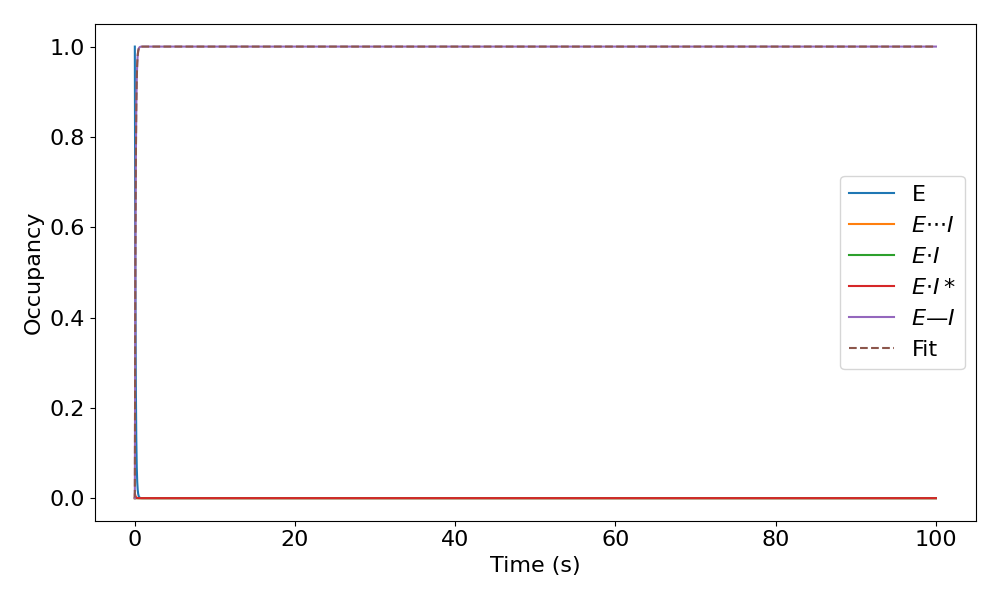

In [449]:
import timeit
t = np.linspace(0.0001, 100, 10000)
conc0Arr=[10000,1,0,0,0,0]
Ki = 1 #nM, koff/kon
koff = 1/(15*60) #1/15 min converted to s 
model = Scheme1(conc0Arr=conc0Arr,k2=koff, Ki=Ki, k3=4.3e7, k4=5.2e4, k5=2.4e8, k6=1.0e3, k7=2.4e8,k8=0)
sol = model.solve(t)

#final
occupancy = sol[:,-1]
kobs = kobsFromOcc(t,occupancy,conc0Arr[1])

print("kobs:",kobs)

plt.figure(figsize=(10, 6))

#plt.plot(t, sol[:, 0],label='I')
plt.plot(t, sol[:, 1],label='E')
plt.plot(t, sol[:, 2],label=r'$E{\cdot}{\cdot}{\cdot}I$')
plt.plot(t, sol[:, 3],label=r'$E{\cdot}I$')
plt.plot(t, sol[:, 4],label=r'$E{\cdot}I*$')
plt.plot(t, sol[:, 5],label=r'$E\text{--}I$')
plt.plot(t, occFromKobs(t,kobs,conc0Arr[1]),label='Fit',ls='--')
#plt.plot(t, np.sum(sol[:, 2:], axis=1),label='All Bound States')

plt.xlabel('Time (s)')
plt.ylabel('Occupancy')
plt.legend()
plt.show()

k1: 0.016666666666666666


KI3: Num=173703, Anal=0		      kinact3: Num=1702.23434, Anal=0


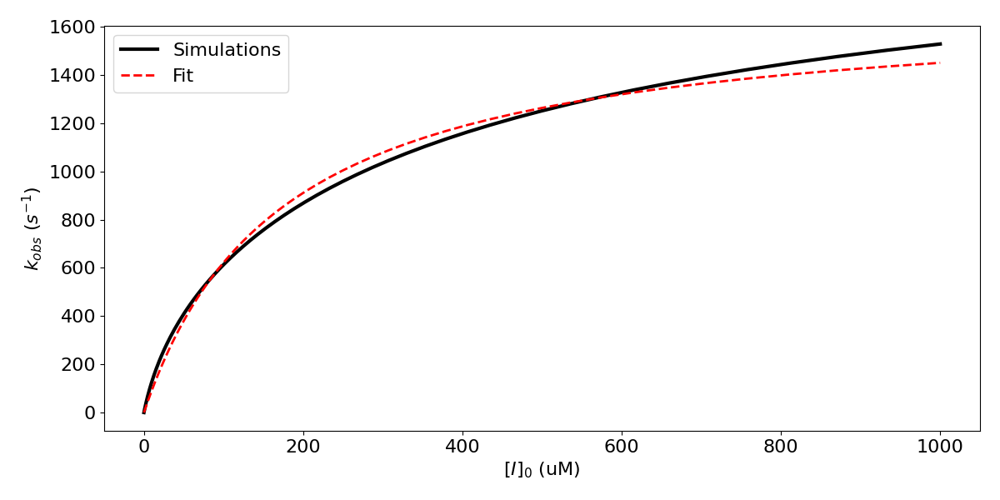

In [691]:

kobsNum = []

concI_values = np.linspace(1,1000000,200) #initial values of [I]
t = np.linspace(0.0001, 100, 10000)
conc0Arr=[1.615055829,1,0,0,0,0]
model = Scheme1(conc0Arr=conc0Arr,k2=1/(60), Ki=1, k3=4.3e7, k4=5.2e4, k5=2.4e8, k6=1.0e3, k7=2.4e8,k8=0)
for concI in concI_values:
    model.conc0Arr[0]=concI
    sol = model.solve(t)
    occupancy = sol[:,-1]
    kobs = kobsFromOcc(t,occupancy,conc0Arr[1])
    kobsNum.append(kobs)


#note that analytical calc of kinact is kcat*[Etotal], but [Etotal] is normalized to 1!
KI3Num, kinact3Num = kinactKIFromkobs(concI_values, kobsNum)
kinact3Anal=0#kinactf #*Ptotal3 
KI3Anal=0#(model.k2+kinact3Anal)/model.k1
print(f"KI3: Num={round(KI3Num)}, Anal={round(KI3Anal)}\t\t\
      kinact3: Num={round(kinact3Num,5)}, Anal={round(kinact3Anal,5)}")
#kobsAnal3=kobsFromConcI(KI3Anal,kinact3Anal,concI_values)


plt.figure(figsize=(12, 6))



plt.plot(concI_values/1000, kobsNum, label=f'Simulations',linestyle='-',alpha=1,color="black",lw=3)
plt.plot(concI_values/1000, kobsFromConcI(KI3Num,kinact3Num,concI_values), label=f'Fit',linestyle='--',alpha=1,color="red", lw=2)

# Grey dashed line for kinact3Num
#plt.axhline(y=kinact3Num, color='white', linestyle='--')
#plt.text(0, kinact3Num, '$k_{inact}$', verticalalignment='top', horizontalalignment='left', color='black', fontsize=20)

#ax = plt.gca()
#xmin=ax.get_xlim()[0]
#ymin=ax.get_ylim()[0]
#plt.xlim(ax.get_xlim()[0],ax.get_xlim()[1])
#plt.ylim(ax.get_ylim()[0],ax.get_ylim()[1])

# Identify the concentration where kobs is closest to half_kinact3Num
#half_kinact3Num = kinact3Num / 2
#idx_half_kinact3 = np.abs(np.array(kobsNum3) - half_kinact3Num).argmin()
#concI_half_kinact3 = concI_values[idx_half_kinact3]

# Grey dashed lines for KI3Num: horizontal and vertical
#plt.hlines(y=half_kinact3Num, xmin=xmin, xmax=concI_half_kinact3, color='grey', linestyle='--')
#plt.vlines(x=concI_half_kinact3, ymin=ymin, ymax=half_kinact3Num, color='grey', linestyle='--')
#plt.text(KI3Num, 0, ' $K_I$', verticalalignment='bottom', horizontalalignment='left', color='black', fontsize=20)
#plt.text(0, kinact3Num/2, r'$\frac{k_{inact}}{2}$', verticalalignment='bottom', horizontalalignment='right', color='black', fontsize=16)

#plt.xlim(xmin)

plt.xlabel('$[I]_{0}$ (uM)')
plt.ylabel('$k_{obs}$ ($s^{-1}$)')
plt.legend()
plt.show()

## Misc Util

In [216]:
def percent_change(num_init,num_final):
    diff=num_final-num_init
    change=(diff/num_init)*100 #%
    print(f"{round_sig(change,3)}% change from {num_init} to {num_final}")
    return change

change=percent_change(3426.1989961608606,3012.3443229421687)



-12.1% change from 3426.1989961608606 to 3012.3443229421687
